# Predictive Modelling of Used-Car Prices (AutoTrader UK, ~400k records)

Author: **Paramesh Kumar Bukya**  
Project type: **MSc Data Science — Machine Learning Coursework (Manchester Metropolitan University)**  

This notebook contains a complete, runnable workflow for predicting used-car prices using the AutoTrader dataset.

**How to run (for recruiters/reviewers):**
1. Place the CSV file named `adverts.csv` in the **same folder** as this notebook.
2. Open the notebook in Jupyter (or VS Code) with Python 3.x.
3. Make sure the following packages are installed: `numpy`, `pandas`, `matplotlib`, `seaborn`, `scikit-learn`.
4. Run the cells from top to bottom (Kernel → Restart & Run All). No code edits are required.

The notebook covers:
- Exploratory Data Analysis (EDA)
- Data cleaning and outlier handling
- Feature engineering
- Model training and evaluation (Decision Tree, kNN, Linear Regression)
- Hyperparameter tuning with GridSearchCV


In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)
%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, ParameterGrid,KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_absolute_error






In [3]:
#loading the data set and saving DataFrame as df.
df = pd.read_csv("/content/drive/MyDrive/adverts (4).csv")

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df.head(3)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol


In [5]:
df.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'price', 'body_type', 'crossover_car_and_van',
       'fuel_type'],
      dtype='object')

In [6]:
#to know type of feature
df.dtypes

,0
public_reference,int64
mileage,float64
reg_code,object
standard_colour,object
standard_make,object
standard_model,object
vehicle_condition,object
year_of_registration,float64
price,int64
body_type,object


In [7]:
#look the columns in data frame
df.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'price', 'body_type', 'crossover_car_and_van',
       'fuel_type'],
      dtype='object')

# type of features
Numerical                                   categorical
1.public_reference                      1.standard_colour
2.mileage                               2.standard_make
3.reg_code                              3.standard_model
4.year_of_registration                  4.vehicle_condition
5.price                                 5.body_type
                                        6.crossover_car_and_van
                                        7.fuel_type

# 1.1. Meaning and Type of Features

Mileage: The column mileage tells about number of kilometre or miles travelled by a car i.e the distance it covered in       travelling.
It is a Numerical type column.
This column indicates about the usage of vehicles i.e lower mileage vehicles are considered better than the higher mileage because lower mileage vehicles are less used.

Year of Registration:
This columns tells about the year in which the vehicle is officially registered for the first time.
This is a Numerical type of column.
This feature conveys the age of the vehicle. Generally latest year vehicles are considered to be good and has high market value.

Price:
This feature provides information about the costs involved in buying a car.
This is a Numerical type column.
This feature is most important factor for both buyer and seller which represents the amount of money that should be put on the car for buying and selling.

Fuel type:
This feature gives the information about the type of fuel used in the vehicle. Different types of fuels are Diesel, petrol, Gas, electric.
It is categorical column.
This feature provides details on the energy source which runs the vehicle. Generally people have priorities in fuel type to buy the vehicle. Different people choose differet fuel type of vehicles based on their usage.

Standard_make:
This column gives information about the manufacturer who produced, designed and branded the vehicle. Some of the brands like BMW, Audi, Benz, Ferrari etc.
It is a Categorical column.
This feature conveys  about the vehicle's origin or brand recognition. Vehicles from different manufacturers have different own style, characteristics, reputation and own logo of their brand.

Reg_code:
This column gives information about the in which region the car was registered.
This is a categorical feature as it contains both numbers  and alphabets.

Standard_colour:
This feature describes the colour of a Car.
This is a categorical feature.

Vehicle Condition:
This feature tells about condition of the car i.e either used or new car.
This feature is a category type.

Body_type:
This column tells about the type of body that car has. Each model or brand has some different body types or similar body types. Based on the body type prices may vary.
This is a categorical feature.




In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [9]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [10]:
print(df.isna().sum())

public_reference             0
mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64


# Analysis of data distributions





# price

In [11]:
df.shape


(402005, 12)

In [12]:
df['price'].describe()

,price
count,4.020050e+05
mean,1.734197e+04
std,4.643746e+04
min,1.200000e+02
25%,7.495000e+03
50%,1.260000e+04
75%,2.000000e+04
max,9.999999e+06


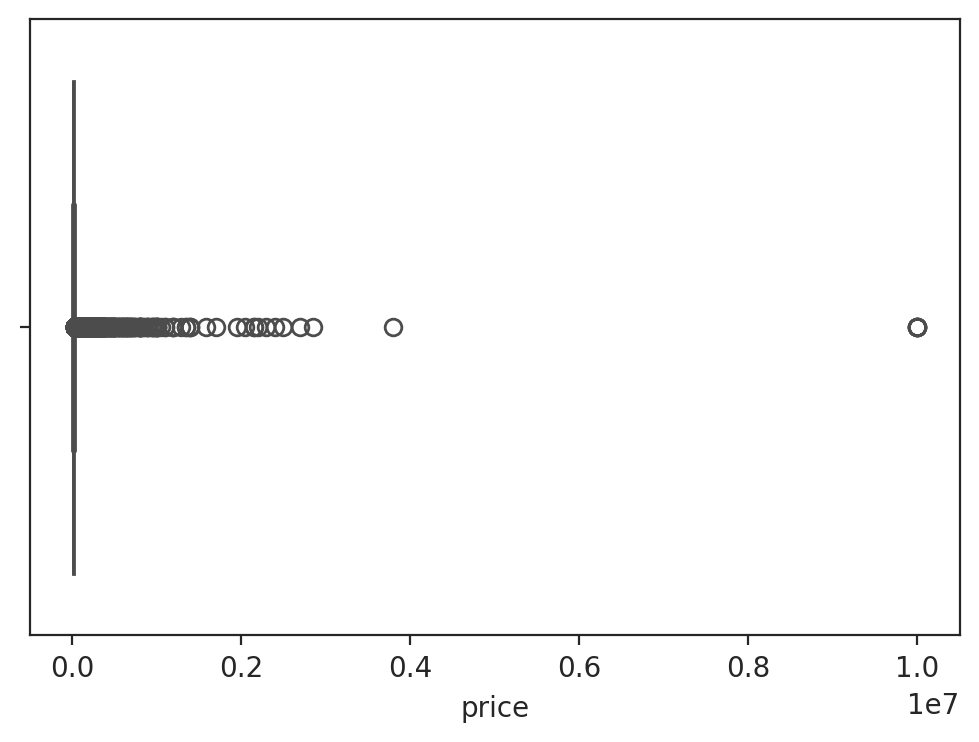

In [13]:
sns.boxplot(data = df,x='price');

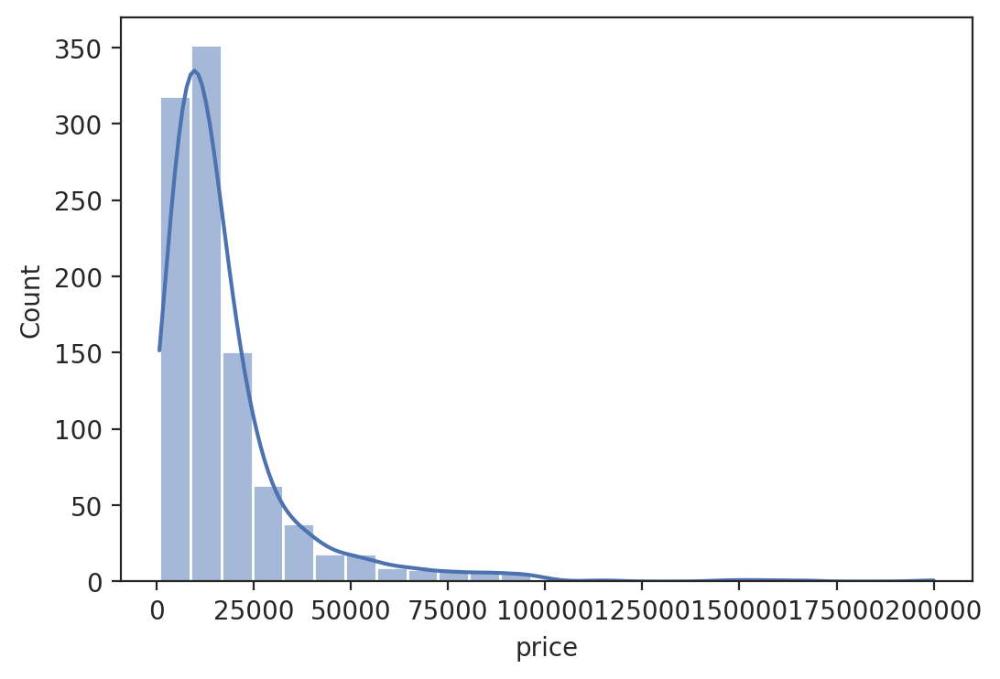

In [14]:
sns.histplot(data = df.sample(1000), x='price',kde = True, bins = 25);

<Axes: >

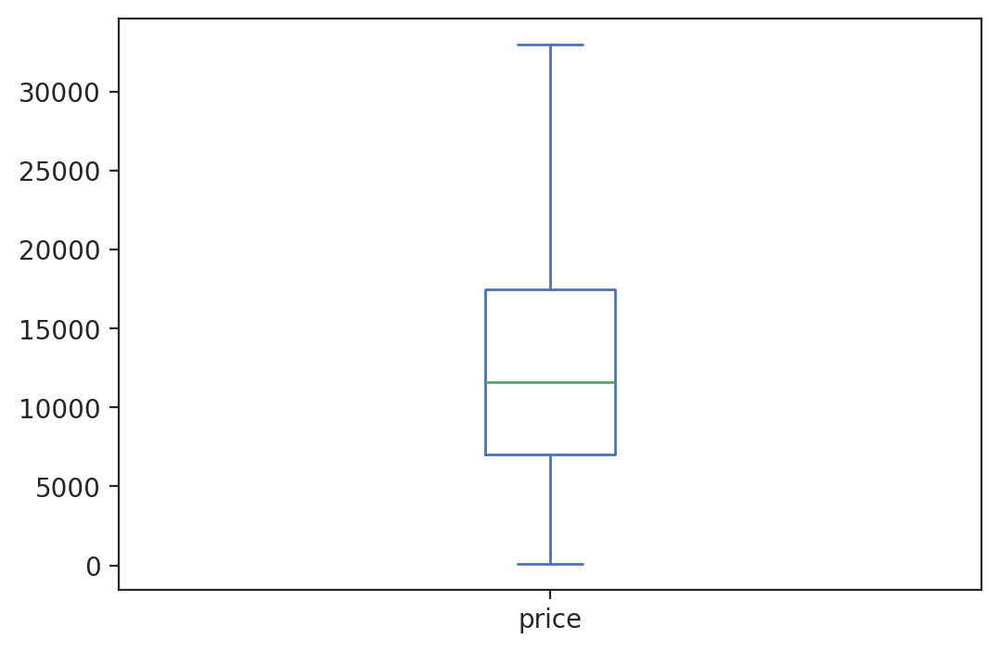

In [15]:
df[df['price'] <= 33000]['price'].plot(kind = 'box') # without outliers

In [16]:
df.query(" price >33000").shape[0]

36778

In [17]:
df.price.skew()

np.float64(154.68152711899864)

#Conclusion on price column with outliers:
Price column is positively right skewed
There are no missing values in the price column
There are outliers .

In [18]:
#finding outliers in price column.


There are different ways of finding outliers in column.
one of the type which I am using is Inter quantile range (IQR)

In [19]:
q1 = df['price'].quantile(0.25)
q3 = df['price'].quantile(0.75)
IQR =q3 -q1

In [21]:
outliers = df[(df['price']< (q1 - 1.5*IQR)) | (df['price']> (q3+1.5*IQR))]

In [22]:
outliers.shape # there are total of 26269 outliers in a price column.

(26269, 12)

In [23]:
bet_min_max =df[(df['price'] >=(q1 - 1.5*IQR) ) & (df['price'] <=(q3+1.5*IQR) )]# dataset between 25 and 75 percentile in price column
bet_min_max.shape

(375736, 12)

In [24]:
bet_min_max_without_outliers = df[(df['price'] >= 120) & (df['price']<= 33000) ] # price column with out outliers (zero outliers )

In [25]:
bet_min_max_without_outliers.shape

(365227, 12)

<Axes: xlabel='price'>

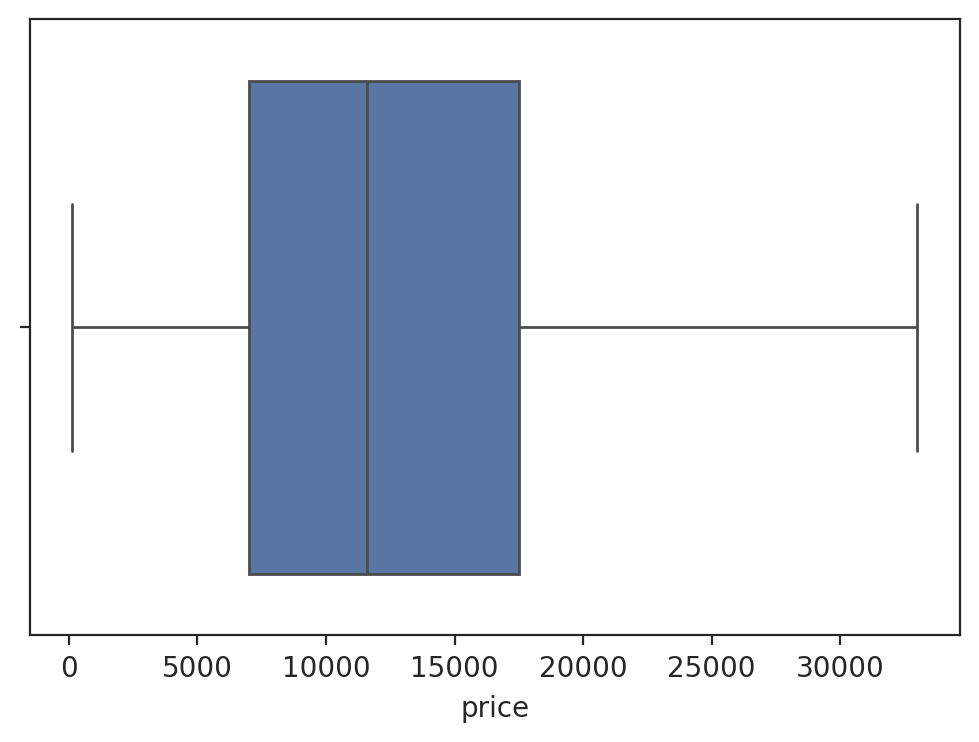

In [26]:
sns.boxplot(data = bet_min_max_without_outliers , x = 'price')

Conclusion:
outliers are should removed by IQR. The maximum price was 9999999
outliers are removed in the data cleaning section

# mileage


In [27]:
df.sample(10)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
117035,202008072228946,10657.0,N,Red,Volkswagen,Campervan,USED,1975.0,13750,Camper,False,Petrol
33603,202007291837260,34468.0,65,White,Volkswagen,Polo,USED,2016.0,8790,Hatchback,False,Petrol
177390,202010215257164,26733.0,67,White,Volkswagen,Scirocco,USED,2017.0,15650,Coupe,False,Diesel
133590,202010265453430,27930.0,17,Black,Volkswagen,Golf,USED,2017.0,13791,Hatchback,False,Petrol
257165,202006150144938,59000.0,67,White,Kia,Rio,USED,2017.0,7500,Hatchback,False,Petrol
351499,202010185134678,53892.0,17,Silver,BMW,i3,USED,2017.0,16700,Hatchback,False,Petrol Hybrid
23993,202006290657090,108000.0,56,Silver,Audi,TT,USED,2006.0,4495,Coupe,False,Petrol
19745,202008011973706,2881.0,20,Red,Audi,A3,USED,2020.0,28445,Hatchback,False,Petrol
264262,202010144995381,32191.0,17,Black,Audi,S5,USED,2017.0,26999,Coupe,False,Petrol
81042,202010295563340,14577.0,67,Grey,Volkswagen,Golf,USED,2017.0,15999,Hatchback,False,Diesel


In [28]:
#Summary Statistics
df['mileage'].describe()

,mileage
count,401878.000000
mean,37743.595656
std,34831.724018
min,0.000000
25%,10481.000000
50%,28629.500000
75%,56875.750000
max,999999.000000


In [29]:
df['mileage'].isna().sum() # there are 127 values in mileage column.

np.int64(127)

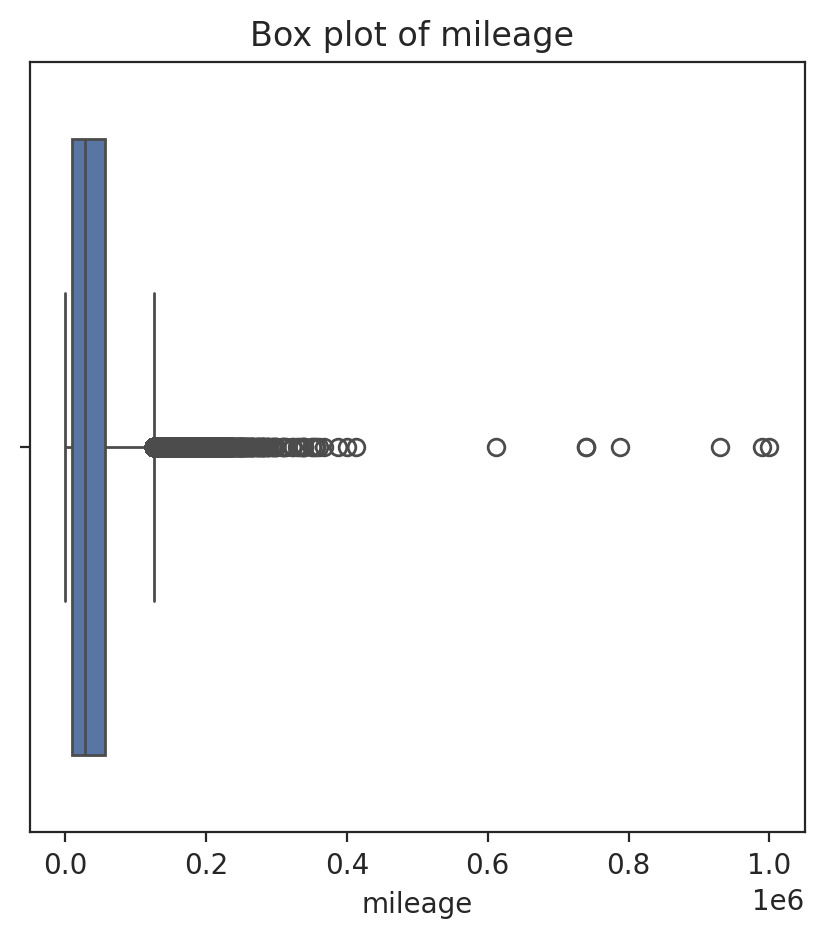

In [30]:
plt.figure(figsize=(5, 5))

#boxplot of mileage column
sns.boxplot(data = df, x = 'mileage')

plt.title('Box plot of mileage ');


In [32]:
df_subset = df[df['mileage']<200000]

<Axes: xlabel='mileage'>

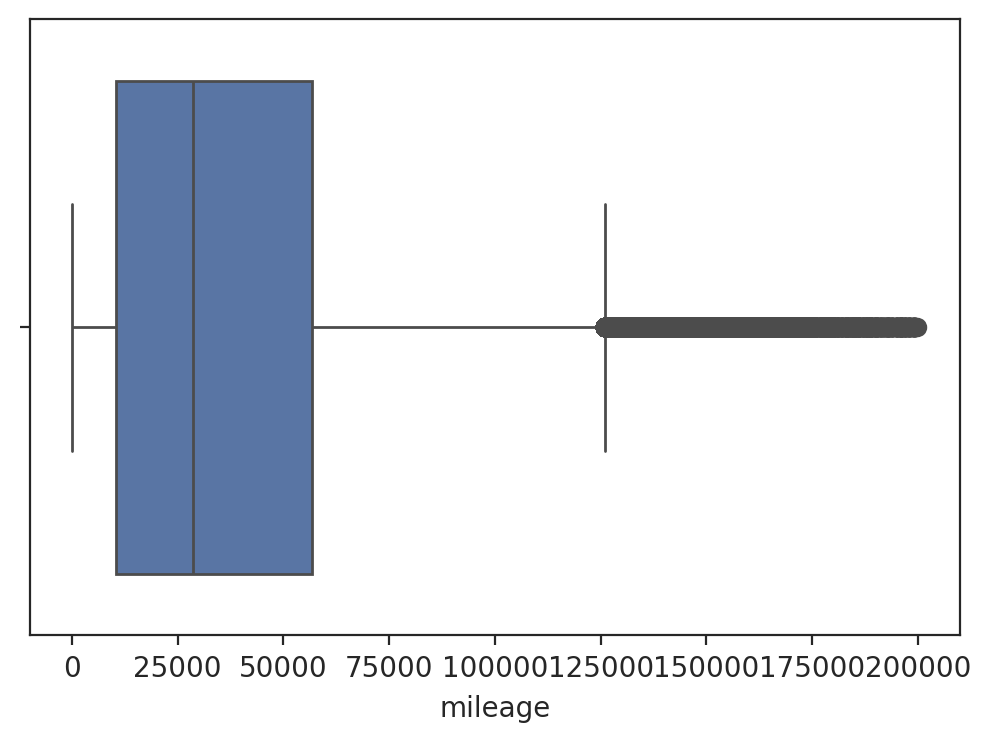

In [33]:
sns.boxplot(data = df_subset, x = 'mileage')

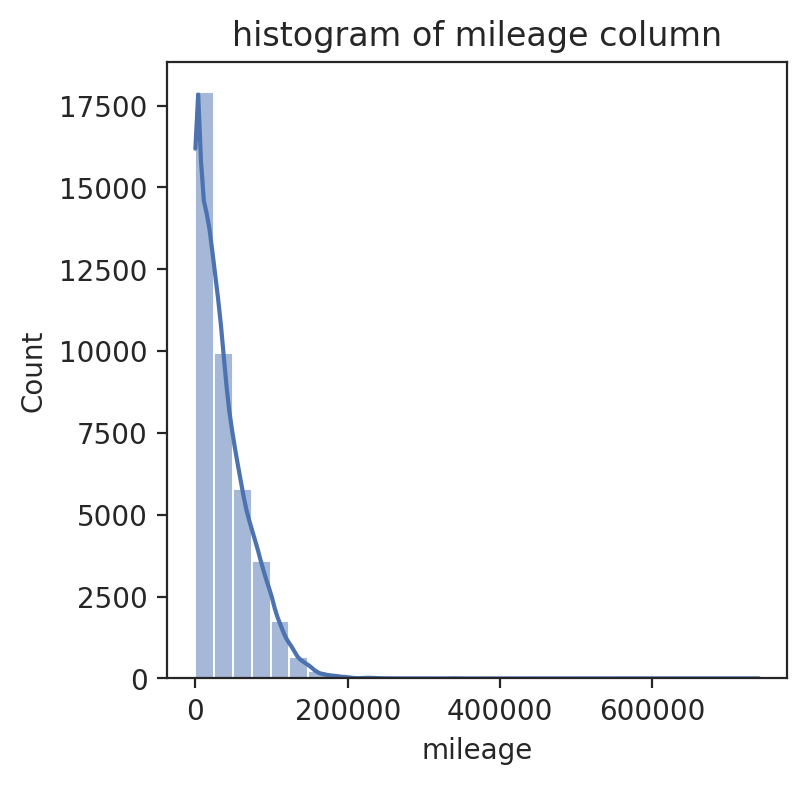

In [34]:
plt.figure(figsize = (4,4))

#histogram for mileage
sns.histplot(data = df.sample(n=40000), x= 'mileage', bins = 30,kde = True)

plt.title('histogram of mileage column');

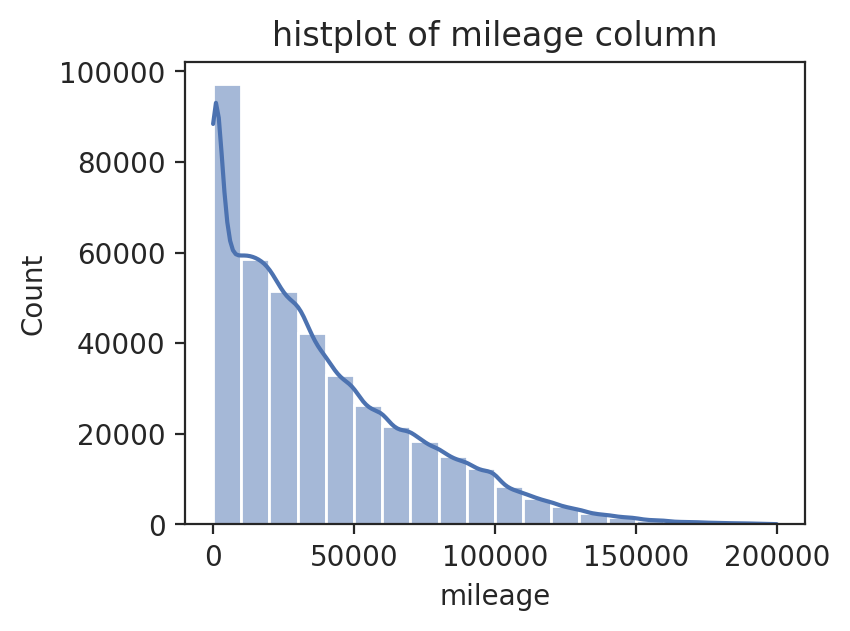

In [35]:
plt.figure(figsize = (4,3))
plt.title("histplot of mileage column")

sns.histplot(data =df_subset , x= 'mileage', bins = 20,kde = True);


<Axes: xlabel='mileage'>

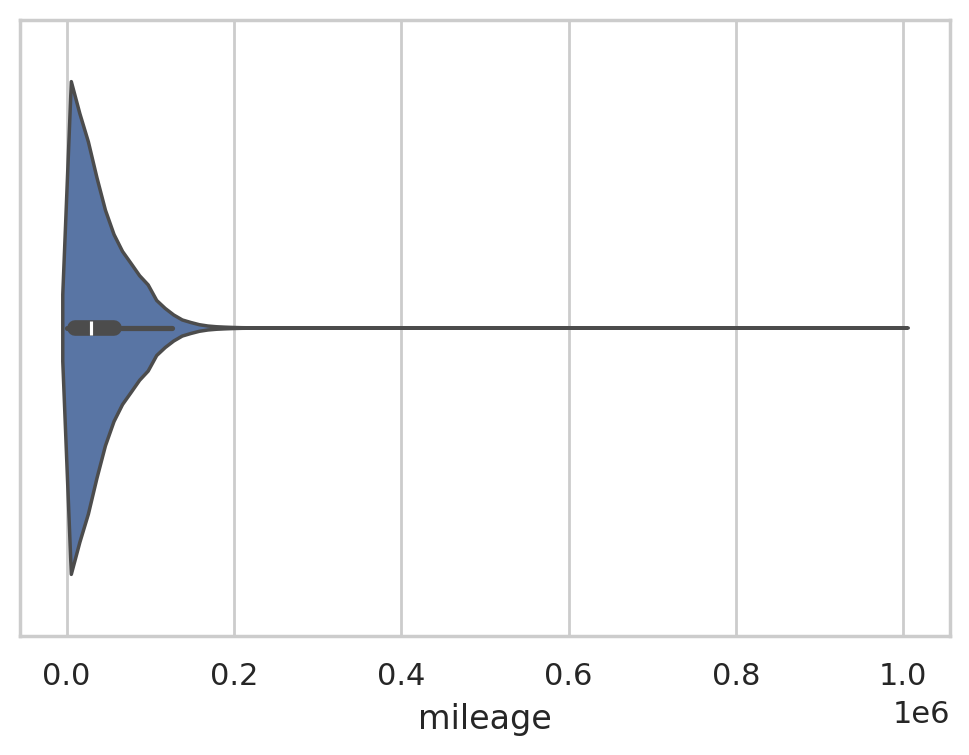

In [36]:
sns.set(style="whitegrid")

# Create a violin plot
sns.violinplot(x='mileage', data=df)

In [37]:
df['mileage'].skew()

np.float64(1.4511319838597931)

In [38]:
df['mileage'].dtype

dtype('float64')

In [39]:
df.shape

(402005, 12)

Initial conclusions on mileage column:
There are 127 missing values and many 0 values in the mileage column
There are some outliers in the data set
The data is positively skewed
The data type of mileage column is float. when I am trying to change it to int , it is not changing because of missing values.

# year of registration


In [40]:
df['year_of_registration'].describe()

,year_of_registration
count,368694.000000
mean,2015.006206
std,7.962667
min,999.000000
25%,2013.000000
50%,2016.000000
75%,2018.000000
max,2020.000000


<Axes: xlabel='year_of_registration'>

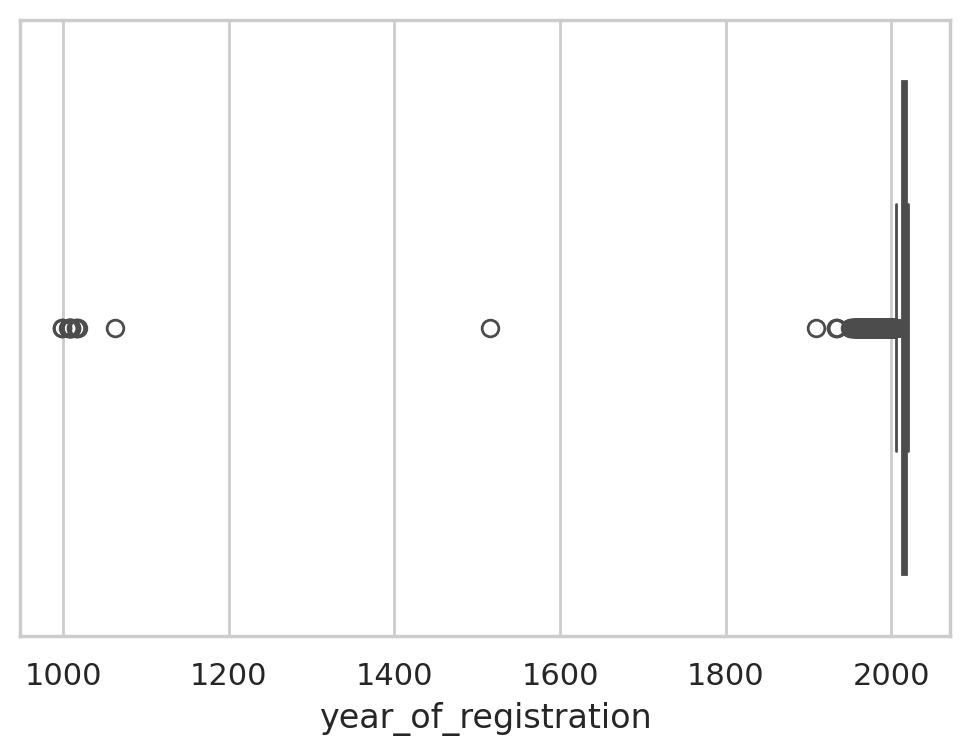

In [41]:

sns.boxplot(data  = df,x='year_of_registration')

<Axes: xlabel='year_of_registration', ylabel='Count'>

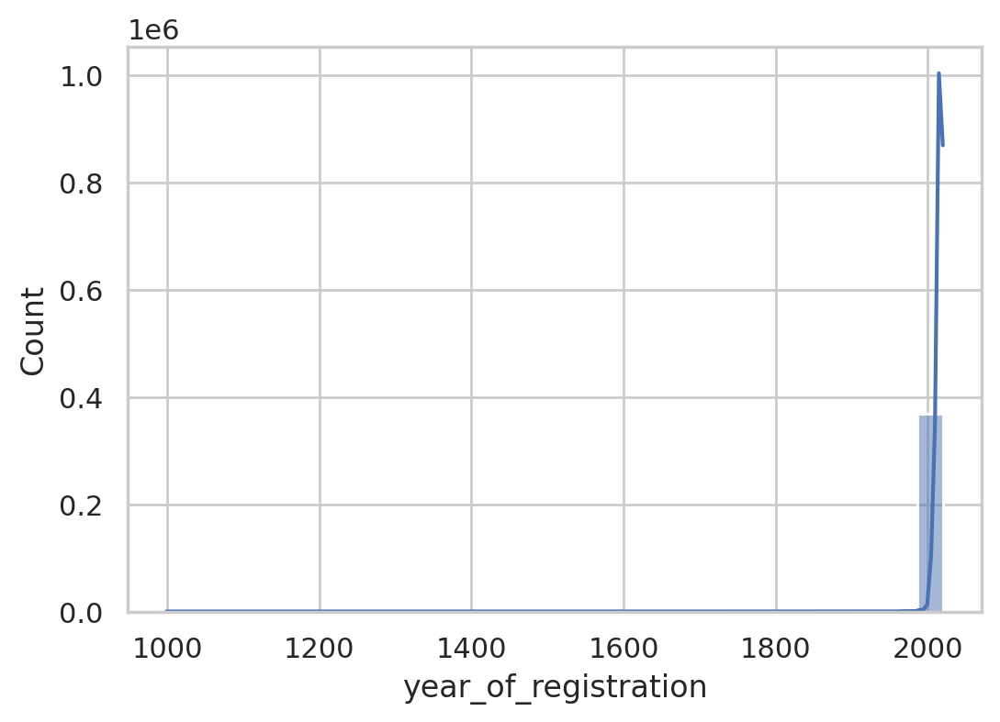

In [42]:

sns.histplot(data = df,x='year_of_registration', bins = 30,kde = True)

<Axes: xlabel='year_of_registration', ylabel='Count'>

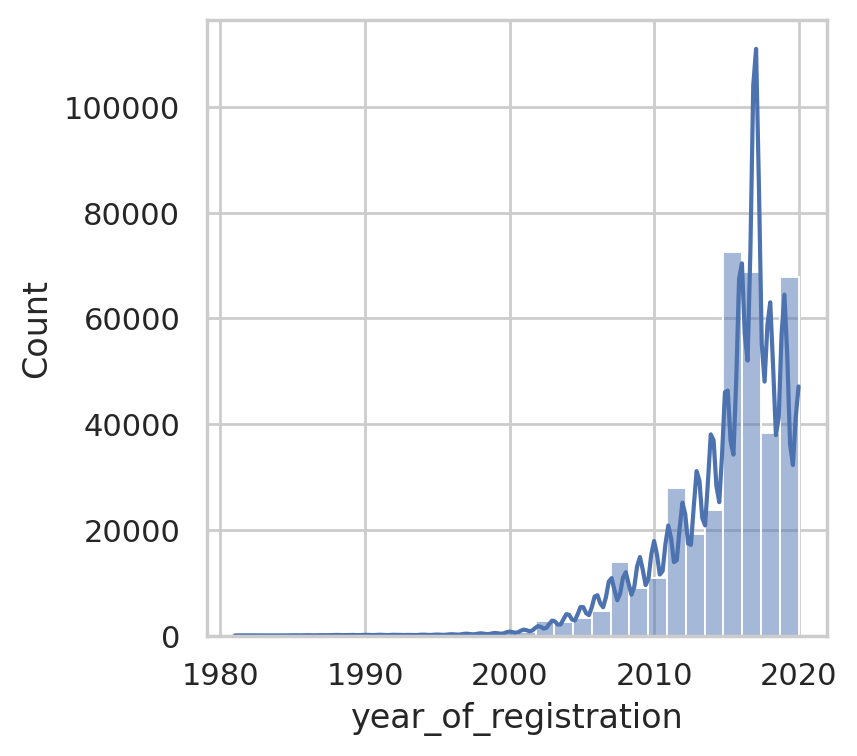

In [43]:
plt.figure(figsize= (4,4))

sns.histplot(data = df.query("year_of_registration > 1980"), x ="year_of_registration" , bins = 30,kde = True)

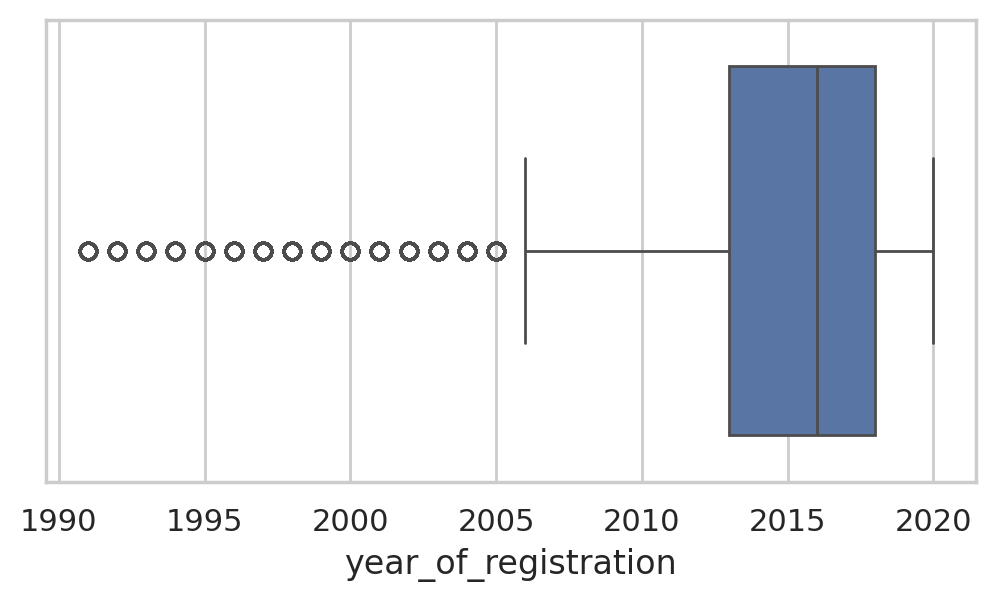

In [44]:
plt.figure(figsize= (6,3))
sns.boxplot(data = df.query("year_of_registration > 1990"), x ="year_of_registration" );

In [45]:
df['year_of_registration'].isnull().sum()

np.int64(33311)

In [46]:
#conclusion
#There are some outliers in year_of_registration column
#the values are negatively skewed
#there are missing values in this feature.

In [ ]:
#dealed with outliers and missing values in down of the notebook.

# Vehicle condition

In [47]:
df['vehicle_condition'].isnull().sum()

np.int64(0)

In [48]:
df['vehicle_condition'].value_counts()

,count
vehicle_condition,
USED,370756
NEW,31249


In [49]:
df['vehicle_condition'].value_counts(normalize = True)

,proportion
vehicle_condition,
USED,0.922267
NEW,0.077733


<Axes: xlabel='vehicle_condition', ylabel='count'>

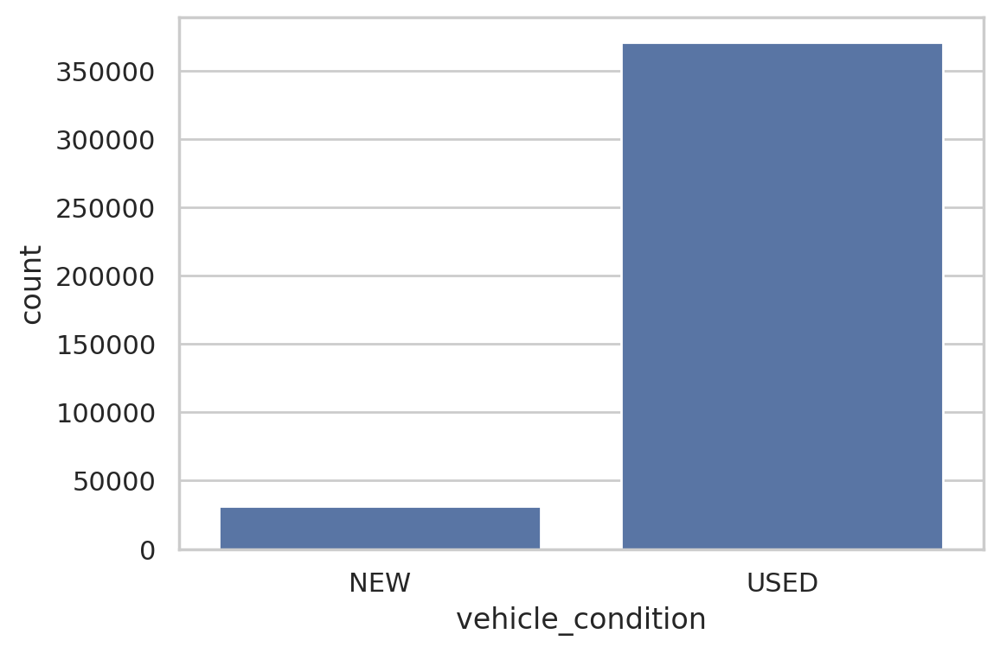

In [50]:
sns.countplot(data = df, x = 'vehicle_condition')

[Text(0, 0, 'USED'), Text(1, 0, 'NEW')]

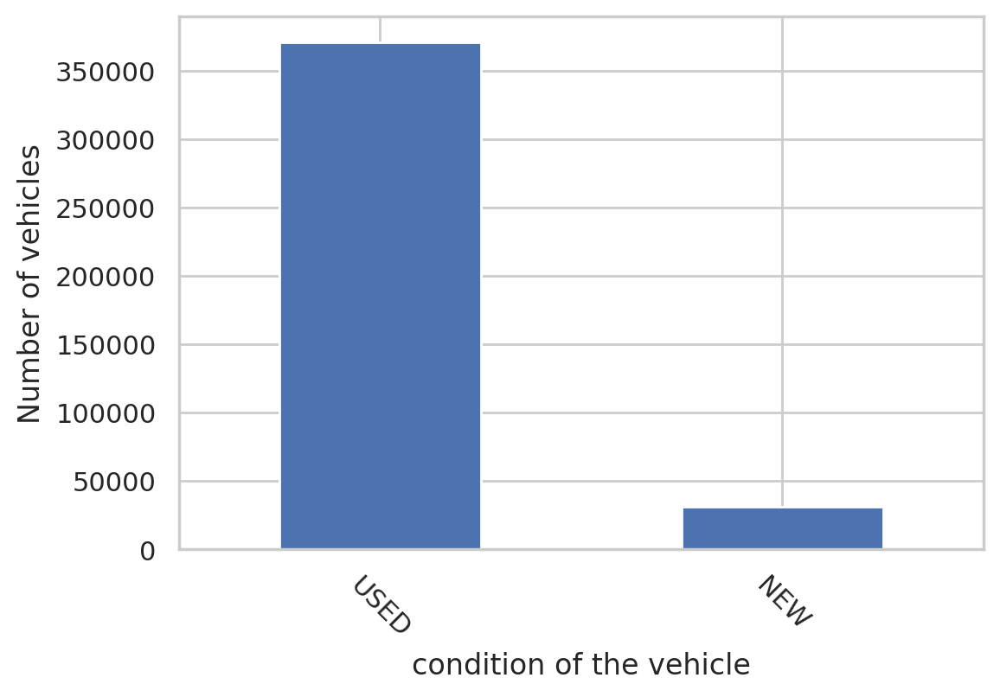

In [51]:
ax=df['vehicle_condition'].value_counts().plot.bar()
ax.set_xlabel('condition of the vehicle')
ax.set_ylabel('Number of vehicles')
ax.set_xticklabels(df['vehicle_condition'].value_counts().index, rotation=-45)

<Axes: xlabel='vehicle_condition'>

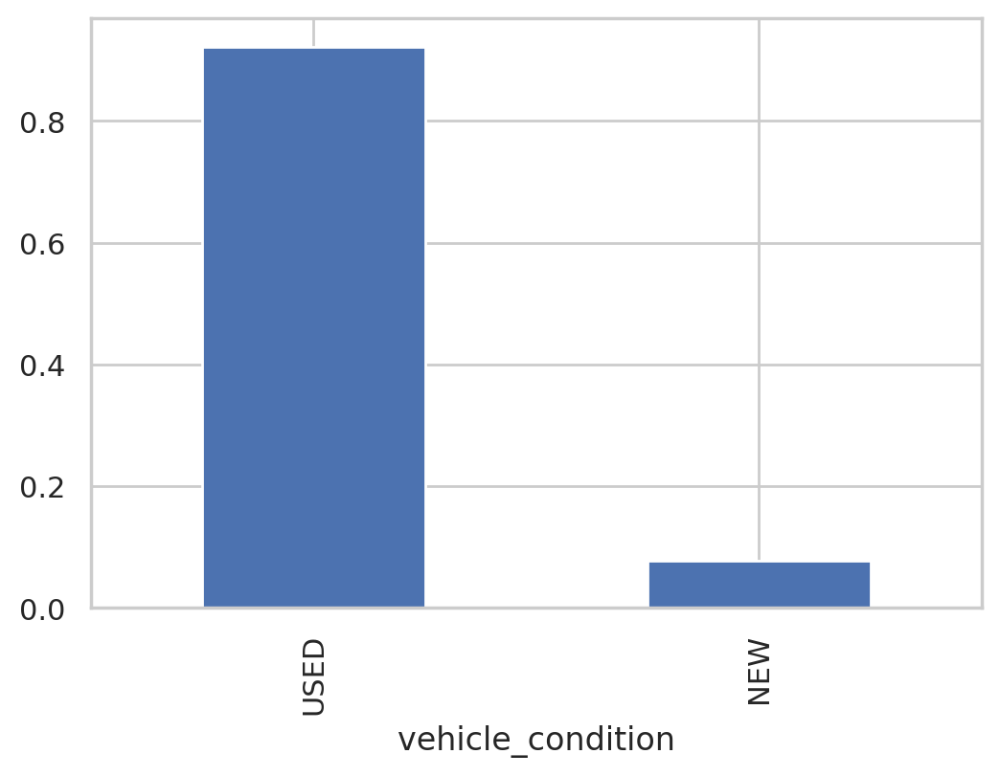

In [52]:
df['vehicle_condition'].value_counts(normalize = True).plot.bar()

In [53]:
#conclusion:
#There no missing values
#only few new cars are available in a data set


# fuel_type

In [54]:
df['fuel_type'].isna().sum()

np.int64(601)

In [55]:
df['fuel_type'].value_counts()

,count
fuel_type,
Petrol,216929
Diesel,158120
Petrol Hybrid,13602
Petrol Plug-in Hybrid,6160
Electric,4783
Diesel Hybrid,1403
Bi Fuel,221
Diesel Plug-in Hybrid,185
Natural Gas,1


<Axes: xlabel='fuel_type'>

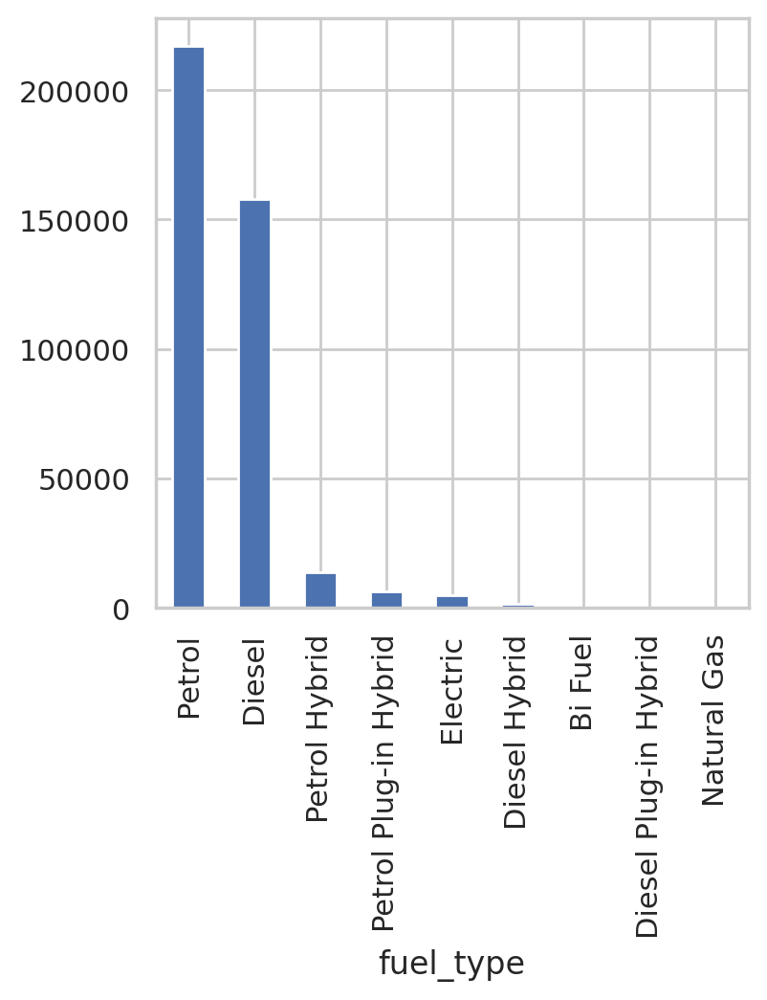

In [56]:
plt.figure(figsize = (4,4))
df['fuel_type'].value_counts().plot(kind = 'bar')

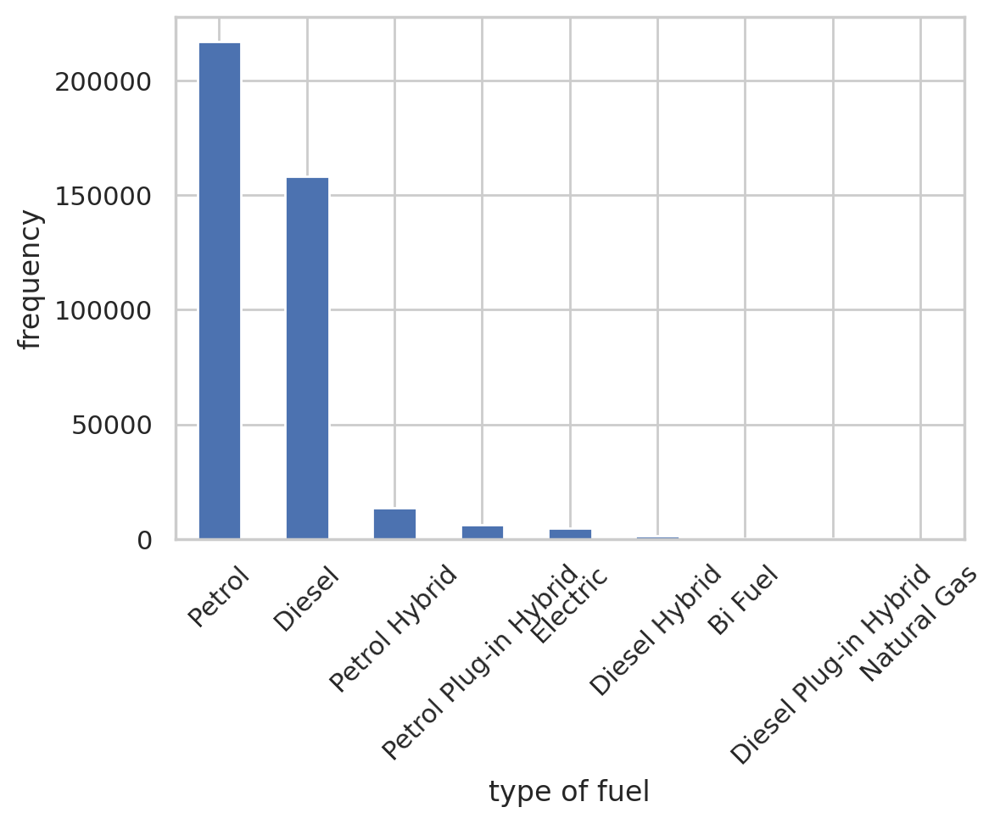

In [57]:
plt.figure(figsize= (6,4))
ax = df['fuel_type'].value_counts().plot.bar()
ax.set_xlabel('type of fuel')
ax.set_ylabel('frequency')
ax.set_xticklabels(df['fuel_type'].value_counts().index, rotation=45);
#ax.set_ylim(0,600)

In [58]:
#conclusion:
#there are some missing values
#most of the cars are of petrol and diesel.

# standard make

In [59]:
df['standard_make']

,standard_make
0,Volvo
1,Jaguar
2,SKODA
3,Vauxhall
4,Land Rover
...,...
402000,Peugeot
402001,Peugeot
402002,Nissan
402003,Abarth


In [60]:
df['standard_make'].value_counts()

,count
standard_make,
BMW,37376
Audi,35280
Volkswagen,34246
Vauxhall,33700
Mercedes-Benz,31917
...,...
Sebring,1
Radical,1
Pontiac,1


In [61]:
len(df['standard_make'].value_counts())

110

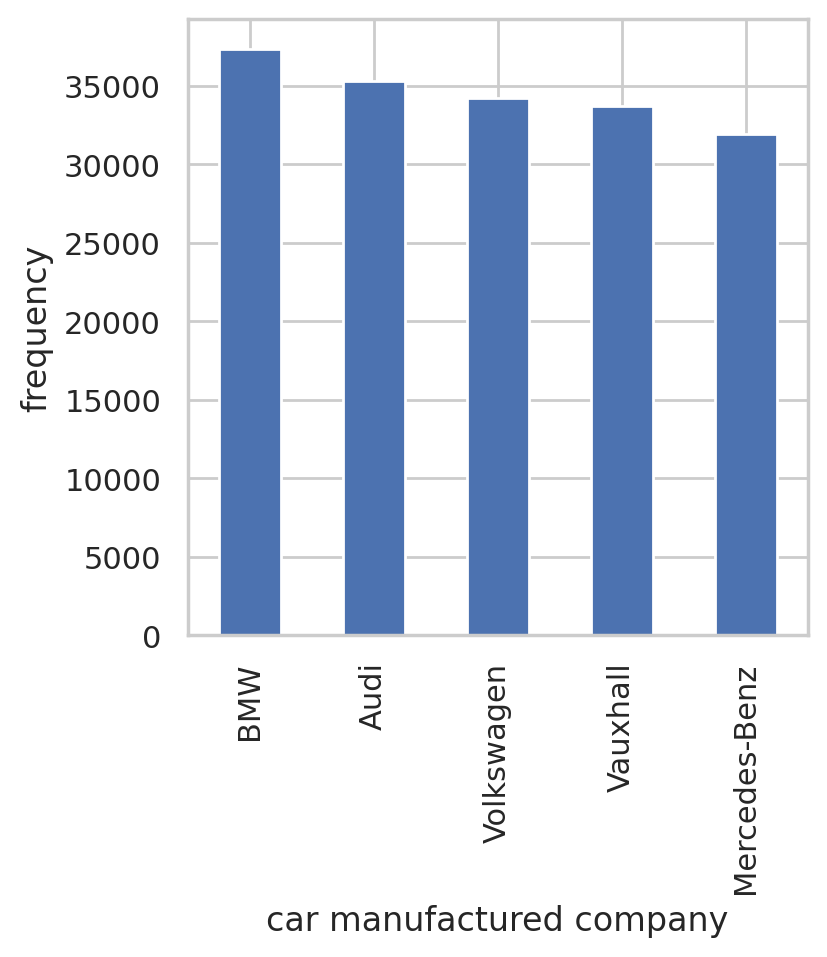

In [62]:
plt.figure(figsize = (4,4))
df['standard_make'].value_counts().head(5).plot.bar()#top 5 brands of cars
plt.ylabel('frequency')
plt.xlabel('car manufactured company');

In [63]:
df['standard_make'].isna().sum()

np.int64(0)

In [ ]:
#conclusion:
#There are no missing values.
#there are 101 brands of cars in a data set. I plotted the top 10 brands above.

# body_type

In [64]:
df['body_type'].value_counts()

,count
body_type,
Hatchback,167315
SUV,115872
Saloon,36641
Estate,24692
Coupe,23258
Convertible,16038
MPV,16026
Pickup,620
Combi Van,214


In [65]:
len(df['body_type'].value_counts())

16

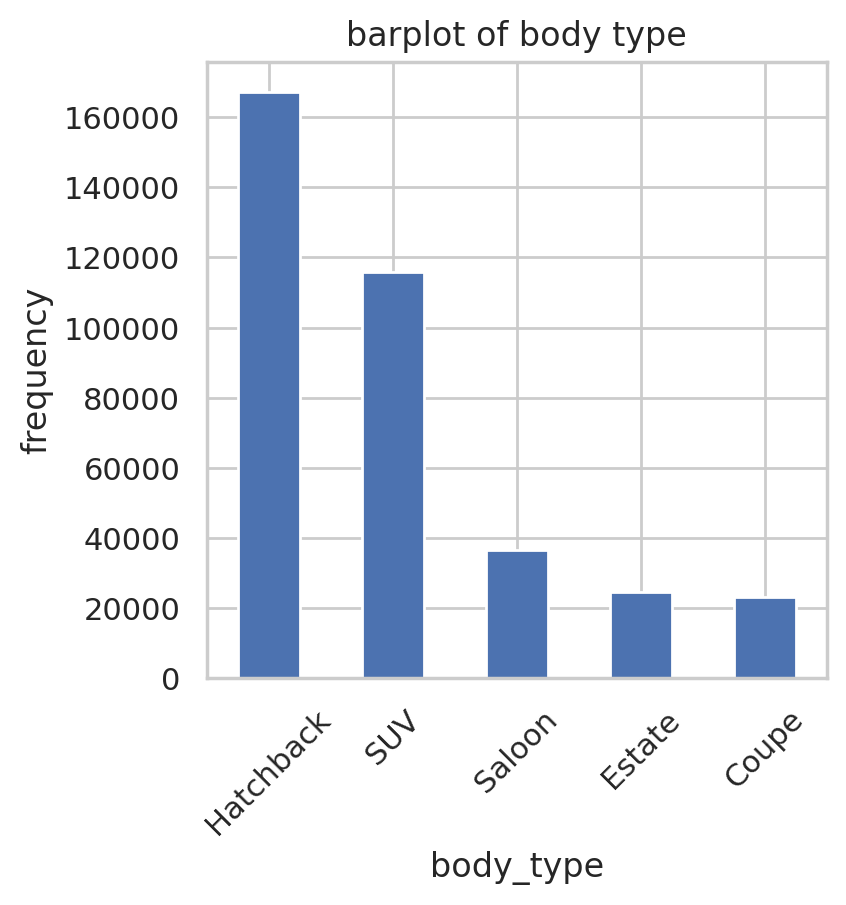

In [66]:
plt.figure(figsize = (4,4))

#barplot of body type
df['body_type'].value_counts().head().plot.bar()

plt.title('barplot of body type')
plt.xlabel('body_type')
plt.ylabel('frequency')
plt.xticks(rotation = 45);

In [67]:
df['body_type'].isna().sum()

np.int64(837)

In [68]:
#conclusion:
#There are total of 16 models available in data set
#There are 837 missin values in body_type feature.
#the top 5 models are shown above


In [69]:
df.describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


# Analysis of Predictive Power of Features before cleaning

In [70]:
#numerical features

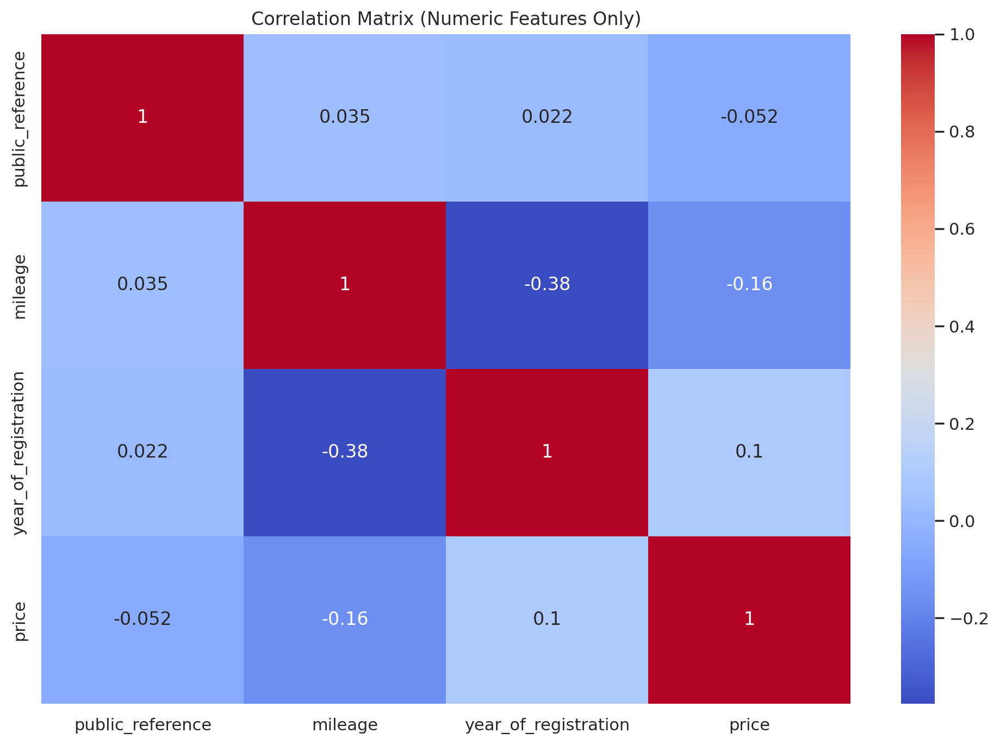

In [74]:
# Correlation matrix for numeric features only
numeric_df = df.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix (Numeric Features Only)')
plt.show()


In [76]:
#correlation between 'mileage' and 'price.'
correlation_mileage = df['mileage'].corr(df['price'])
correlation_mileage
#A negative correlation would imply that as mileage increases, the price tends to decrease.

np.float64(-0.16020374497765127)

In [75]:
#correlation between ' year_of_registration' and 'price'
correlation_year_of_registration = df['year_of_registration'].corr(df['price'])
correlation_year_of_registration

np.float64(0.10234109038334628)

<Axes: xlabel='year_of_registration', ylabel='price'>

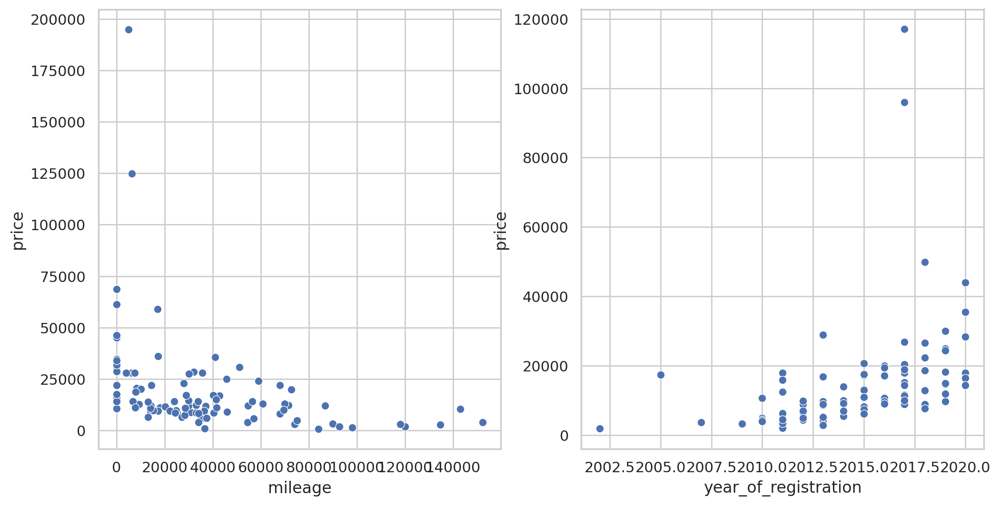

In [77]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x='mileage', y='price', data=df.sample(100))

plt.subplot(1, 2, 2)
sns.scatterplot(x='year_of_registration', y='price', data=df.sample(100))



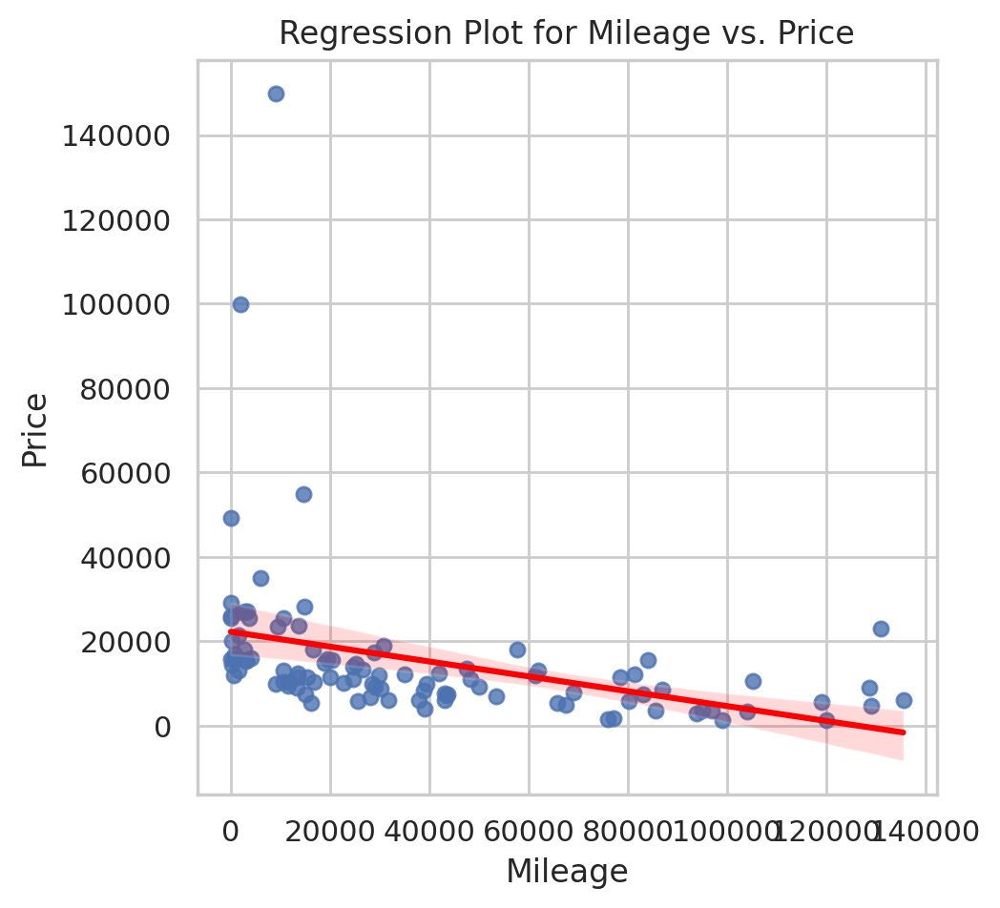

In [78]:

# Scatter plot with regression line for 'mileage' vs. 'price'
plt.figure(figsize=(5, 5))
sns.regplot(x='mileage', y='price', data=df.sample(100),scatter_kws={'s': 30},  line_kws={'color': 'red'})
plt.title('Regression Plot for Mileage vs. Price')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.show()


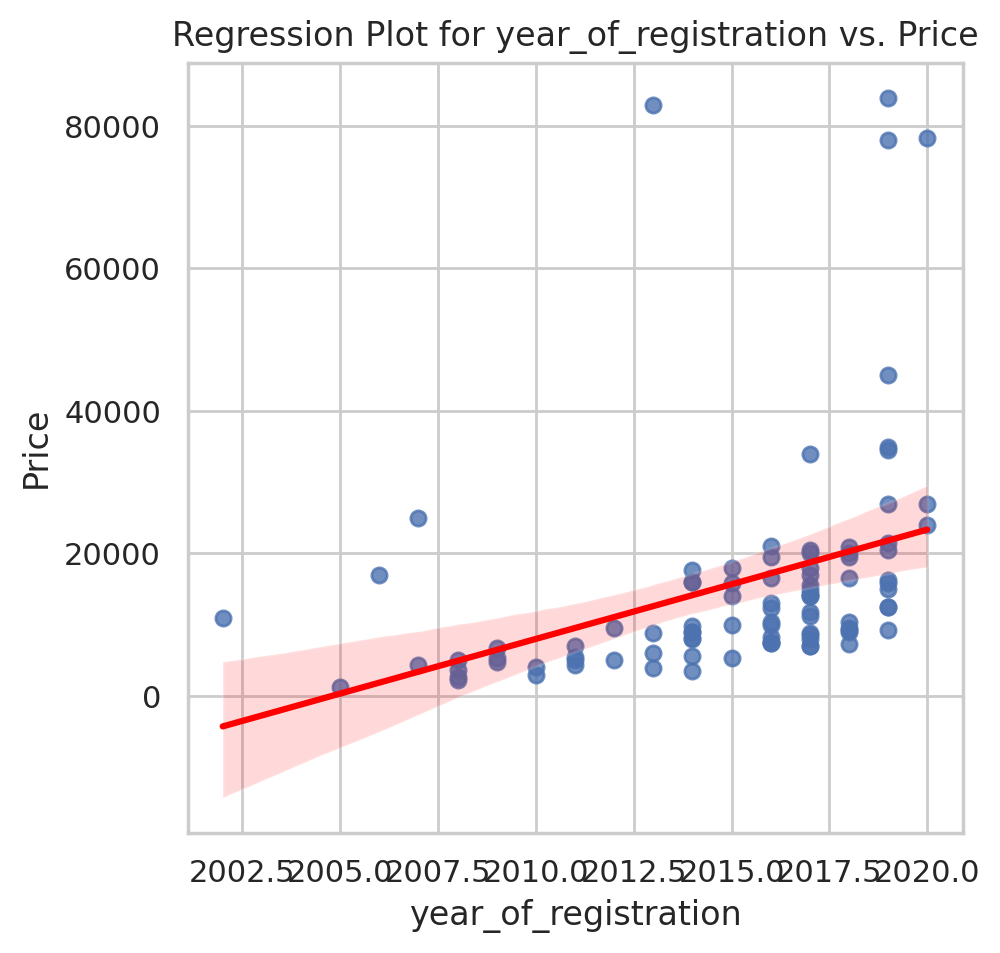

In [79]:

# Scatter plot with regression line for 'mileage' vs. 'price'
plt.figure(figsize=(5, 5))
sns.regplot(x='year_of_registration', y='price', data=df.sample(100),scatter_kws={'s': 30},  line_kws={'color': 'red'})
plt.title('Regression Plot for year_of_registration vs. Price')
plt.xlabel('year_of_registration')
plt.ylabel('Price')
plt.show()


In [ ]:
#categorical features

#examing the categorical features like standard_colour, standard_make, standard_model,body_type and fuel_type by visualising through box plots

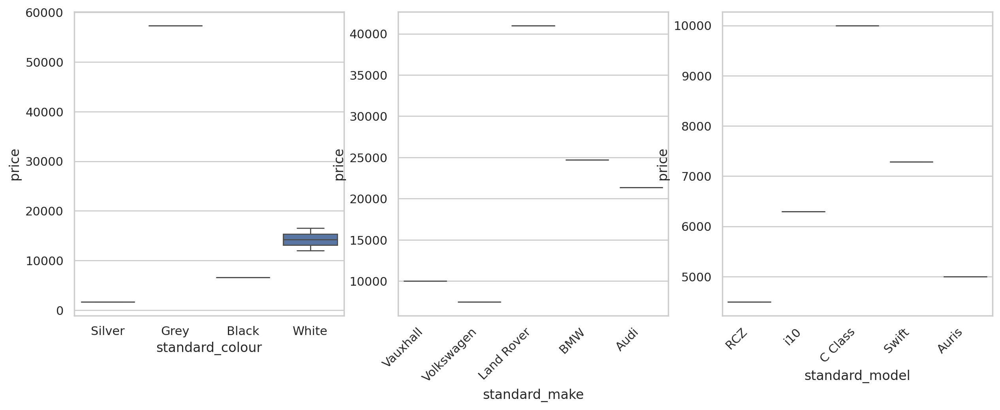

In [82]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='standard_colour', y='price', data=df.sample(5))

plt.subplot(1, 3, 2)
sns.boxplot(x='standard_make', y='price', data=df.sample(5))
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 3, 3)
sns.boxplot(x='standard_model', y='price', data=df.sample(5))
plt.xticks(rotation=45, ha='right')

plt.show()


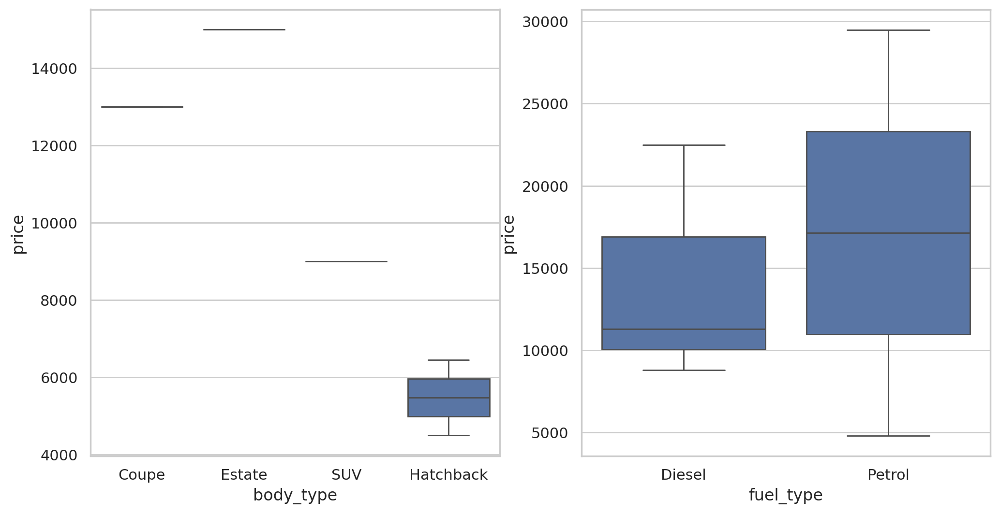

In [84]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x='body_type', y='price', data=df.sample(5))

plt.subplot(1, 2, 2)
sns.boxplot(x='fuel_type', y='price', data=df.sample(5))

plt.show()


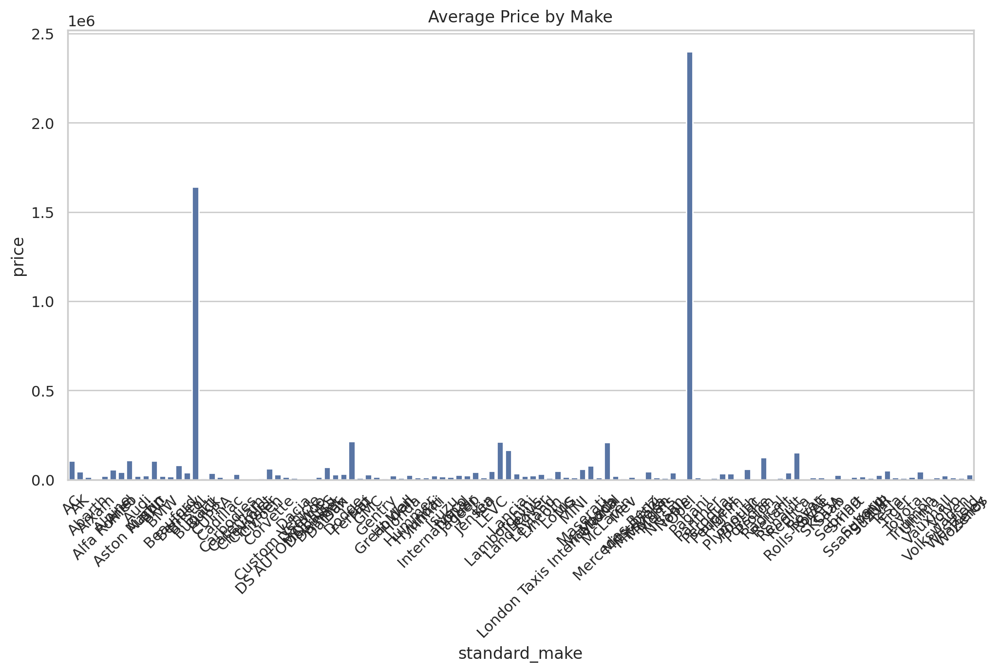

In [85]:
#Utilizing Data Aggregation and Grouping:
# Aggregate data to find the average price for each make
average_price_by_make = df.groupby('standard_make')['price'].mean().reset_index()

# Create a bar chart to visualize average prices by make
plt.figure(figsize=(12, 6))
sns.barplot(x='standard_make', y='price', data=average_price_by_make)
plt.title('Average Price by Make')
plt.xticks(rotation=45)
plt.show()


#  Data Processing for Data Exploration and Visualisation

In [86]:
df['price'].describe()

,price
count,4.020050e+05
mean,1.734197e+04
std,4.643746e+04
min,1.200000e+02
25%,7.495000e+03
50%,1.260000e+04
75%,2.000000e+04
max,9.999999e+06


<Axes: xlabel='price'>

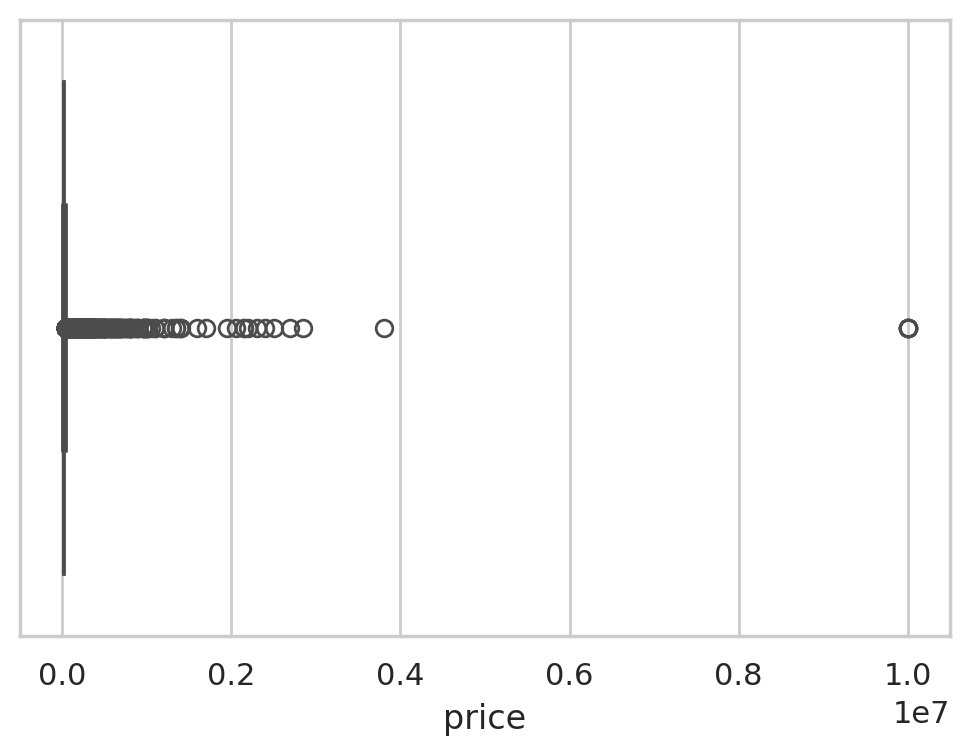

In [87]:
sns.boxplot(data = df, x = 'price')

In [88]:
q1 = df['price'].quantile(0.25)
q3 = df['price'].quantile(0.75)
IQR =q3 -q1

In [89]:
df_new = df[(df['price'] >= q1) & (df['price'] <=  q3)]


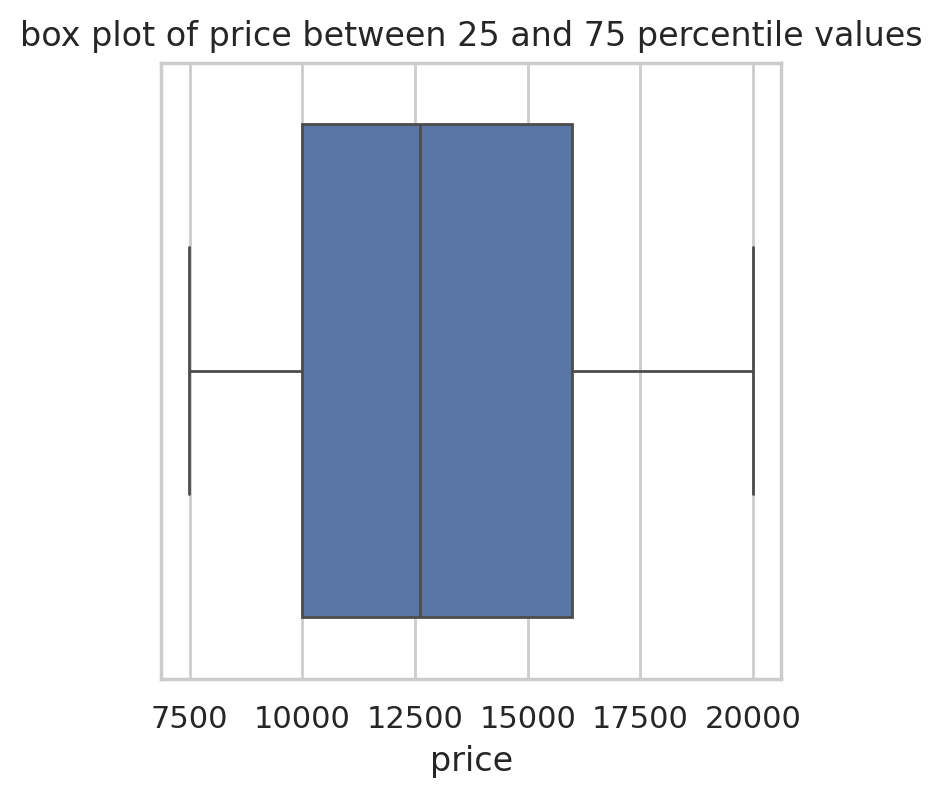

In [90]:
#box plot of price between 25 and 75 percentile values

plt.figure(figsize = (4,4));

sns.boxplot(data =df_new , x = 'price');


plt.title("box plot of price between 25 and 75 percentile values");

<Axes: xlabel='price', ylabel='Count'>

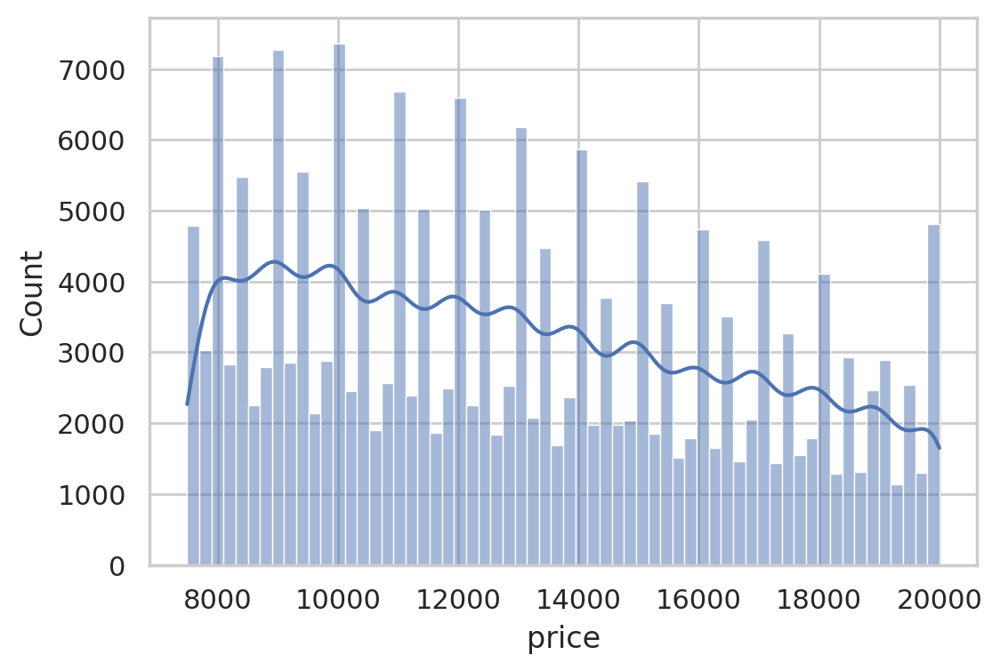

In [91]:
sns.histplot(data=df_new , x = 'price', kde = True)

In [92]:
df_new.shape

(202566, 12)

In [93]:
df_new.isnull().sum()

,0
public_reference,0
mileage,55
reg_code,8791
standard_colour,2011
standard_make,0
standard_model,0
vehicle_condition,0
year_of_registration,9458
price,0
body_type,349


In [95]:
#filling missing values for better visualization (temporary)

In [96]:
df_new['mileage'].fillna(df_new['mileage'].median(), inplace=True)

In [97]:
df_new['year_of_registration'].fillna(df_new['year_of_registration'].median(), inplace=True)

In [98]:
df_new['fuel_type'] = df_new['fuel_type'].fillna(df_new['fuel_type'].mode().iloc[0])

In [99]:
df_new['body_type'] = df_new['body_type'].fillna(df_new['body_type'].mode().iloc[0])

In [100]:
df_new['standard_colour'] = df_new['standard_colour'].fillna(df_new['standard_colour'].mode().iloc[0])

In [101]:
df_new.isnull().sum()

,0
public_reference,0
mileage,0
reg_code,8791
standard_colour,0
standard_make,0
standard_model,0
vehicle_condition,0
year_of_registration,0
price,0
body_type,0


In [102]:
# Drop rows with any missing values
df_new = df_new.dropna()

In [103]:
df_new.isnull().sum()

,0
public_reference,0
mileage,0
reg_code,0
standard_colour,0
standard_make,0
standard_model,0
vehicle_condition,0
year_of_registration,0
price,0
body_type,0


In [104]:
df_new['mileage'].describe()

,mileage
count,193775.000000
mean,34441.118503
std,26574.228183
min,0.000000
25%,15000.000000
50%,28135.000000
75%,47620.000000
max,999999.000000


<Axes: >

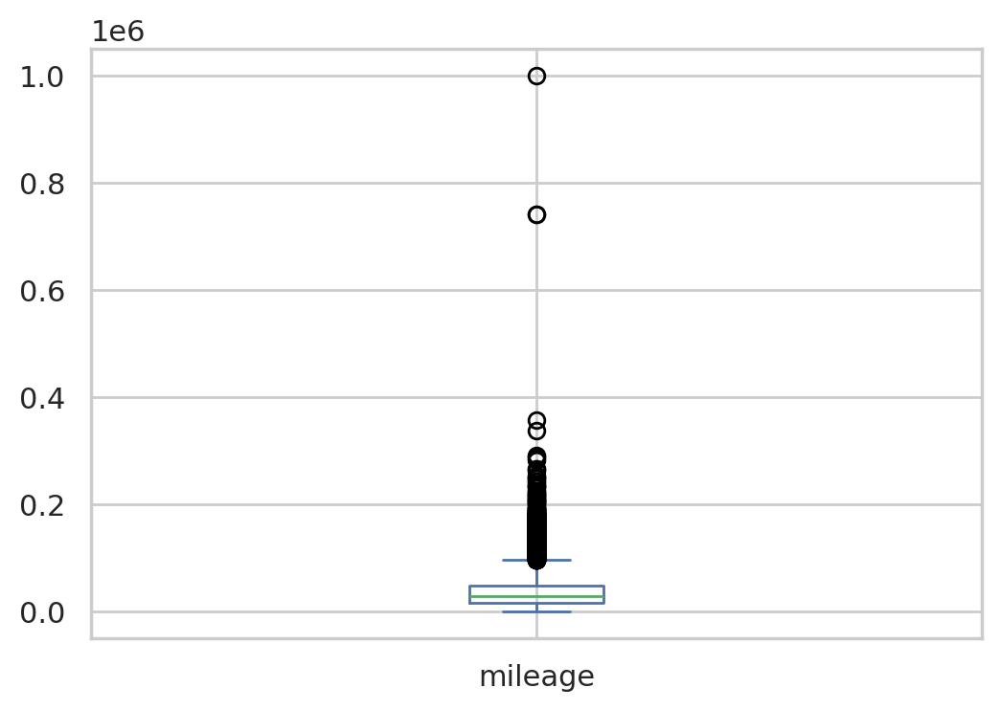

In [105]:
df_new['mileage'].plot(kind = 'box')

In [106]:
q1 = df_new['mileage'].quantile(0.25)
q3 = df_new['mileage'].quantile(0.75)

In [107]:
df_new = df_new[(df_new['mileage'] >= q1) & (df_new['mileage'] <= q3)]

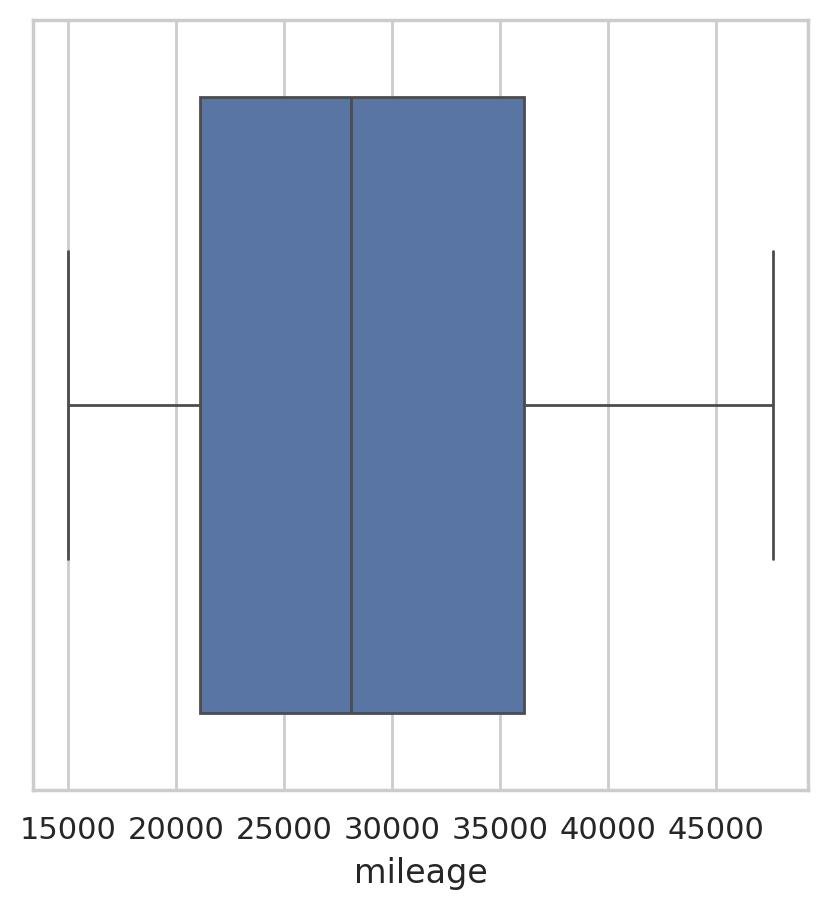

In [108]:
plt.figure(figsize = (5,5))
sns.boxplot(data = df_new , x = 'mileage');

<Axes: xlabel='mileage', ylabel='Count'>

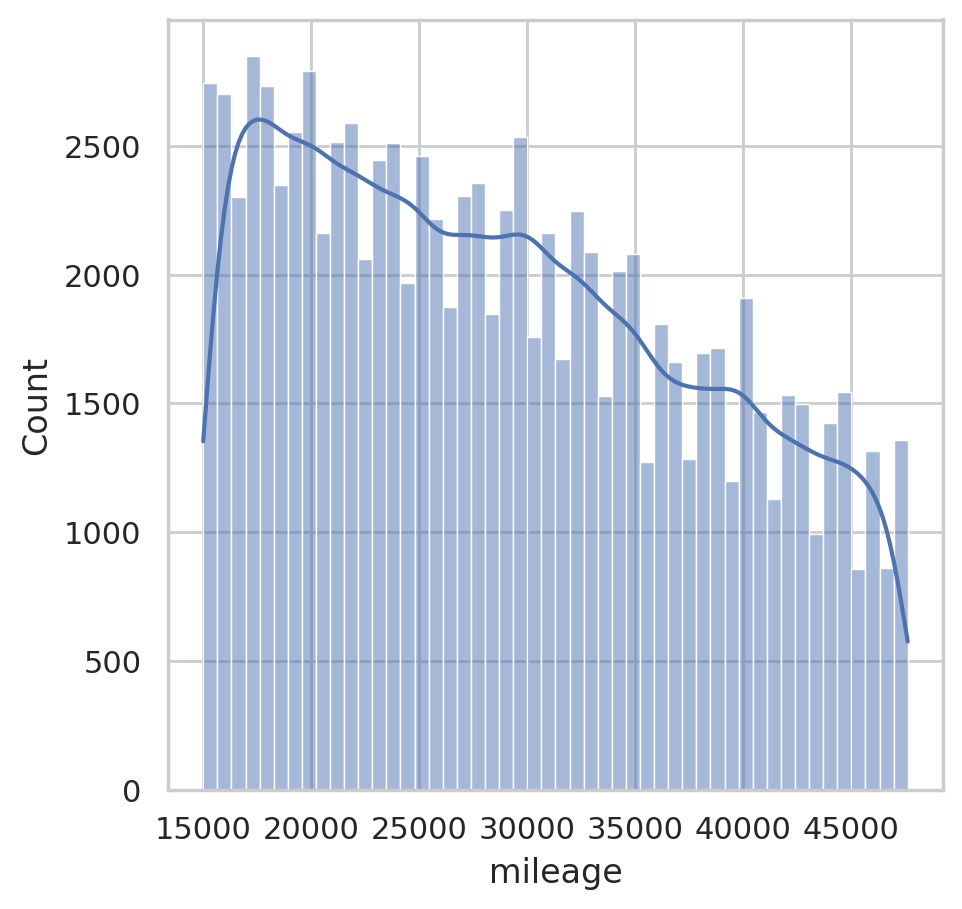

In [109]:
plt.figure(figsize = (5,5))

sns.histplot(data = df_new, x = 'mileage', kde = True)

In [110]:
df_new['year_of_registration'].describe()

,year_of_registration
count,97160.000000
mean,2016.354930
std,4.929461
min,1015.000000
25%,2016.000000
50%,2017.000000
75%,2017.000000
max,2020.000000


<Axes: xlabel='year_of_registration'>

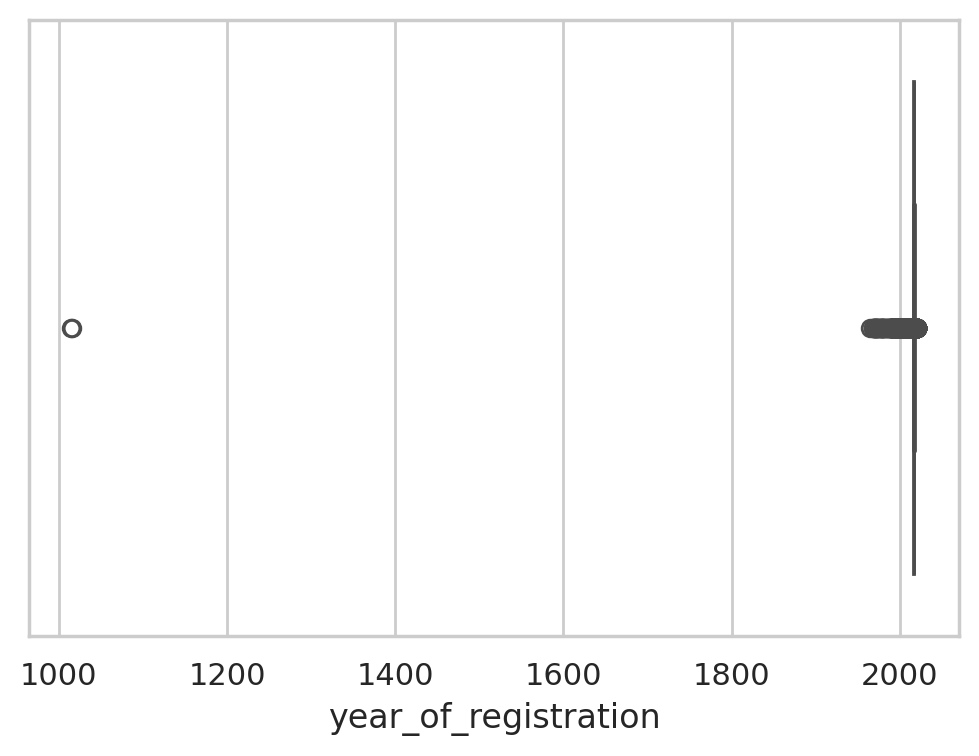

In [111]:
sns.boxplot(data = df_new, x ='year_of_registration' )

In [112]:
df_new=df_new[df_new['year_of_registration']>2000]

<Axes: xlabel='year_of_registration'>

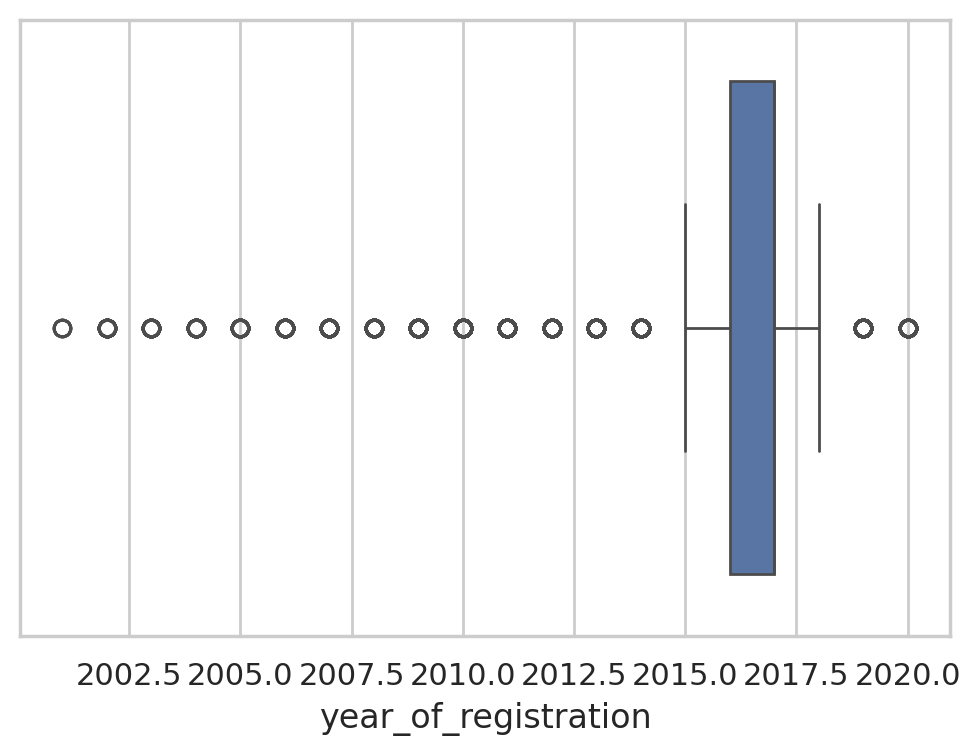

In [113]:
sns.boxplot(data = df_new, x = 'year_of_registration')

<Axes: xlabel='year_of_registration', ylabel='Count'>

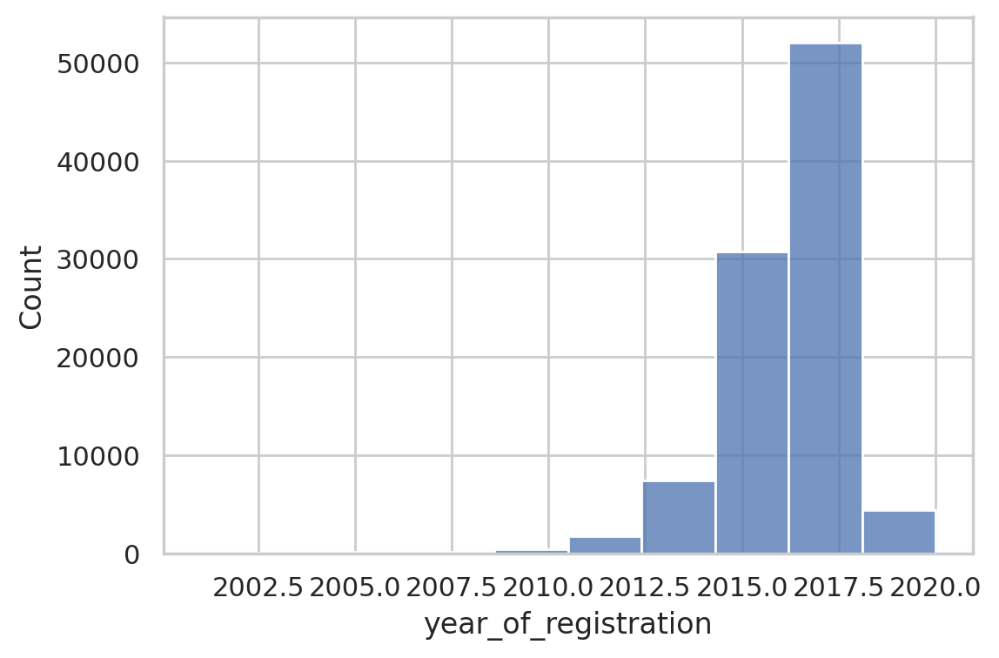

In [114]:
sns.histplot(data = df_new , x = 'year_of_registration',bins = 10)

In [115]:
df_new=df_new[df_new['year_of_registration']>2010]

<Axes: xlabel='year_of_registration'>

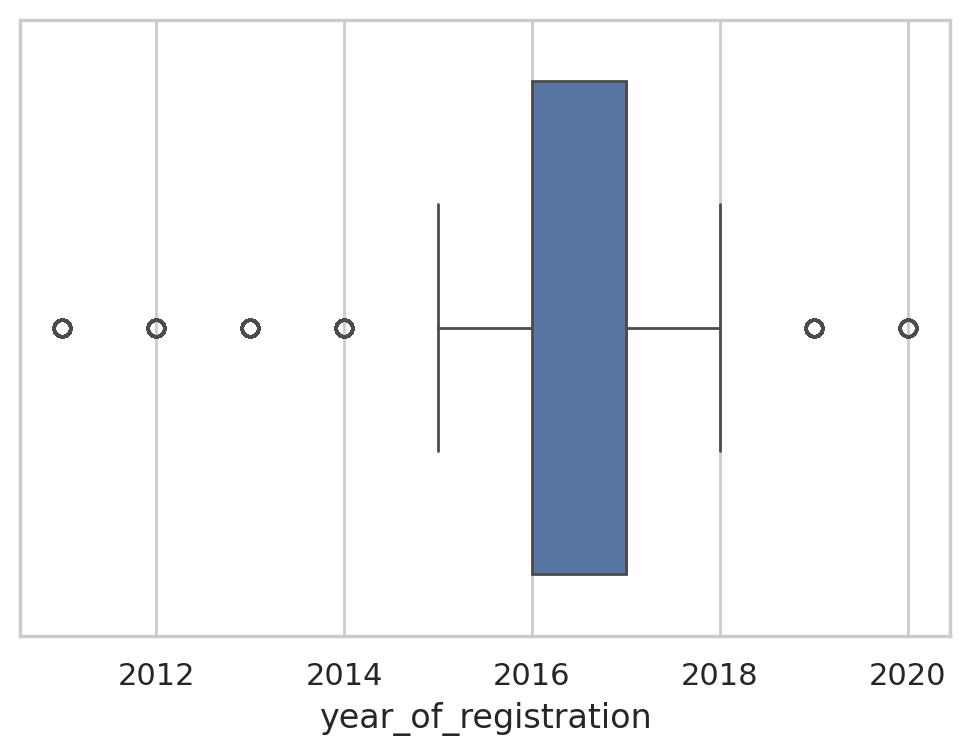

In [116]:
sns.boxplot(data = df_new, x = 'year_of_registration')

<Axes: xlabel='year_of_registration', ylabel='Count'>

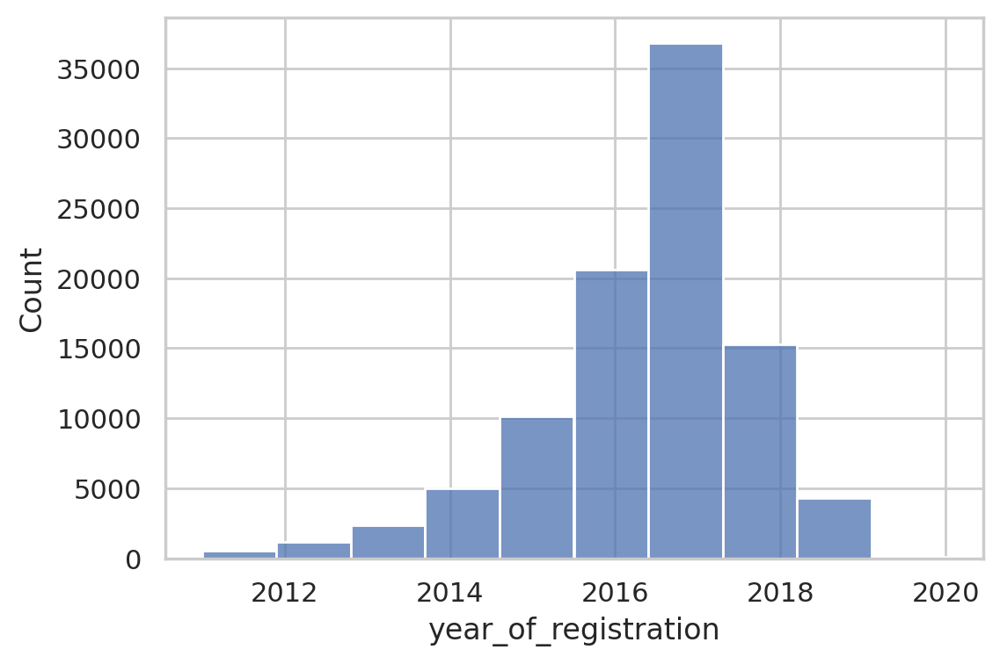

In [117]:
sns.histplot(data = df_new , x = 'year_of_registration',bins = 10)

<Axes: xlabel='mileage', ylabel='price'>

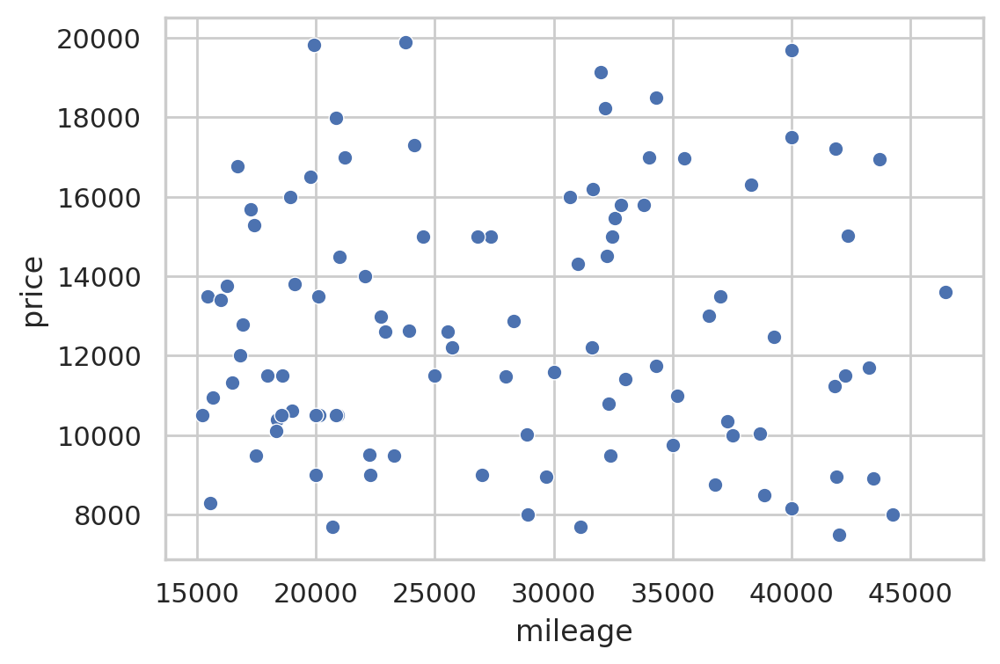

In [118]:
sns.scatterplot(data = df_new.sample(100), x = 'mileage', y= 'price')

<Axes: xlabel='year_of_registration', ylabel='price'>

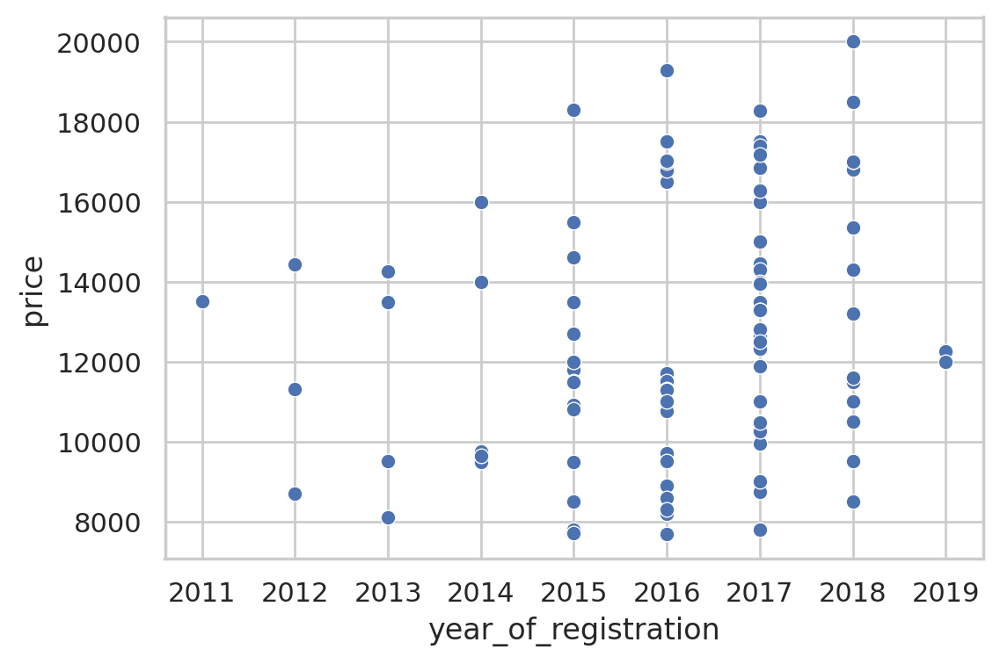

In [119]:
sns.scatterplot(data = df_new.sample(100), x = 'year_of_registration', y= 'price')

In [120]:
df_new['body_type'].value_counts()

,count
body_type,
Hatchback,42981
SUV,29183
Saloon,7790
Estate,5204
MPV,4540
Coupe,3938
Convertible,2460
Pickup,102
Combi Van,29


In [121]:
df_new['fuel_type'].value_counts()

,count
fuel_type,
Petrol,49826
Diesel,41191
Petrol Hybrid,3586
Petrol Plug-in Hybrid,911
Electric,700
Diesel Hybrid,44
Diesel Plug-in Hybrid,4


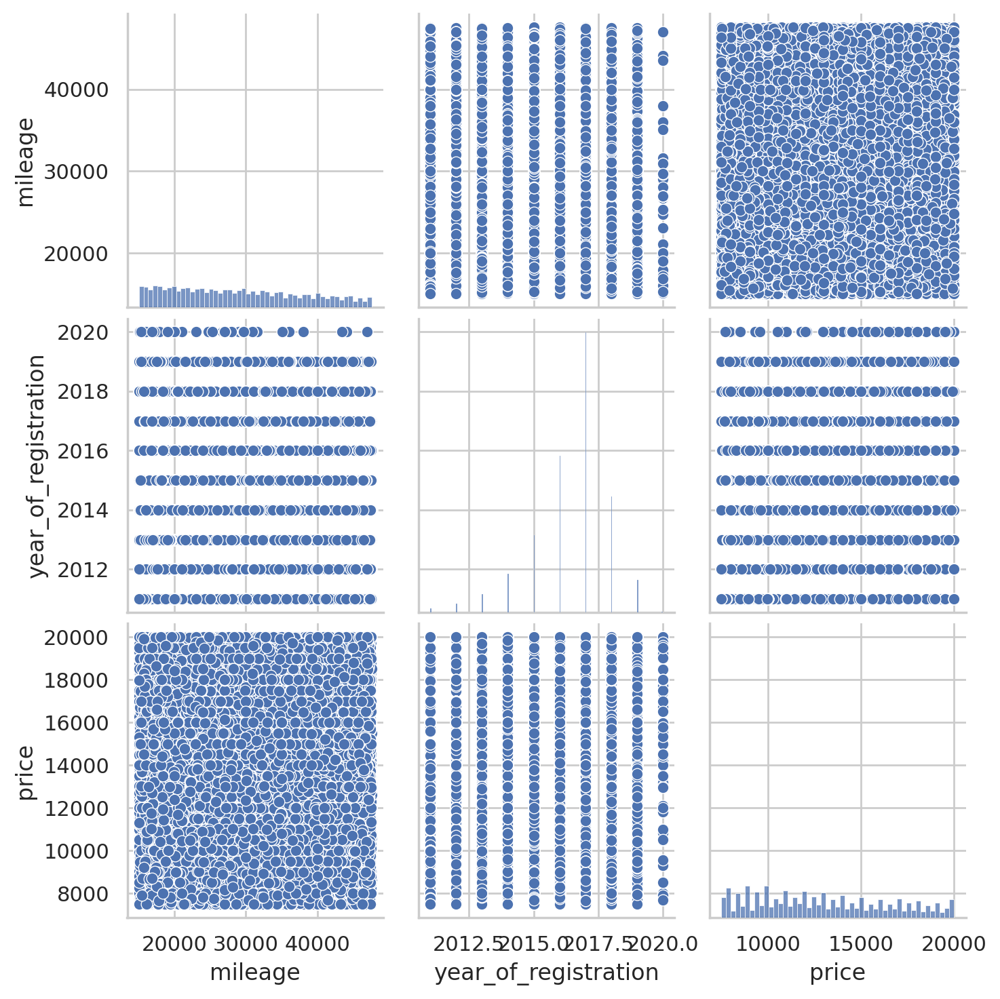

In [122]:
# Pairplot for numerical features
sns.pairplot(df_new[['mileage', 'year_of_registration', 'price']])
plt.show()

In [123]:
# Descriptive statistics
desc_stats = df_new[['mileage', 'year_of_registration', 'price']].describe()
print(desc_stats)

            mileage  year_of_registration         price
count  96262.000000          96262.000000  96262.000000
mean   28955.443041           2016.477738  12979.459413
std     9061.331696              1.437455   3529.656693
min    15000.000000           2011.000000   7495.000000
25%    21029.000000           2016.000000   9995.000000
50%    28000.000000           2017.000000  12500.000000
75%    36000.000000           2017.000000  15934.250000
max    47620.000000           2020.000000  20000.000000


In [124]:
cat_stats = df_new[['standard_make', 'standard_model', 'body_type', 'fuel_type']].describe(include='object')
print(cat_stats)


       standard_make standard_model  body_type fuel_type
count          96262          96262      96262     96262
unique            43            416         15         7
top             Audi           Golf  Hatchback    Petrol
freq            9756           3337      42981     49826


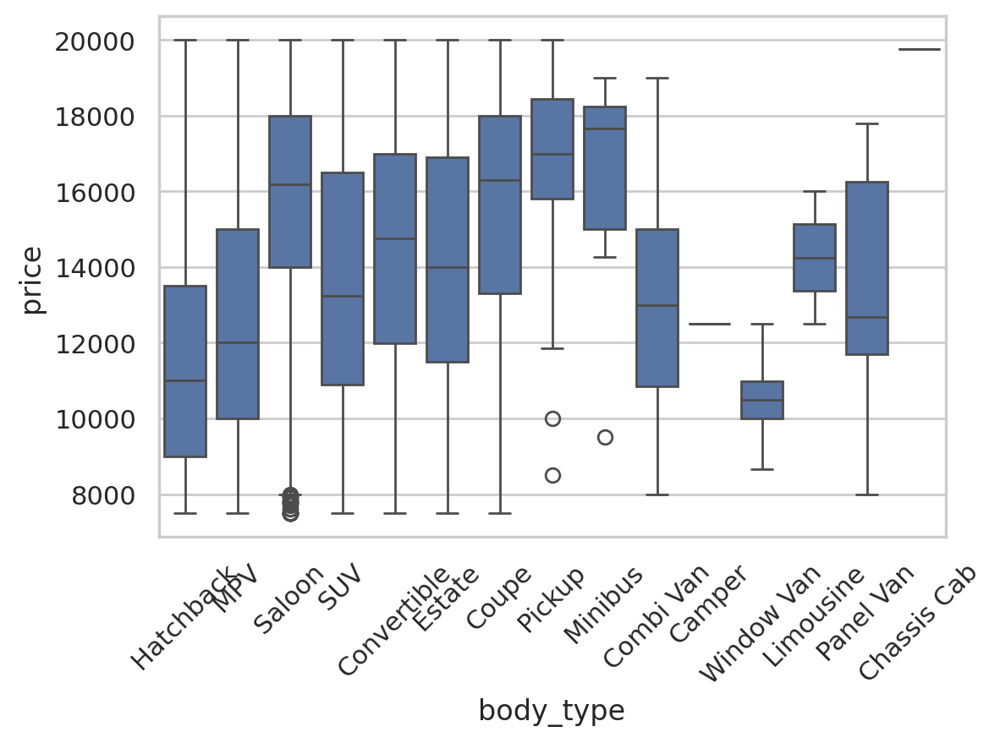

In [125]:
sns.boxplot(x='body_type', y='price', data=df_new)
plt.xticks(rotation = 45);


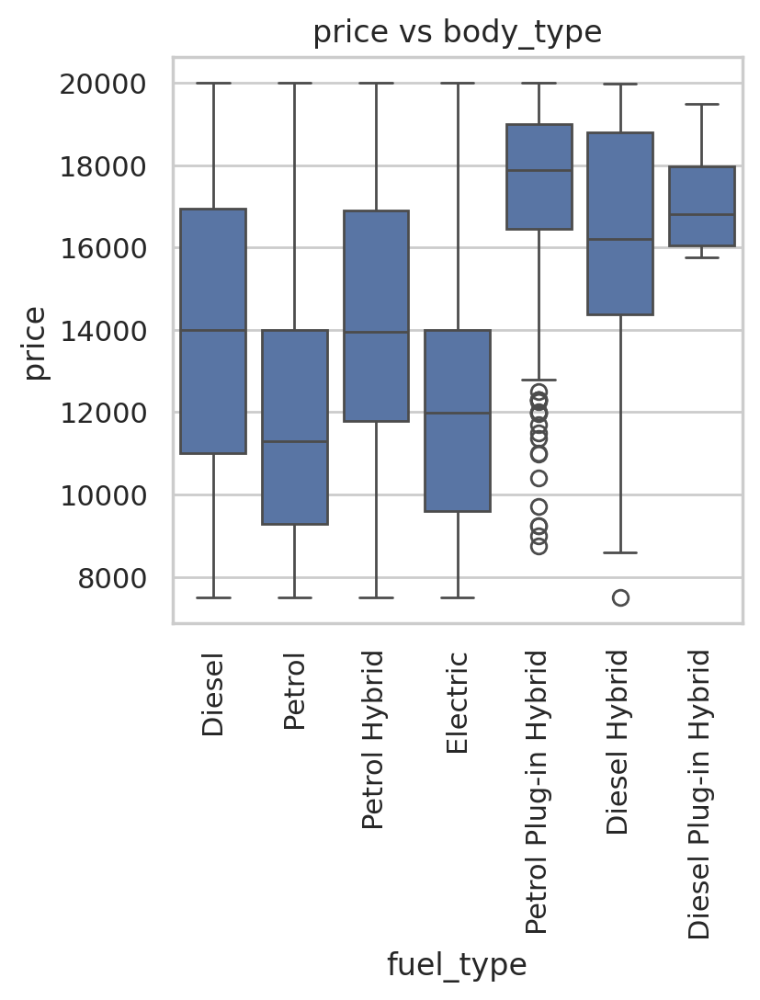

In [126]:
plt.figure(figsize= (4,4))

sns.boxplot(x='fuel_type', y='price', data=df_new)

plt.title('price vs body_type')
plt.xticks(rotation = 90);

In [127]:
# Data Transformations
df_new['log_mileage'] = df_new['mileage'].apply(lambda x: 0 if x == 0 else np.log(x))

<Axes: ylabel='Frequency'>

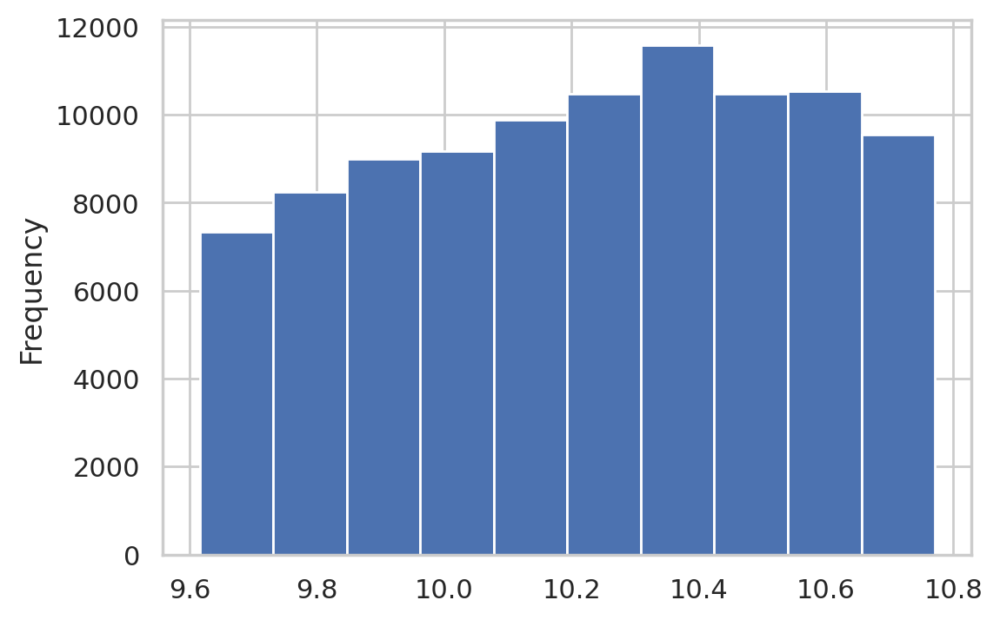

In [128]:
df_new['log_mileage'].plot(kind = 'hist')

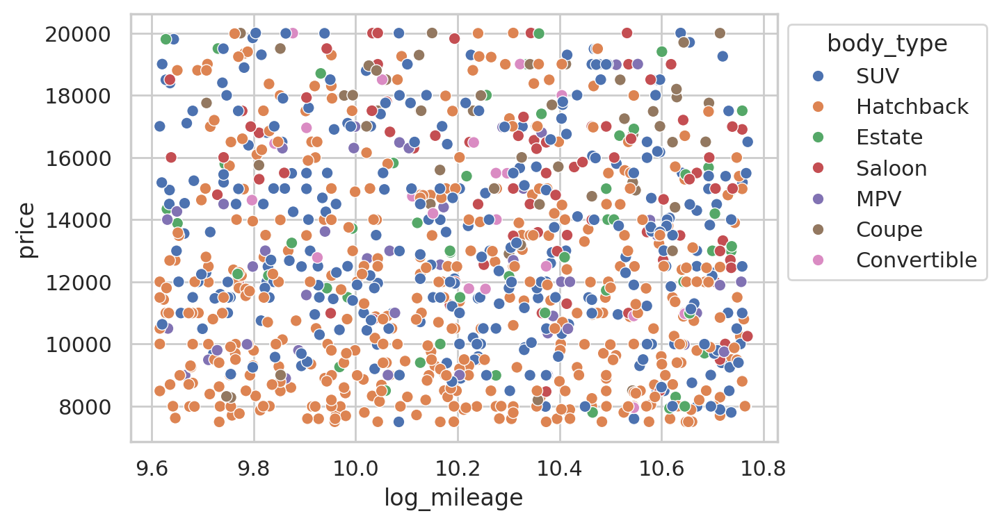

In [129]:
sns.scatterplot(x='log_mileage', y='price', hue='body_type', data=df_new.sample(1000))
plt.legend(title='body_type',bbox_to_anchor=(1, 1))


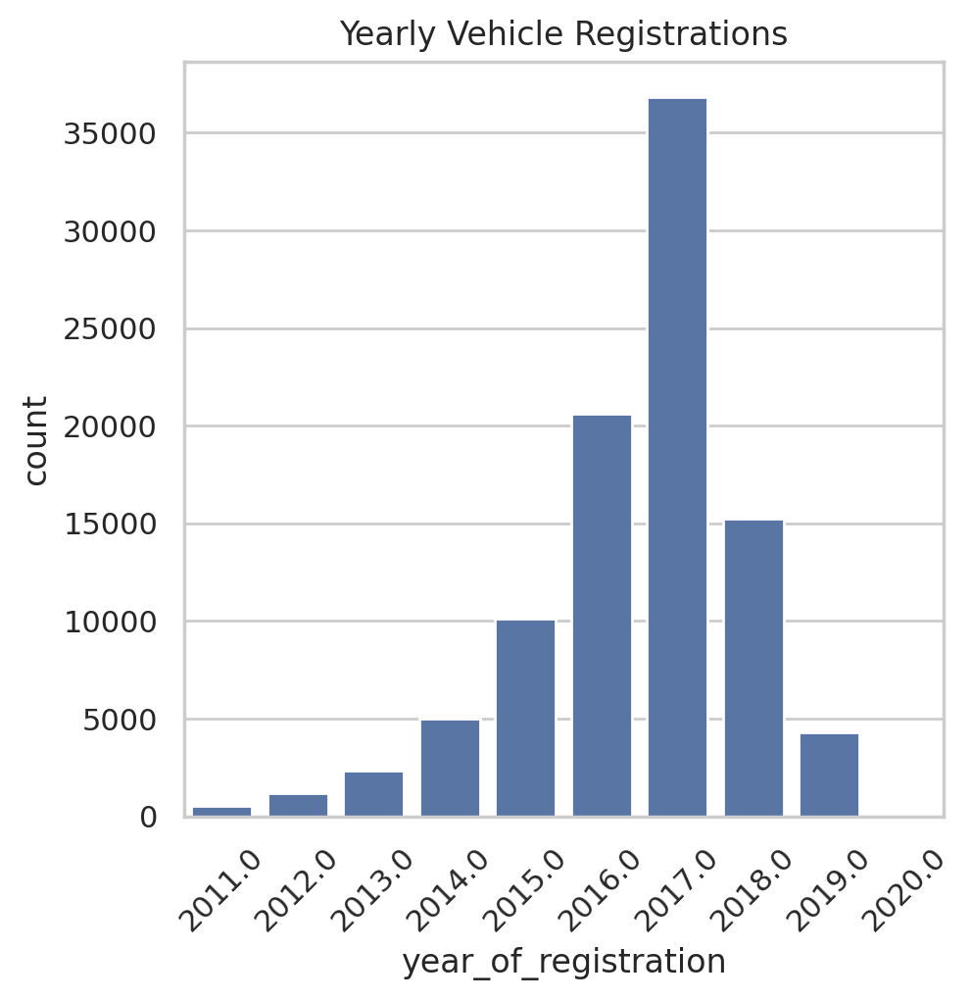

In [130]:
# Group data by the year of registration
registrations_by_year = df_new.groupby('year_of_registration').size().reset_index(name='count')

# Create a bar chart for yearly vehicle registrations
plt.figure(figsize=(5, 5))
sns.barplot(x='year_of_registration', y='count', data=registrations_by_year)
plt.title('Yearly Vehicle Registrations')
plt.xticks(rotation=45)
plt.show()


In [131]:
df_new.sample(10)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,log_mileage
3369,202010275484698,23073.0,15,Grey,Renault,Captur,USED,2015.0,8800,SUV,False,Petrol,10.046418
343060,202009213997875,29193.0,66,Blue,Jaguar,XE,USED,2017.0,15680,Saloon,False,Diesel,10.281684
192549,202010134966898,26500.0,68,Grey,BMW,4 Series Gran Coupe,USED,2018.0,19950,Saloon,False,Petrol,10.184900
353765,202010024501594,39860.0,67,White,BMW,1 Series,USED,2017.0,13995,Hatchback,False,Petrol,10.593129
244347,202010225308348,43836.0,66,White,BMW,1 Series,USED,2016.0,9891,Hatchback,False,Petrol,10.688211
326090,202010175106053,43716.0,67,White,Nissan,Juke,USED,2017.0,10995,SUV,False,Petrol,10.685469
178346,202010235338861,26006.0,17,Red,Mitsubishi,Outlander,USED,2017.0,15750,SUV,False,Diesel,10.166083
351117,202010064652812,16998.0,67,Bronze,Fiat,500L,USED,2017.0,9950,MPV,False,Petrol,9.740851
288725,202009213993038,23000.0,68,Grey,Peugeot,Rifter,USED,2018.0,18990,MPV,False,Diesel,10.043249
400838,202010014455333,18218.0,65,Silver,Mercedes-Benz,E Class,USED,2015.0,17190,Saloon,False,Diesel,9.810165


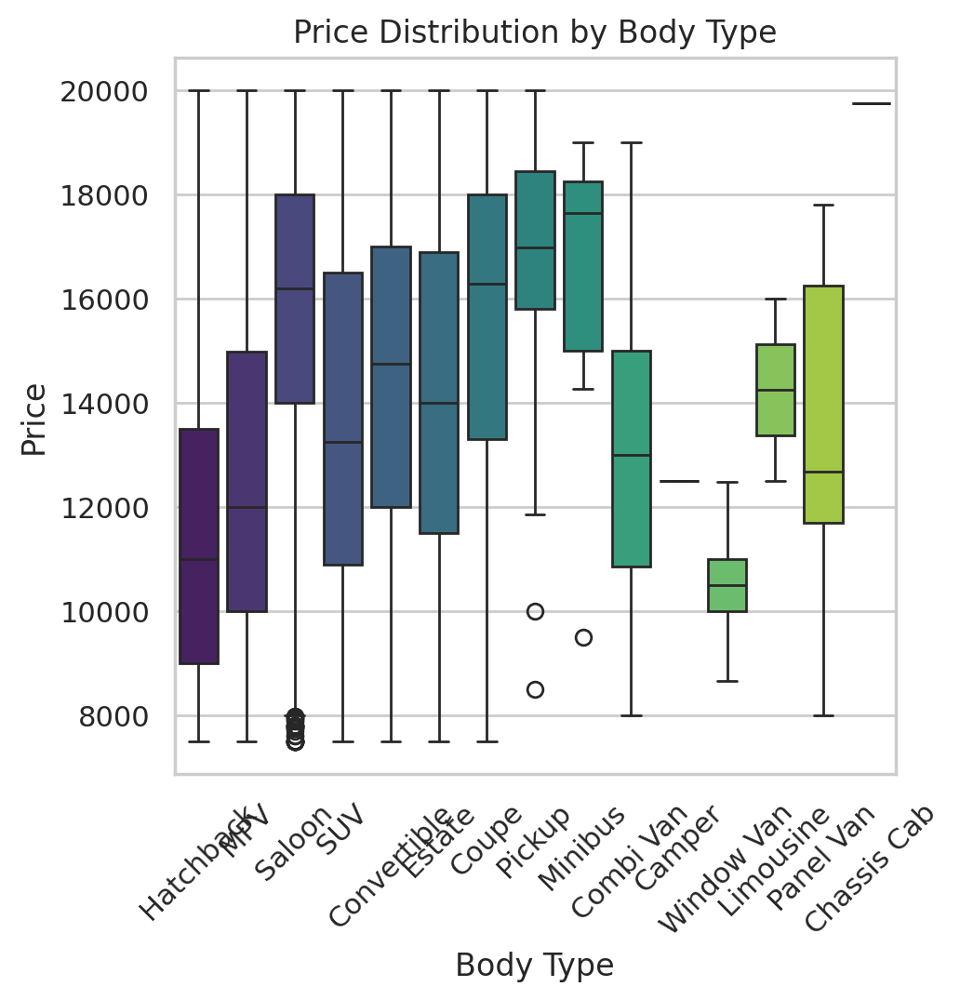

In [132]:
# Box plot for Price by Body Type
plt.figure(figsize=(5, 5))
sns.boxplot(x='body_type', y='price', data=df_new, palette='viridis')
plt.title('Price Distribution by Body Type')
plt.xlabel('Body Type')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.show()

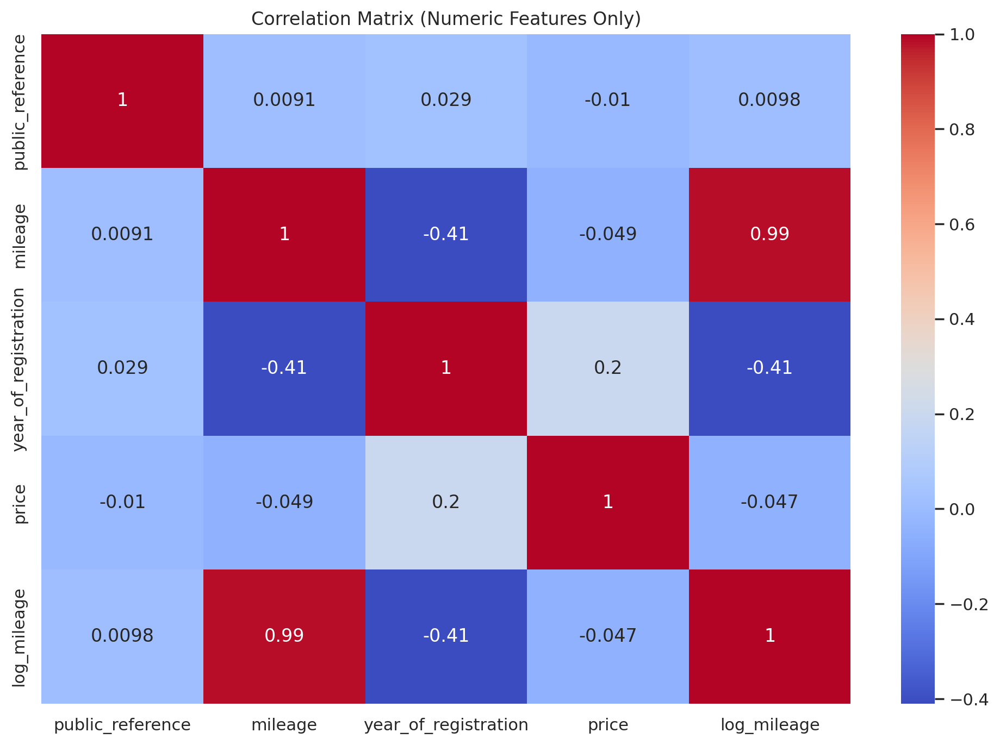

In [134]:
# Heatmap for correlation matrix


# Correlation matrix for numeric features only
numeric_df = df_new.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix (Numeric Features Only)')
plt.show()


In [ ]:
# Distribution of Mileage
# Box plot for Price by Body Type
# Scatter plot for Price vs. Mileage
# Pairplot for numerical features
# Bar plot for Fuel Type
# Heatmap for correlation matrix

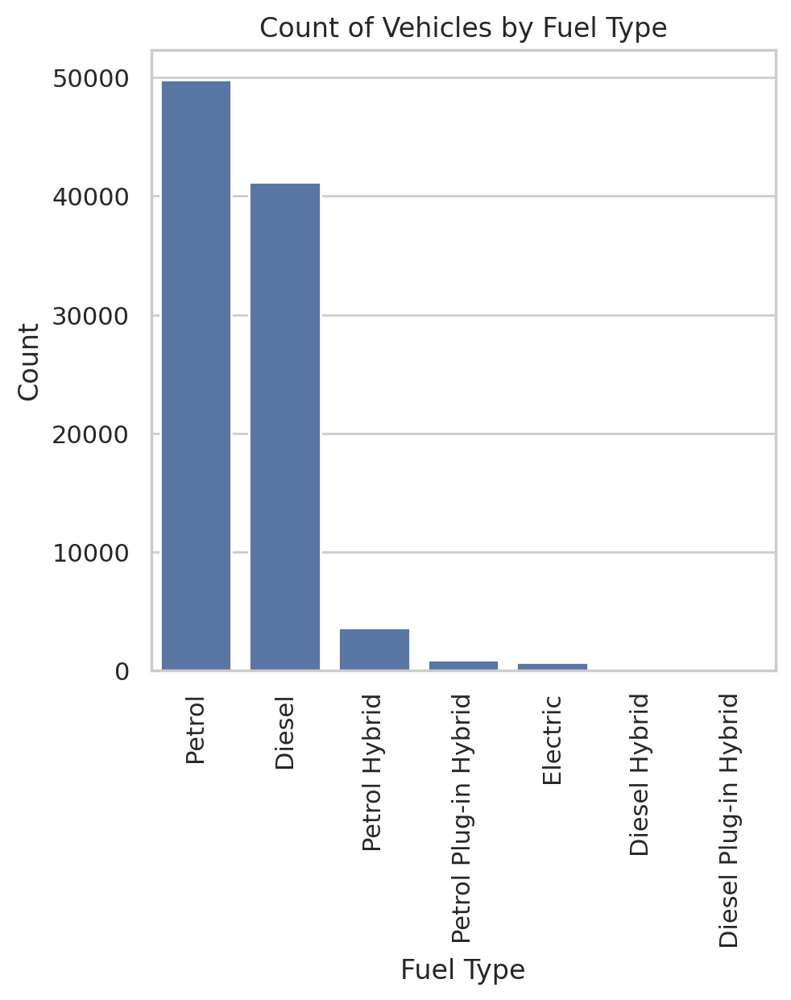

In [135]:

#Group by 'fuel_type' and count the number of vehicles
count_by_fuel_type = df_new.groupby('fuel_type').size().sort_values(ascending=False)

# Bar plot for Count of Vehicles by Fuel Type
plt.figure(figsize=(5, 5))

sns.barplot(x=count_by_fuel_type.index, y=count_by_fuel_type.values)

plt.title('Count of Vehicles by Fuel Type')
plt.xlabel('Fuel Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.show()

In [136]:

# Group by 'fuel_type' and calculate average price
avg_price_by_fuel_type = df_new.groupby('fuel_type')['price'].mean().sort_values(ascending=False)


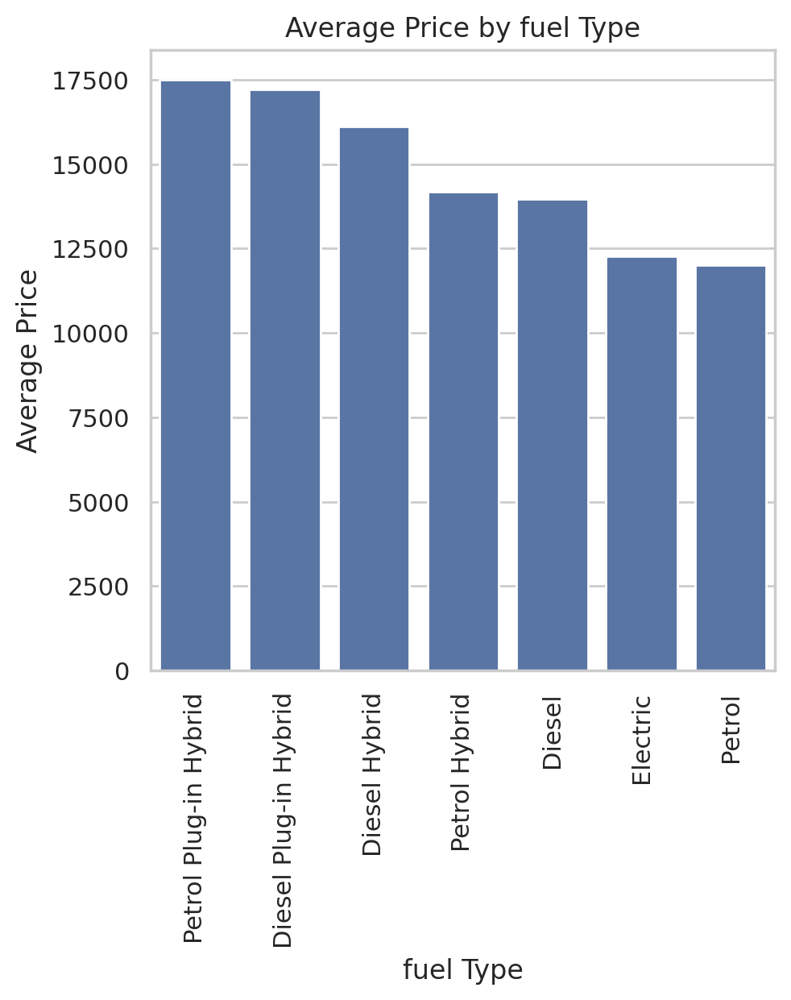

In [137]:
# Bar plot for Average Price by Body Type
plt.figure(figsize=(5, 5))

sns.barplot(x=avg_price_by_fuel_type.index, y=avg_price_by_fuel_type.values)

plt.title('Average Price by fuel Type')
plt.xlabel('fuel Type')
plt.ylabel('Average Price')
plt.xticks(rotation=90)
plt.show()


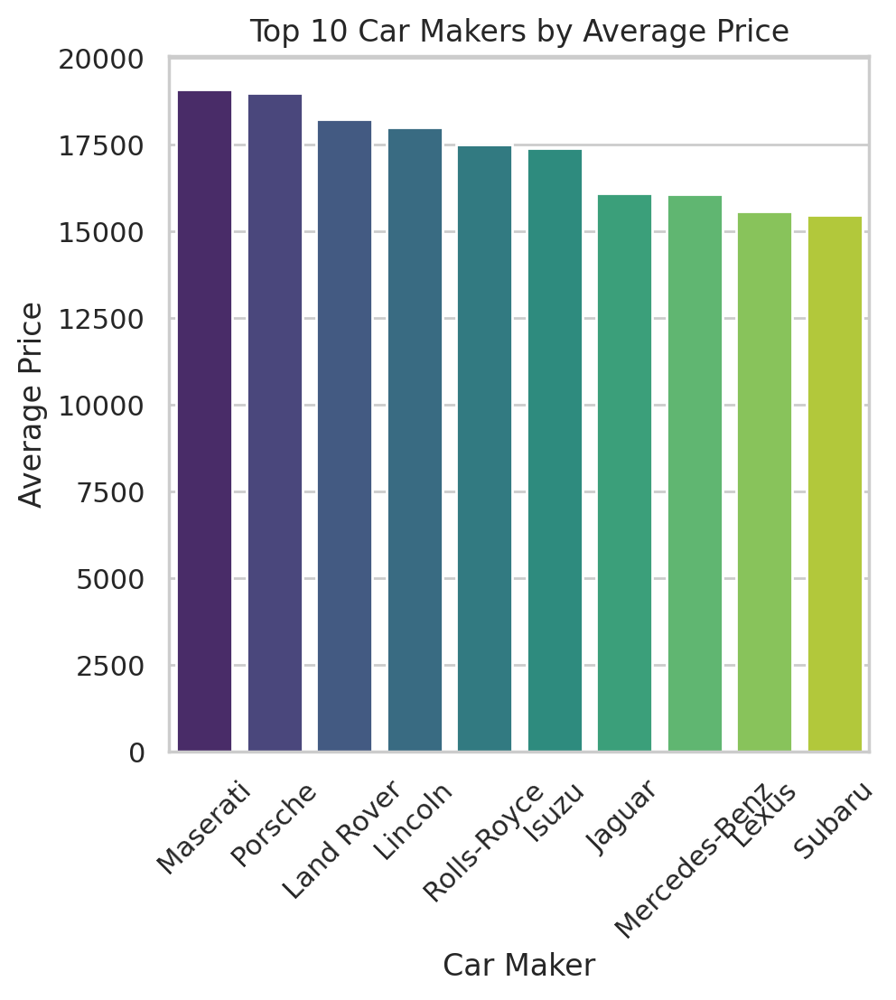

In [138]:
# Group by 'standard_make' and calculate the average price
avg_price_by_maker = df_new.groupby('standard_make')['price'].mean().sort_values(ascending=False)

# Select the top 10 makers
top_10_makers = avg_price_by_maker.head(10)

# Bar plot for Top 10 Makers by Average Price
plt.figure(figsize=(5, 5))
sns.barplot(x=top_10_makers.index, y=top_10_makers.values, palette='viridis')
plt.title('Top 10 Car Makers by Average Price')
plt.xlabel('Car Maker')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()

# data cleaning

In [139]:
df.duplicated().sum()

np.int64(0)

# price column outliers dealing

In [141]:
df['price'].describe()

,price
count,4.020050e+05
mean,1.734197e+04
std,4.643746e+04
min,1.200000e+02
25%,7.495000e+03
50%,1.260000e+04
75%,2.000000e+04
max,9.999999e+06


In [142]:
df['price'].isnull().sum()

np.int64(0)

<Axes: >

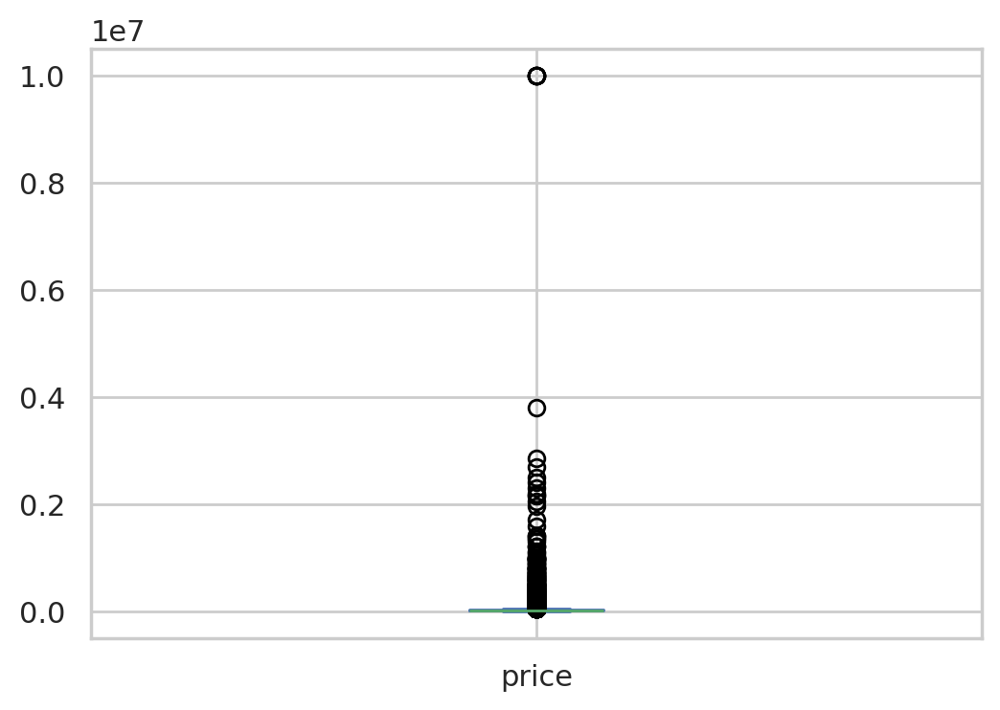

In [143]:
df['price'].plot(kind = 'box')

<Axes: xlabel='price'>

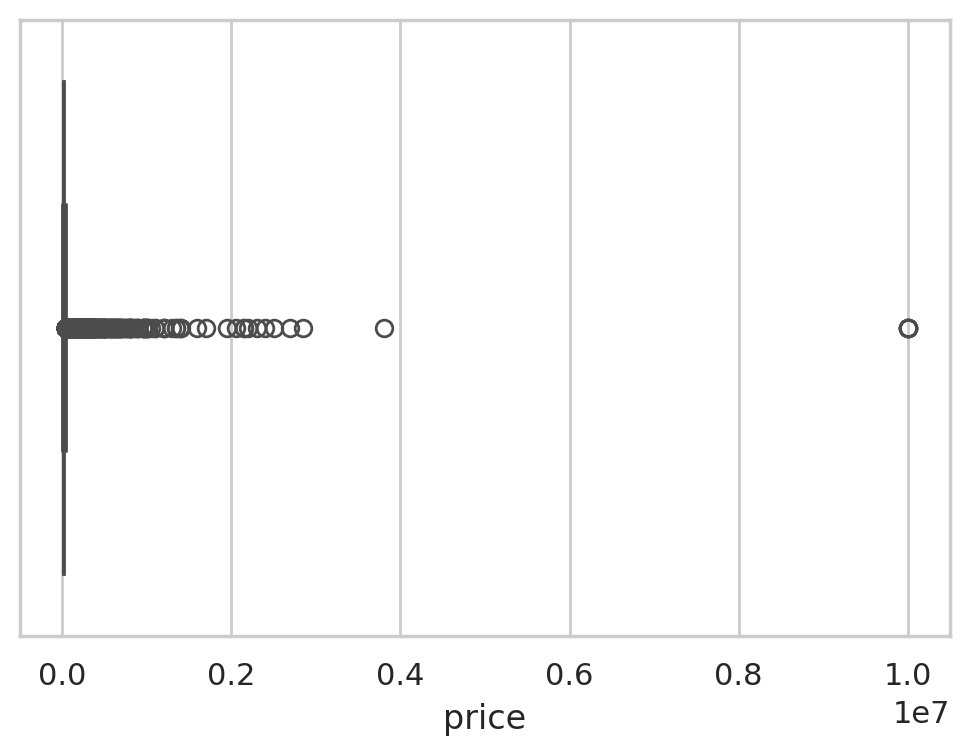

In [144]:
sns.boxplot(data = df , x = 'price')

In [145]:
df.query("price > 4000000")

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
141833,202007050883898,87450.0,NaN,Red,Ferrari,250,USED,NaN,9999999,Coupe,False,Petrol
147188,202009103539048,100.0,NaN,Grey,Maserati,3500,USED,NaN,9999999,Convertible,False,Petrol
252505,202008112331147,46300.0,NaN,Blue,Ferrari,275,USED,NaN,9999999,Coupe,False,Petrol
305436,201812223434109,3600.0,NaN,Grey,Lamborghini,Miura,USED,NaN,9999999,Coupe,False,Petrol
336202,202001226429470,950.0,NaN,Black,Ferrari,LaFerrari,USED,NaN,9999999,Coupe,False,Petrol
336536,202006180262926,4400.0,NaN,White,Porsche,959,USED,NaN,9999999,Coupe,False,Petrol


In [146]:
df.query("price > 200000")

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
113,202009103575016,1568.0,19,Black,McLaren,Senna,USED,2019.0,585000,Coupe,False,Petrol
1004,202006110024693,7253.0,66,Black,Lamborghini,Aventador,USED,2016.0,219995,Coupe,False,Petrol
1335,202004018824812,76000.0,NaN,White,Aston Martin,DB4,USED,2018.0,495000,Saloon,False,Petrol
3343,202010225314982,50.0,68,NaN,Porsche,911,USED,2018.0,299950,Coupe,False,Petrol
3399,201809040153397,461.0,H,Green,Aston Martin,DB6,USED,1970.0,950000,Convertible,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
398009,201908100998692,3000.0,19,Blue,Lamborghini,Aventador,USED,2019.0,349990,Coupe,False,Petrol
398498,202009304407377,2516.0,69,Red,Ferrari,488 Pista,USED,2019.0,298950,Coupe,False,Petrol
399025,202005289599976,17.0,19,NaN,McLaren,Senna,USED,2019.0,799900,NaN,False,NaN
401566,202010134939512,552.0,69,Red,Ferrari,488 Pista,USED,2019.0,310830,Coupe,False,Petrol


<Axes: >

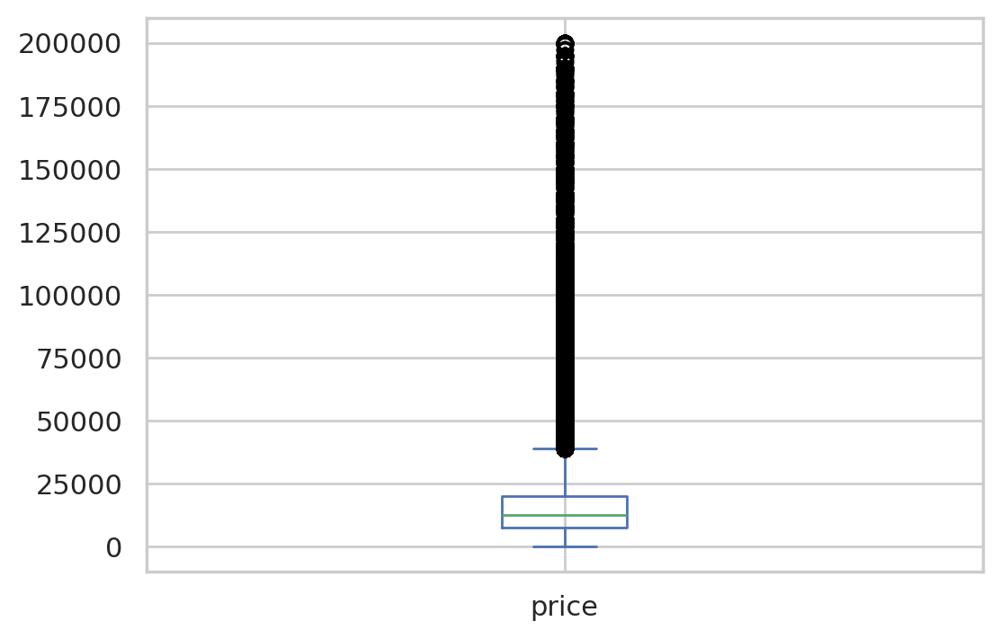

In [147]:
df[df['price'] < 200000]['price'].plot(kind='box')


<Axes: >

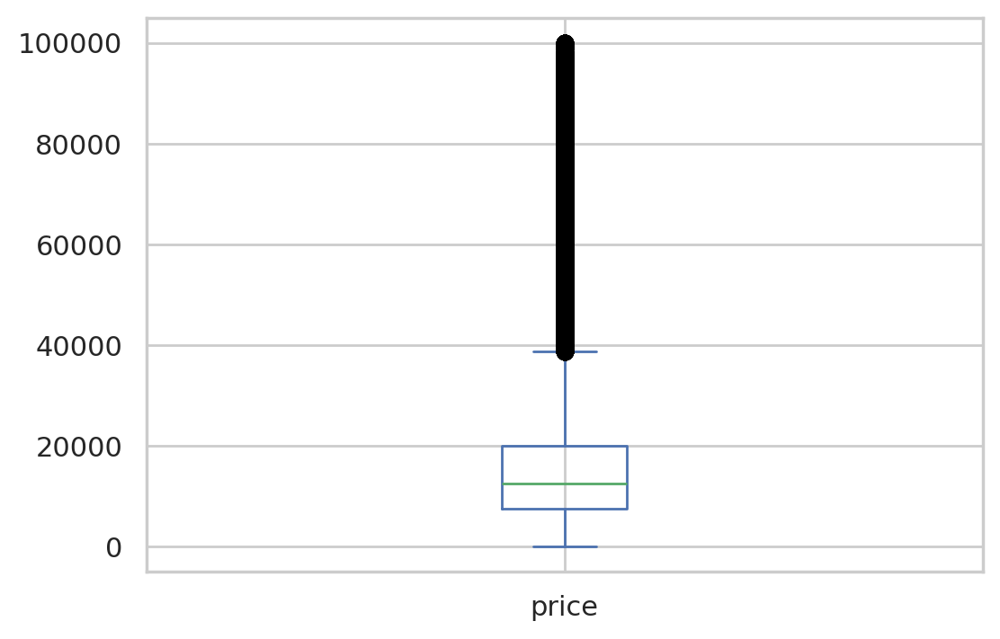

In [148]:
df[df['price'] < 100000]['price'].plot(kind='box')


In [149]:

# removing some outliers in price column manually which are greater than 100000
df = df[df['price'] < 100000]
#Reset the index
df = df.reset_index(drop= True)


In [150]:
df.shape

(399173, 12)

In [151]:
402005 - 399173

2832

<Axes: xlabel='price', ylabel='Count'>

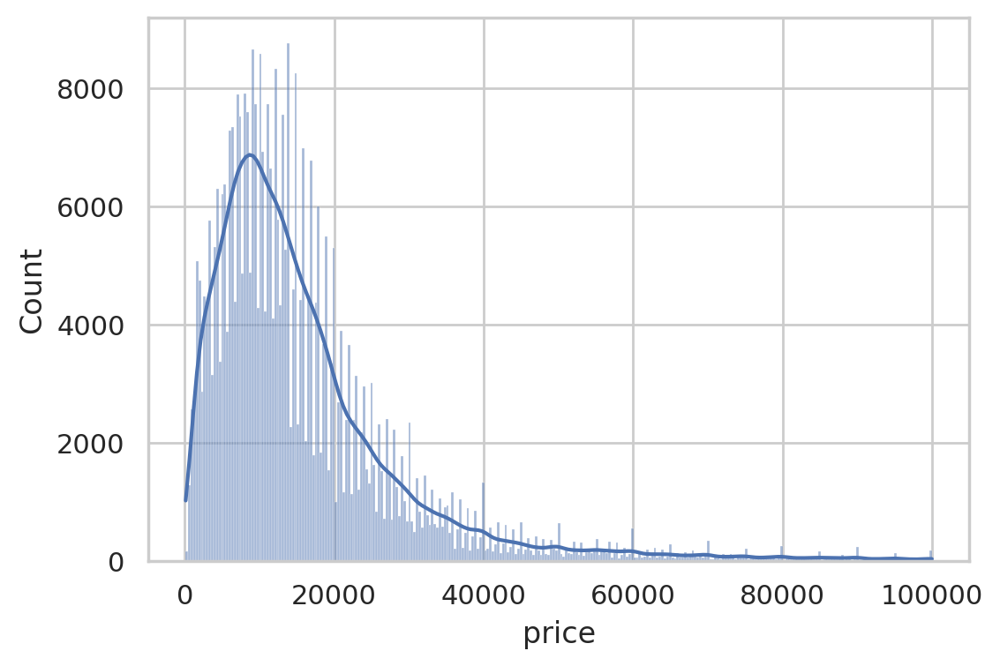

In [152]:
sns.histplot(data = df, x = 'price', kde = True)

In [153]:
#q1 = df['price'].quantile(0.25)
#q3 = df['price'].quantile(0.75)
#IQR =q3 -q1

In [154]:
#outliers in price colum
#outliers = df[(df['price']< (q1 - 1.5*IQR)) | (df['price']> (q3+1.5*IQR))]
#print("outliers in price column are :",outliers.shape[0])

In [155]:
#outliers.shape # there are total of 26269 outliers in a price column.

In [156]:
# removing outliers in price column
#df = df[(df['price'] >=(q1 - 1.5*IQR) ) & (df['price'] <=(q3+1.5*IQR) )]
# Reset the index
#df = df.reset_index(drop=True)

In [157]:
#sns.boxplot(data = df, x = 'price' ) # with removed outlers using Inter Quartile range and the remaining outliers are considerable .

In [158]:
#sns.histplot(data = df, x = 'price' , bins = 25 , kde = True)

In [159]:
#Finding null values or missing values
#df['price'].isnull().sum()

# mileage outliers dealing

In [160]:
#dealing with missing values and outliers in mileage column

In [161]:
#checking missing values
df['mileage'].isna().sum()

np.int64(124)

In [162]:
df['mileage'].median()

28972.0

In [163]:
# filling missing values of mileage column.
df['mileage'] = df['mileage'].fillna(df['mileage'].median())

In [164]:
df['mileage'].isnull().sum()# no missing values in mileage column

np.int64(0)

<Axes: xlabel='mileage'>

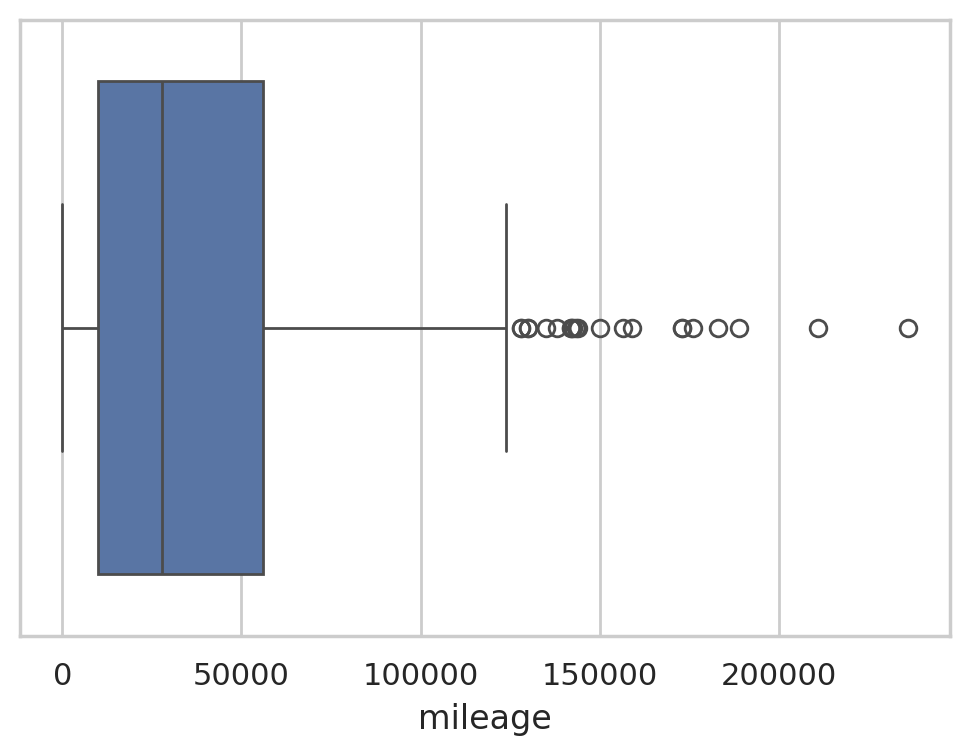

In [165]:
sns.boxplot(data = df.sample(1000) , x = 'mileage')

In [166]:
df['mileage'].describe()

,mileage
count,399173.000000
mean,37952.220456
std,34843.793137
min,0.000000
25%,10758.000000
50%,28972.000000
75%,57000.000000
max,999999.000000


In [167]:
q1 = df['mileage'].quantile(0.25)

In [168]:
q3 = df['mileage'].quantile(0.75)

In [169]:
iqr = q3 - q1



In [170]:
#outliers in mileage column
outliers = df[(df['mileage']< q1 - (1.5* iqr)) | (df['mileage']> q3 + (1.5* iqr))]
print('outliers in mileage column are:',outliers.shape[0])

outliers in mileage column are: 8189


In [171]:
outliers

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
32,201905097776109,180000.0,64,White,SKODA,Octavia,USED,2014.0,3989,Hatchback,False,Diesel
86,202008262951083,158900.0,03,Grey,Honda,Accord,USED,2003.0,1395,Estate,False,Petrol
164,202009244172272,143000.0,58,Red,Land Rover,Freelander 2,USED,2008.0,3390,SUV,False,Diesel
186,202009304395201,151580.0,08,Black,Audi,TT,USED,2008.0,3490,Coupe,False,Petrol
213,202010064650799,135000.0,11,Black,Volkswagen,Golf,USED,2011.0,3599,Estate,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...,...
398913,202008142487322,130000.0,16,White,SKODA,Superb,USED,2016.0,8991,Estate,False,Diesel
399035,202010054615465,139567.0,64,Beige,SKODA,Octavia,USED,2014.0,3995,Hatchback,False,Diesel
399102,202010205229756,128787.0,02,Silver,Peugeot,206,USED,2002.0,989,Hatchback,False,Petrol
399119,202010235326414,285038.0,P,Blue,Toyota,Land Cruiser Amazon,USED,1997.0,9990,SUV,False,Diesel


In [172]:
#removing the outliers
df = df[(df['mileage'] >= q1 - (1.5* iqr)) & (df['mileage'] <= q3 + (1.5* iqr))]
# Reset the index
df = df.reset_index(drop=True)

In [173]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390984 entries, 0 to 390983
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       390984 non-null  int64  
 1   mileage                390984 non-null  float64
 2   reg_code               359467 non-null  object 
 3   standard_colour        385972 non-null  object 
 4   standard_make          390984 non-null  object 
 5   standard_model         390984 non-null  object 
 6   vehicle_condition      390984 non-null  object 
 7   year_of_registration   358046 non-null  float64
 8   price                  390984 non-null  int64  
 9   body_type              390208 non-null  object 
 10  crossover_car_and_van  390984 non-null  bool   
 11  fuel_type              390424 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 33.2+ MB


<Axes: xlabel='mileage'>

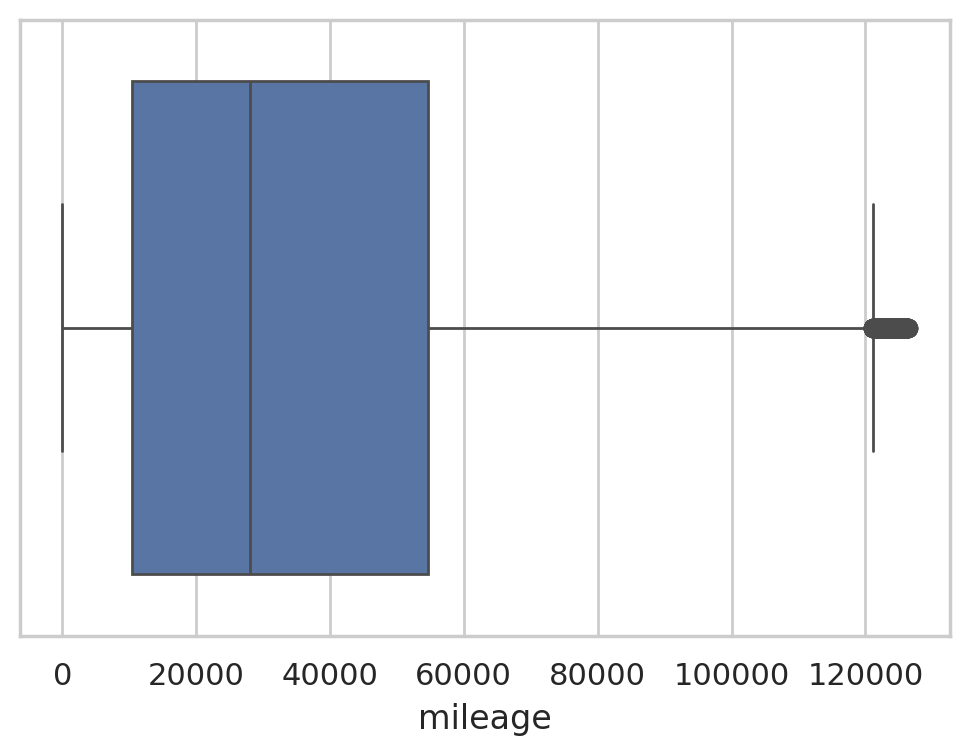

In [174]:
sns.boxplot(data =df , x = 'mileage')

# year of registration outliers and missing values

In [175]:
df['year_of_registration'].describe()

,year_of_registration
count,358046.000000
mean,2015.165621
std,7.937321
min,999.000000
25%,2013.000000
50%,2016.000000
75%,2018.000000
max,2020.000000


<Axes: xlabel='year_of_registration'>

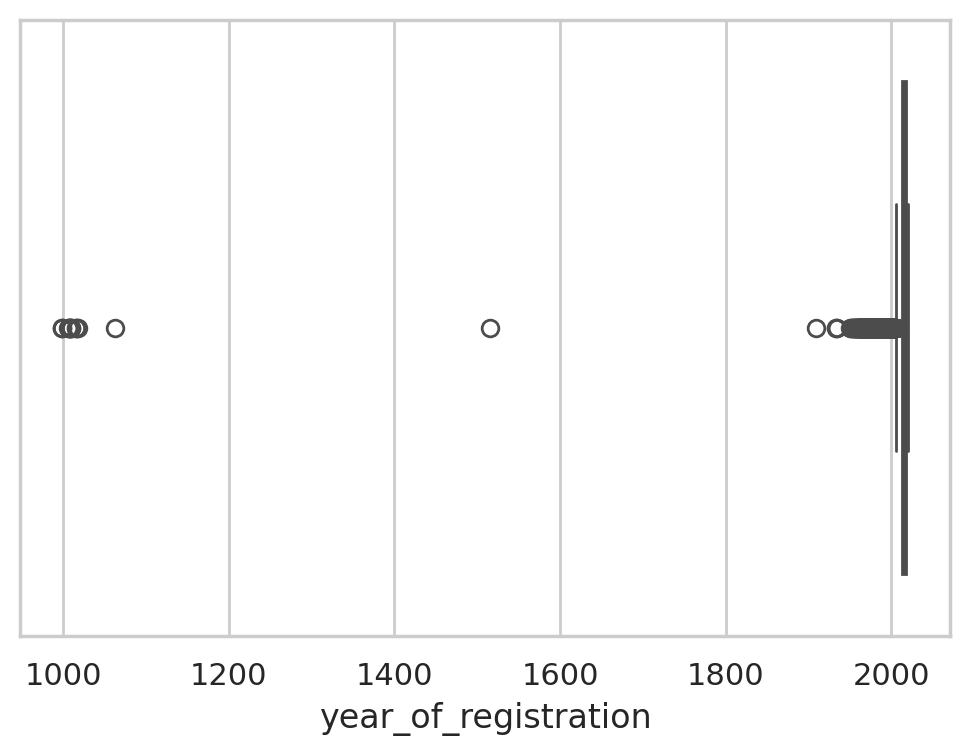

In [176]:
sns.boxplot( data = df , x = 'year_of_registration')

In [177]:
df[(df['year_of_registration'] <=1600)]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
57443,202006270588110,14000.0,07,Blue,Toyota,Prius,USED,1007.0,7000,Hatchback,False,Petrol Hybrid
67644,202010155035879,96659.0,65,Black,Audi,A4 Avant,USED,1515.0,10385,Estate,False,Diesel
82233,202009163810376,37771.0,63,Black,Smart,fortwo,USED,1063.0,4785,Coupe,False,Petrol
111636,202008102305925,30000.0,59,Red,Toyota,AYGO,USED,1009.0,4695,Hatchback,False,Petrol
117579,202010064654489,27200.0,66,Black,MINI,Clubman,USED,1016.0,18990,Estate,False,Diesel
185425,202010205206488,58470.0,10,Black,Fiat,Punto Evo,USED,1010.0,3785,Hatchback,False,Petrol
194427,202009013167637,23000.0,59,Silver,MINI,Hatch,USED,1009.0,5995,Hatchback,False,Petrol
194581,202010225311657,104000.0,08,Silver,BMW,1 Series,USED,1008.0,4395,Convertible,False,Petrol
196160,202010134937656,8600.0,68,Silver,BMW,M2,USED,1018.0,41990,Coupe,False,Petrol
196170,202010155037484,69346.0,64,Red,Mazda,Mazda3,USED,999.0,8795,Saloon,False,Petrol


In [178]:
#In the year column based on the reg_code , I added 1000 to the values which are less than 1600 .
df.loc[df['year_of_registration'] <= 1600, 'year_of_registration'] += 1000

In [179]:
df[df['year_of_registration'] <= 1600]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


<Axes: xlabel='year_of_registration'>

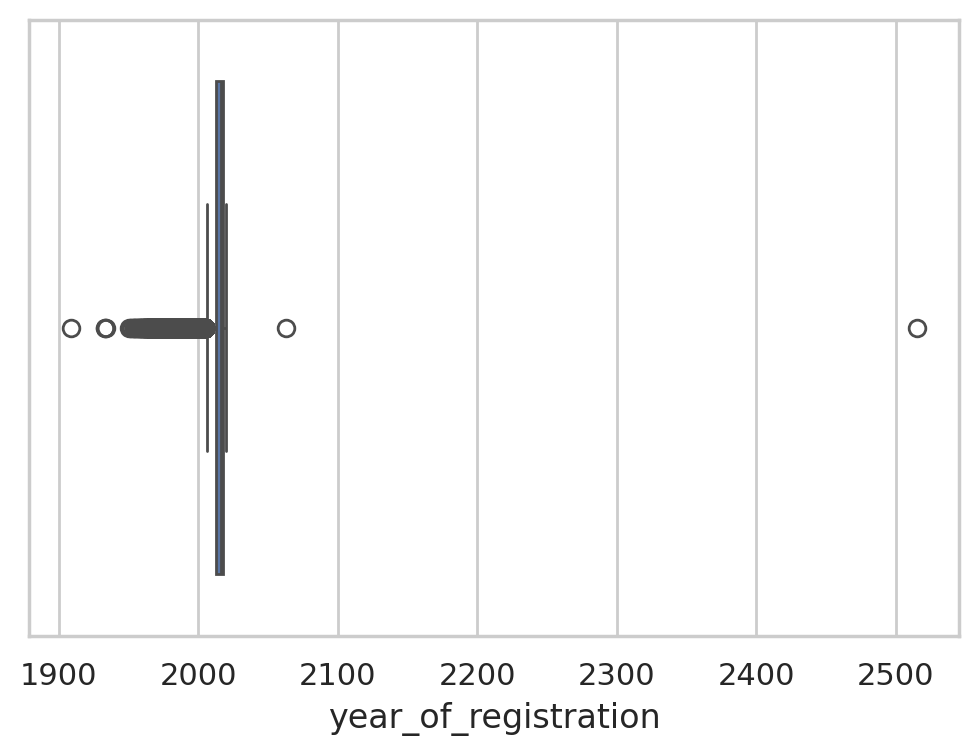

In [180]:
sns.boxplot( data = df , x = 'year_of_registration')

In [181]:
df[df['year_of_registration'] > 2020]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
67644,202010155035879,96659.0,65,Black,Audi,A4 Avant,USED,2515.0,10385,Estate,False,Diesel
82233,202009163810376,37771.0,63,Black,Smart,fortwo,USED,2063.0,4785,Coupe,False,Petrol


In [182]:
#based on the reg_code column , just remove 500 from year of registration where year of registration = 2515. it should be 2015 .
df.loc[df['year_of_registration'] == 2515, 'year_of_registration'] -= 500

In [183]:

df[df['year_of_registration'] > 2020]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
82233,202009163810376,37771.0,63,Black,Smart,fortwo,USED,2063.0,4785,Coupe,False,Petrol


In [184]:
#based on the reg_code column , just remove 50 from year of registration where year of registration = 2063. it should be 2013 .
df.loc[df['year_of_registration'] == 2063, 'year_of_registration'] -= 50

In [185]:
df[df['year_of_registration'] > 2020]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


<Axes: xlabel='year_of_registration'>

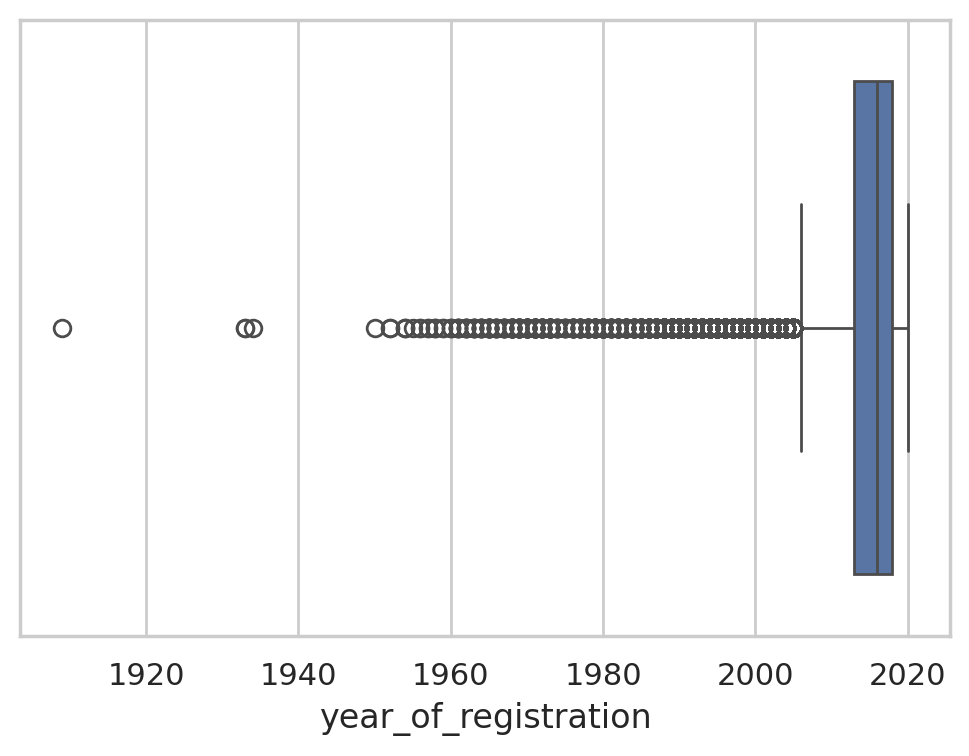

In [186]:
sns.boxplot( data = df , x = 'year_of_registration')

In [187]:
df[df['year_of_registration'] <1920]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
144004,202010104836987,31172.0,09,Black,Hyundai,i10,USED,1909.0,3950,Hatchback,False,Petrol


In [188]:
#based on the reg_code column , just add 100 to the year of registration where year of registration = 1909. it should be 2009 .
df.loc[df['year_of_registration'] == 1909, 'year_of_registration'] += 100

<Axes: xlabel='year_of_registration'>

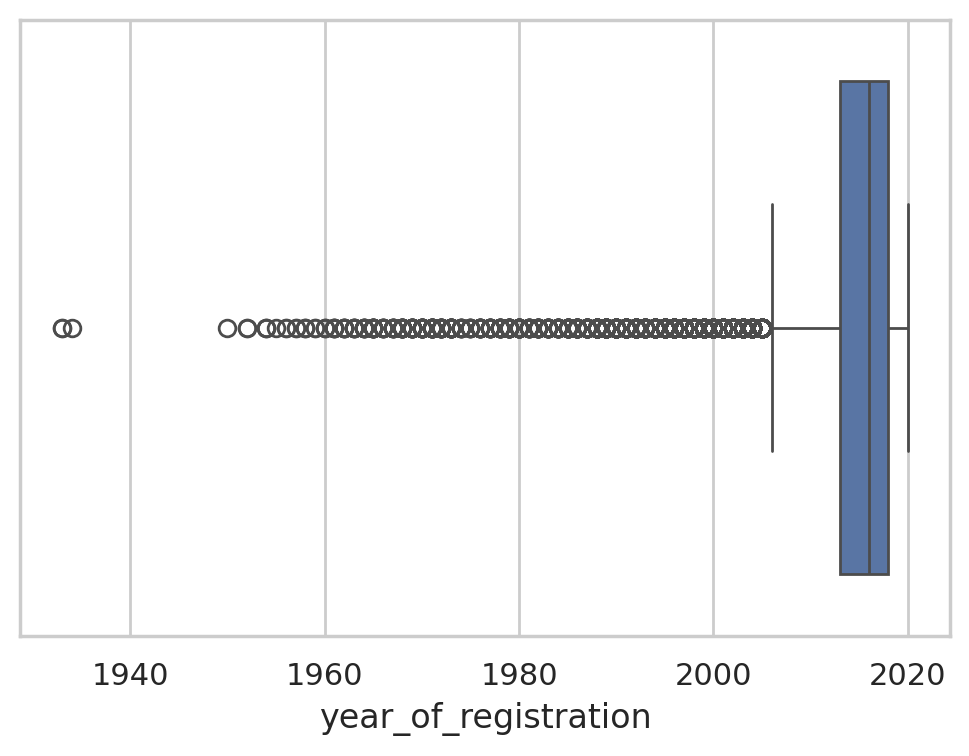

In [189]:
sns.boxplot( data = df , x = 'year_of_registration')

In [190]:
df = df.drop(df[df['year_of_registration'] <= 1940].index)


In [191]:
df[df['year_of_registration'] < 2000]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
25,202008042070611,49585.0,B,NaN,Ferrari,308,USED,1984.0,54475,Convertible,False,Petrol
891,202010205220204,58980.0,D,Burgundy,Panther,Kallista,USED,1986.0,12950,Convertible,False,Petrol
927,202010275488566,82000.0,S,Grey,Renault,Clio,USED,1998.0,350,Hatchback,False,Petrol
1360,202009023221992,95000.0,K,NaN,Mercedes-Benz,SL Class,USED,1993.0,26995,Convertible,False,Petrol
2299,202005249521769,20000.0,V,Green,TVR,Griffith,USED,1999.0,27500,Convertible,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
388707,202006200351687,121788.0,E,White,Volvo,480,USED,1988.0,1990,Coupe,False,Petrol
389125,202009063375684,18700.0,T,Blue,TVR,Chimaera,USED,1999.0,21000,Convertible,False,Petrol
389413,202008062165360,32000.0,M,NaN,Triumph,Stag,USED,1974.0,12000,Convertible,False,Petrol
389678,202006109989307,5800.0,A,Blue,Fiat,500,USED,1963.0,9500,Saloon,False,Petrol


In [192]:
df['year_of_registration'].describe()

,year_of_registration
count,358043.000000
mean,2015.212530
std,4.149657
min,1950.000000
25%,2013.000000
50%,2016.000000
75%,2018.000000
max,2020.000000


In [193]:
df['year_of_registration'].info()

<class 'pandas.core.series.Series'>
Index: 390981 entries, 0 to 390983
Series name: year_of_registration
Non-Null Count   Dtype  
--------------   -----  
358043 non-null  float64
dtypes: float64(1)
memory usage: 6.0 MB


In [194]:
df[df['year_of_registration'].isna() & df['reg_code'].notna()]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
53,202007030806426,30000.0,18,Red,Vauxhall,Insignia,USED,NaN,11990,Hatchback,False,Petrol
82,202008222801747,42847.0,61,Red,Honda,Jazz,USED,NaN,5695,Hatchback,False,Petrol
842,202010084741550,43130.0,66,White,Land Rover,Range Rover Sport,USED,NaN,35990,SUV,False,Diesel
943,202010305607535,63369.0,17,Blue,SKODA,Rapid Spaceback,USED,NaN,7490,Hatchback,False,Diesel
1223,202010225294466,18715.0,68,White,Volvo,V40,USED,NaN,16950,NaN,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
389358,202010315635977,66287.0,63,Blue,Vauxhall,Astra GTC,USED,NaN,8400,Coupe,False,Petrol
389737,202008252905656,45.0,20,Silver,Land Rover,Range Rover Evoque,USED,NaN,46945,SUV,False,Diesel
390313,202010315635541,12522.0,67,Red,Dacia,Sandero,USED,NaN,6300,Hatchback,False,Petrol
390321,201909222504136,46000.0,13,Grey,Volkswagen,Caravelle,USED,NaN,22995,MPV,False,Diesel


the type of reg_code is object in pandas . with out disturbing the alphabet values of reg code , please use the condition if reg_code is less 50 then assign the corresponding value of reg_code by adding 2000 it and if the value of reg_code is greater than 50 , then just subtract the reg_code value from 50 and and then add the subtracted value with 2000 then assign the result to the corresponding value of reg_code in year of registration. Just fill the null values of year_of_registration column . Don't disturb the non null values of year of registration

In [195]:
def fill_year_of_registration(row):
    if pd.isna(row['year_of_registration']):
        try:
            reg_code = pd.to_numeric(row['reg_code'])
            if reg_code < 50:
                return reg_code + 2000
            elif reg_code > 50:
                return 2000 + (reg_code - 50)
        except ValueError:
            pass  # Handle non-numeric values in reg_code
    return row['year_of_registration']

# Apply the custom function to fill null values in "year_of_registration"
df['year_of_registration'] = df.apply(fill_year_of_registration, axis=1)



In [196]:
df[df['year_of_registration'].isna() & df['reg_code'].notna()]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
9736,202003098187902,73330.0,B,Gold,Jaguar,Mark II,USED,NaN,24990,Saloon,False,Petrol
16152,202010165086036,34000.0,P,Orange,Volkswagen,Campervan,USED,NaN,12500,Camper,False,Petrol
27524,202003218665171,55400.0,E,White,Renault,GTA,USED,NaN,12495,Coupe,False,Petrol
48837,202009304378374,24500.0,R,Blue,Mazda,Mazda3,USED,NaN,13495,Hatchback,False,Petrol
49584,202010215260465,49000.0,L,Blue,Chevrolet,SSR,USED,NaN,21500,Pickup,False,Bi Fuel
78723,202010014455127,2000.0,CA,Green,Caterham,Seven,USED,NaN,21995,Convertible,False,Petrol
82913,202009234126186,99123.0,B,Green,Land Rover,Series III,USED,NaN,12000,Pickup,True,Petrol
93061,202010215267071,55389.0,E,Grey,Mercedes-Benz,E Class,USED,NaN,25990,Coupe,False,Diesel
118057,201906199165858,40000.0,Y,Black,Porsche,911,USED,NaN,39990,Coupe,False,Petrol
118368,202010315654601,76066.0,L,Red,BMW,3 Series,USED,NaN,8990,Convertible,False,Petrol


<Axes: xlabel='year_of_registration'>

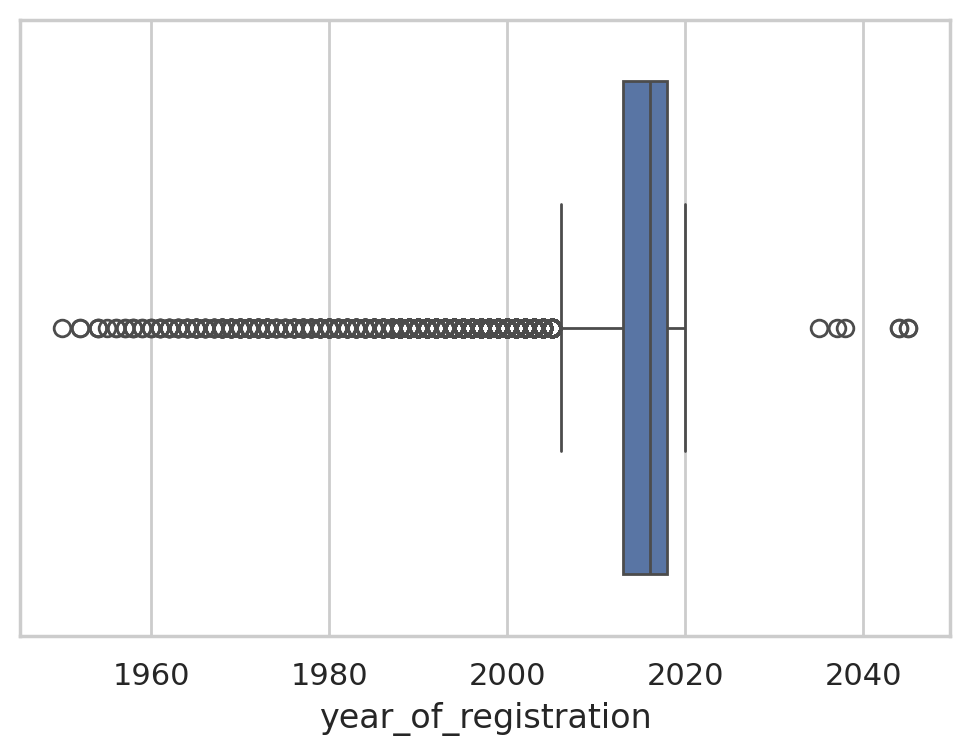

In [197]:
sns.boxplot(data = df , x = 'year_of_registration')

In [198]:
df = df.drop(df[df['year_of_registration'] > 2020].index)

In [199]:
df[df['year_of_registration'].isna()]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
17,201911043995897,5.0,NaN,NaN,Nissan,X-Trail,NEW,NaN,27595,SUV,False,Diesel
19,202008272998331,0.0,NaN,White,Volkswagen,T-Cross,NEW,NaN,25000,SUV,False,Petrol
36,202001306737473,0.0,NaN,White,Fiat,Panda,NEW,NaN,13999,Hatchback,False,Petrol
43,202003178531910,0.0,NaN,NaN,Honda,Civic,NEW,NaN,19495,Hatchback,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
390844,202010024501227,10.0,NaN,Silver,Mitsubishi,Shogun Sport,NEW,NaN,31999,SUV,False,Diesel
390873,202010104843364,5.0,NaN,Red,BMW,Z4,NEW,NaN,47910,Convertible,False,Petrol
390885,202010134960554,10.0,NaN,White,BMW,3 Series,NEW,NaN,35023,Saloon,False,Petrol
390888,202010144983518,0.0,NaN,Red,Land Rover,Range Rover Evoque,NEW,NaN,44995,SUV,False,Petrol


<Axes: xlabel='year_of_registration'>

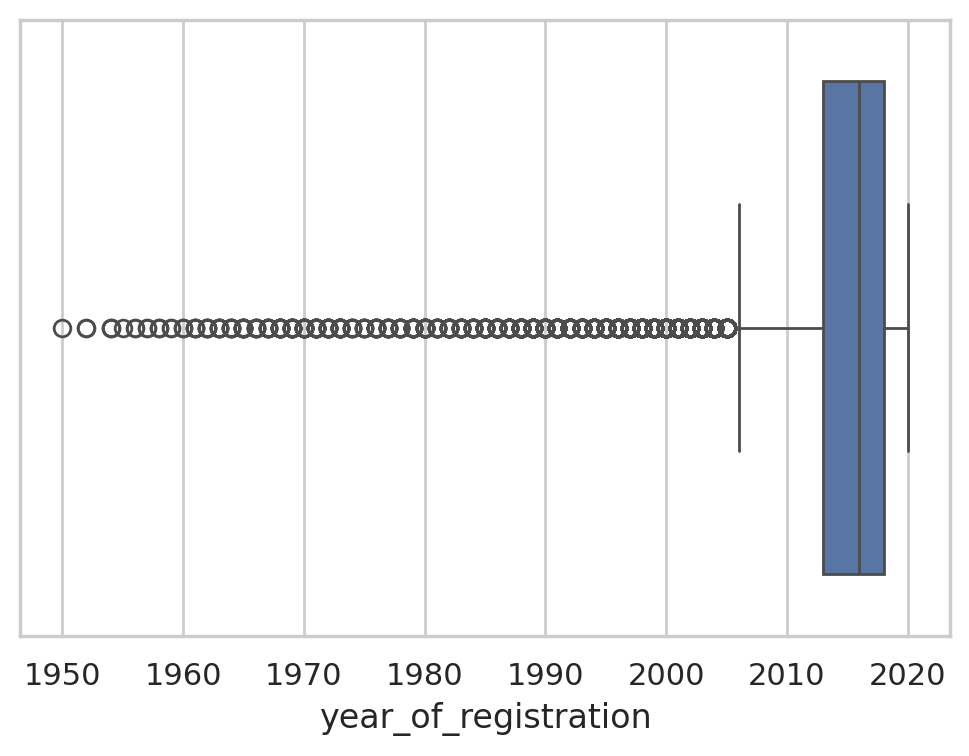

In [200]:
sns.boxplot(data = df , x = 'year_of_registration')

In [201]:
df[df['year_of_registration'].isna() & df['reg_code'].notna()]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
9736,202003098187902,73330.0,B,Gold,Jaguar,Mark II,USED,NaN,24990,Saloon,False,Petrol
16152,202010165086036,34000.0,P,Orange,Volkswagen,Campervan,USED,NaN,12500,Camper,False,Petrol
27524,202003218665171,55400.0,E,White,Renault,GTA,USED,NaN,12495,Coupe,False,Petrol
48837,202009304378374,24500.0,R,Blue,Mazda,Mazda3,USED,NaN,13495,Hatchback,False,Petrol
49584,202010215260465,49000.0,L,Blue,Chevrolet,SSR,USED,NaN,21500,Pickup,False,Bi Fuel
78723,202010014455127,2000.0,CA,Green,Caterham,Seven,USED,NaN,21995,Convertible,False,Petrol
82913,202009234126186,99123.0,B,Green,Land Rover,Series III,USED,NaN,12000,Pickup,True,Petrol
93061,202010215267071,55389.0,E,Grey,Mercedes-Benz,E Class,USED,NaN,25990,Coupe,False,Diesel
118057,201906199165858,40000.0,Y,Black,Porsche,911,USED,NaN,39990,Coupe,False,Petrol
118368,202010315654601,76066.0,L,Red,BMW,3 Series,USED,NaN,8990,Convertible,False,Petrol


In [202]:
df[(df['reg_code'].notna()) & (df['reg_code'].str.isalpha()) & (df['year_of_registration' ] < 1983 )].sample(10)


,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
131378,202006230435492,124000.0,G,Beige,Rolls-Royce,Silver Shadow,USED,1969.0,19950,Saloon,False,Petrol
152370,202010064678876,5800.0,L,Blue,Jaguar,SS,USED,1972.0,79950,Convertible,False,Petrol
75919,202011015670147,46500.0,H,Red,MG,MGB GT,USED,1969.0,8500,Coupe,False,Petrol
233698,202009103544839,89000.0,A,Blue,Land Rover,Series II,USED,1963.0,8990,SUV,False,Petrol
340181,202010054636477,77100.0,W,Silver,Porsche,911,USED,1980.0,54995,Coupe,False,Petrol
324403,202003318811119,75983.0,L,Blue,Alfa Romeo,2000,USED,1973.0,12000,Saloon,False,Petrol
266840,202010074716074,5239.0,L,Green,Fiat,127,USED,1973.0,17995,Hatchback,False,Petrol
386441,201910243665776,22976.0,R,Blue,Rolls-Royce,Corniche,USED,1977.0,85000,Saloon,False,Petrol
373999,202009224044303,92000.0,R,Brown,Rover,P6,USED,1976.0,9995,Saloon,False,Petrol
113064,202010084744636,69471.0,L,Blue,Jensen,Interceptor,USED,1973.0,18500,Saloon,False,Petrol


In [203]:
df[df['year_of_registration'] < 1963]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
15141,202010034549723,45162.0,NaN,Silver,Daimler,SP,USED,1962.0,49995,Convertible,False,Petrol
48223,202010145006063,9000.0,NaN,NaN,Land Rover,Series II,USED,1961.0,39995,Pickup,False,Petrol
63559,202008062171865,90000.0,NaN,Multicolour,International,Harvester A100,USED,1957.0,24995,Pickup,False,Petrol
85563,202009284324932,10000.0,NaN,Green,Morgan,Plus Four,USED,1954.0,39950,Convertible,False,Petrol
105916,202002137272949,103808.0,NaN,Green,Land Rover,Series I,USED,1955.0,25000,Pickup,False,Petrol
114148,202007171355312,53399.0,NaN,Grey,Rover,110,USED,1962.0,7295,Saloon,False,Petrol
140915,201910253690150,76000.0,NaN,White,Cadillac,De Ville,USED,1959.0,39990,NaN,False,Petrol
176807,202010195193032,95000.0,NaN,Green,Land Rover,Series II,USED,1958.0,5995,NaN,False,Petrol
178722,202010024506446,32000.0,NaN,Red,Austin,Healey,USED,1961.0,15000,Convertible,False,Petrol
188787,202008172570873,367.0,NaN,Red,Morgan,4/4,USED,1950.0,34950,Convertible,False,Petrol


In [204]:
df.shape

(390974, 12)

In [205]:
#dropping missing values of year of registration after fixing possible outliers and  filling possible missing values .
df = df.dropna(subset=['year_of_registration']).reset_index(drop = True)


In [206]:
df.query("year_of_registration.isna()")

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


In [207]:
df.shape

(359660, 12)

In [208]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       359660 non-null  int64  
 1   mileage                359660 non-null  float64
 2   reg_code               359426 non-null  object 
 3   standard_colour        355691 non-null  object 
 4   standard_make          359660 non-null  object 
 5   standard_model         359660 non-null  object 
 6   vehicle_condition      359660 non-null  object 
 7   year_of_registration   359660 non-null  float64
 8   price                  359660 non-null  int64  
 9   body_type              359004 non-null  object 
 10  crossover_car_and_van  359660 non-null  bool   
 11  fuel_type              359266 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 30.5+ MB


# fuel type missing values fixing

In [209]:
df['fuel_type'].isna().sum()

np.int64(394)

In [210]:
df['fuel_type'].mode().iloc[0]

'Petrol'

In [211]:
df['fuel_type'] = df['fuel_type'].fillna(df['fuel_type'].mode().iloc[0])

In [212]:
df['fuel_type'].isna().sum()

np.int64(0)

# standard_colour missing values fixing


In [213]:
df['standard_colour'].isna().sum()

np.int64(3969)

In [214]:
df['standard_colour'] = df['standard_colour'].fillna(df['standard_colour'].mode().iloc[0])


In [215]:
df['standard_colour'].isna().sum()

np.int64(0)

# body_type missing values fixing


In [216]:
df['body_type'].isna().sum()

np.int64(656)

In [217]:
df['body_type'] = df['body_type'].fillna(df['body_type'].mode().iloc[0])


In [218]:
df['body_type'].isna().sum()

np.int64(0)

In [219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       359660 non-null  int64  
 1   mileage                359660 non-null  float64
 2   reg_code               359426 non-null  object 
 3   standard_colour        359660 non-null  object 
 4   standard_make          359660 non-null  object 
 5   standard_model         359660 non-null  object 
 6   vehicle_condition      359660 non-null  object 
 7   year_of_registration   359660 non-null  float64
 8   price                  359660 non-null  int64  
 9   body_type              359660 non-null  object 
 10  crossover_car_and_van  359660 non-null  bool   
 11  fuel_type              359660 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 30.5+ MB


I am not dealing with the outliers of reg_code as that column is unwanted for me . I will be deleting that column when subsetting the data or feature engineering because reg_code column and year_of_registration column deliver the same answer.

# changing data types of year of registration and mileage to int

In [220]:
df['year_of_registration'] = df['year_of_registration'].astype("int64")

In [221]:
df['mileage'] = df['mileage'].astype("int64")

In [222]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   public_reference       359660 non-null  int64 
 1   mileage                359660 non-null  int64 
 2   reg_code               359426 non-null  object
 3   standard_colour        359660 non-null  object
 4   standard_make          359660 non-null  object
 5   standard_model         359660 non-null  object
 6   vehicle_condition      359660 non-null  object
 7   year_of_registration   359660 non-null  int64 
 8   price                  359660 non-null  int64 
 9   body_type              359660 non-null  object
 10  crossover_car_and_van  359660 non-null  bool  
 11  fuel_type              359660 non-null  object
dtypes: bool(1), int64(4), object(7)
memory usage: 30.5+ MB


In [223]:
df[df.duplicated()].sum()

,0
public_reference,0
mileage,0
reg_code,0
standard_colour,0
standard_make,0
standard_model,0
vehicle_condition,0
year_of_registration,0
price,0
body_type,0


# Analysis of Predictive Power of Features after cleaning

In [224]:
#numerical features

Text(0.5, 1.0, 'Correlation Matrix')

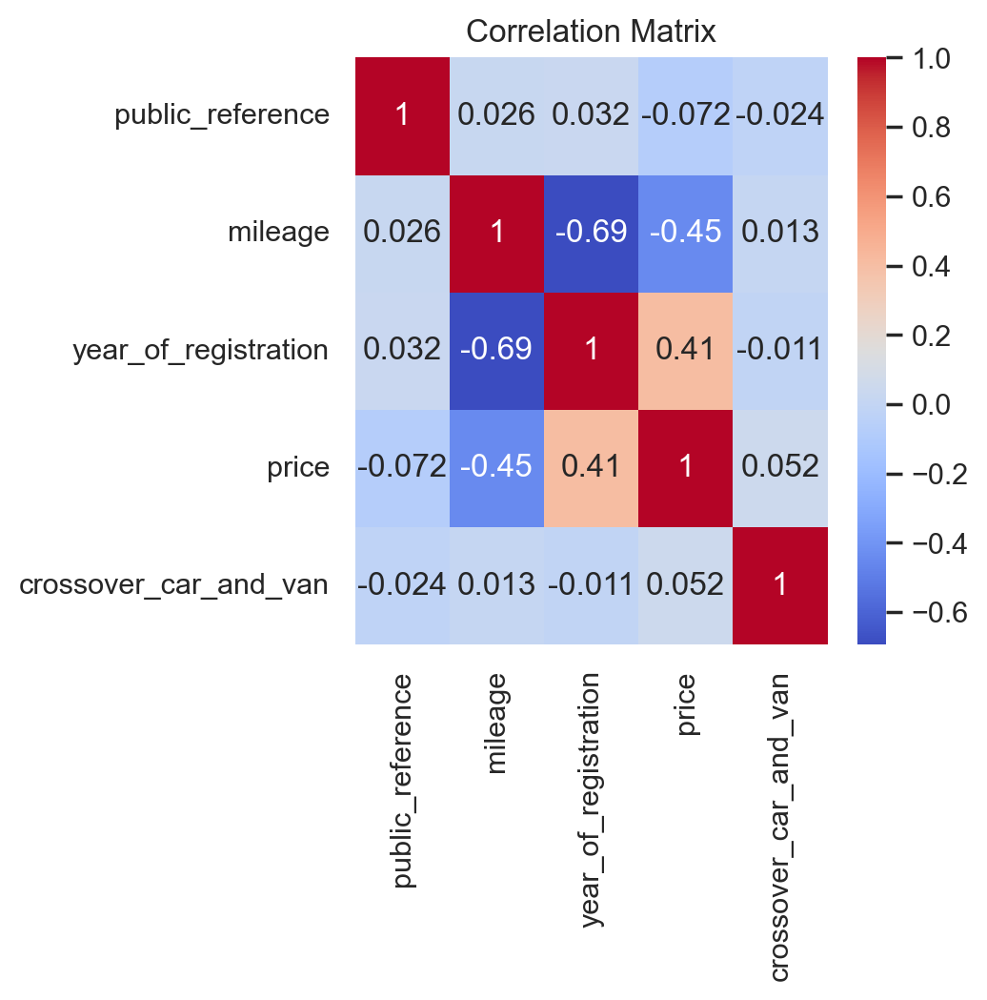

In [ ]:
plt.figure(figsize = (4,4))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')

In [225]:

#correlation between 'mileage' and 'price.'
correlation_mileage = df['mileage'].corr(df['price'])
#-0.39332570855218796

correlation_mileage
#A negative correlation would imply that as mileage increases, the price tends to decrease.

np.float64(-0.4478912239305573)

In [226]:

#correlation between ' year_of_registration' and 'price'
correlation_year_of_registration = df['year_of_registration'].corr(df['price'])
#0.3215146242839339

correlation_year_of_registration

np.float64(0.40588201433077753)

<Axes: xlabel='year_of_registration', ylabel='price'>

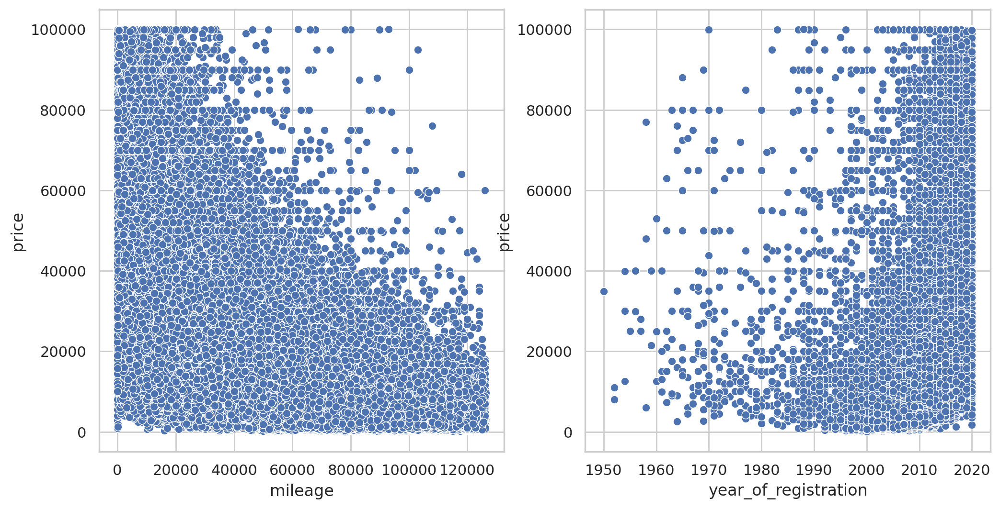

In [227]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x='mileage', y='price', data=df)

plt.subplot(1, 2, 2)
sns.scatterplot(x='year_of_registration', y='price', data=df)



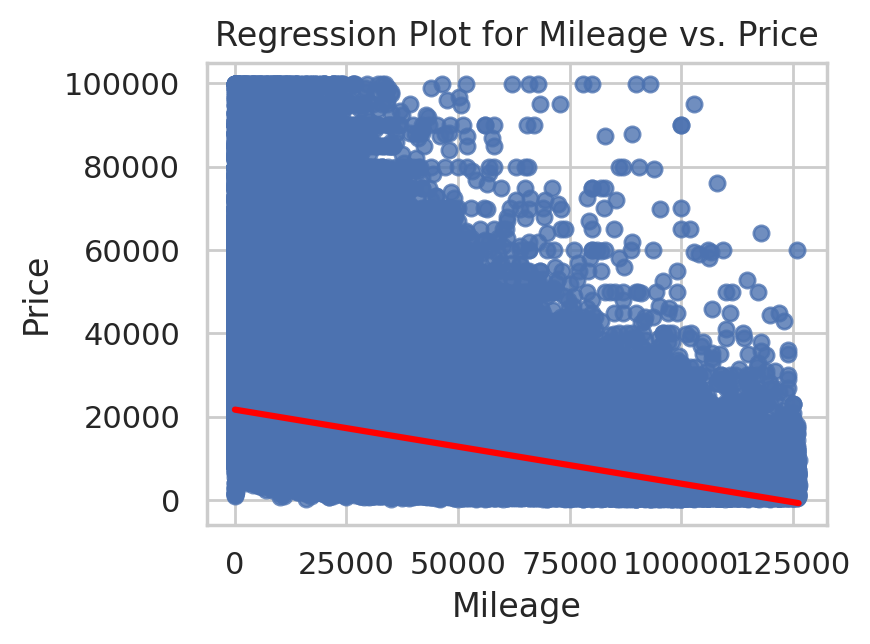

In [228]:

# Scatter plot with regression line for 'mileage' vs. 'price'
plt.figure(figsize=(4, 3))

# Scatter plot with regression line for 'mileage' vs. 'price'
sns.regplot(x='mileage', y='price', data=df,scatter_kws={'s': 30}, line_kws={'color': 'red'})


plt.title('Regression Plot for Mileage vs. Price')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.show()


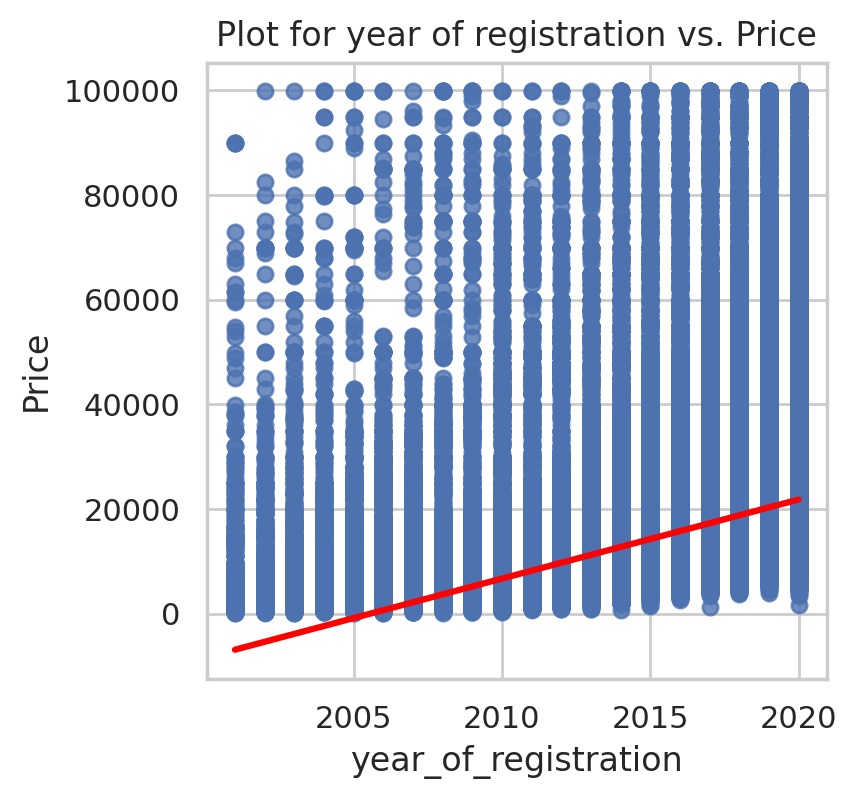

In [229]:

# Scatter plot with regression line for 'mileage' vs. 'price'
plt.figure(figsize=(4, 4))


# Scatter plot with regression line for 'mileage' vs. 'price'
filtered_df = df[df['year_of_registration'] > 2000]
sns.regplot(x='year_of_registration', y='price', data=filtered_df,scatter_kws={'s': 30},  line_kws={'color': 'red'})


plt.title('Plot for year of registration vs. Price')
plt.xlabel('year_of_registration')
plt.ylabel('Price')
plt.show()


In [ ]:
#categorical features

#examing the categorical features like standard_colour, standard_make, standard_model,body_type and fuel_type by visualising through box plots

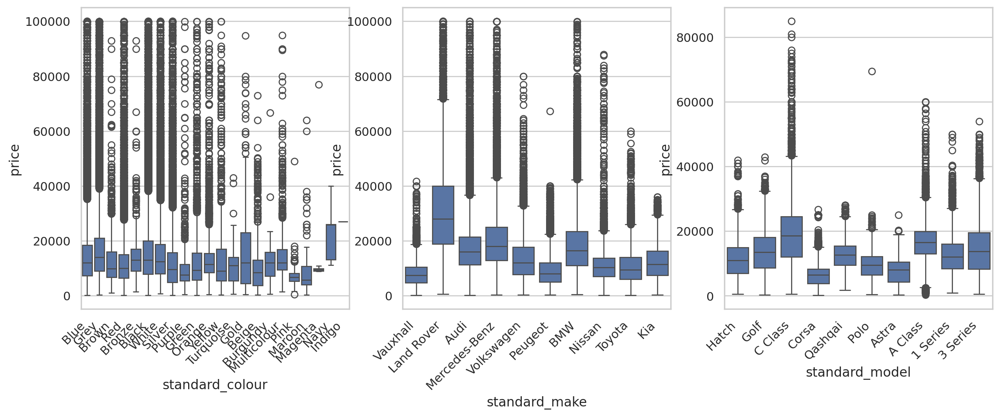

In [230]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x='standard_colour', y='price', data=df)
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 3, 2)
top_makers = df['standard_make'].value_counts().nlargest(10).index
df_top_makers = df[df['standard_make'].isin(top_makers)]
sns.boxplot(x='standard_make', y='price', data=df_top_makers)
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 3, 3)
top_models = df['standard_model'].value_counts().nlargest(10).index
df_top_models = df[df['standard_model'].isin(top_models)]
sns.boxplot(x='standard_model', y='price', data=df_top_models)
plt.xticks(rotation=45, ha='right')

plt.show()


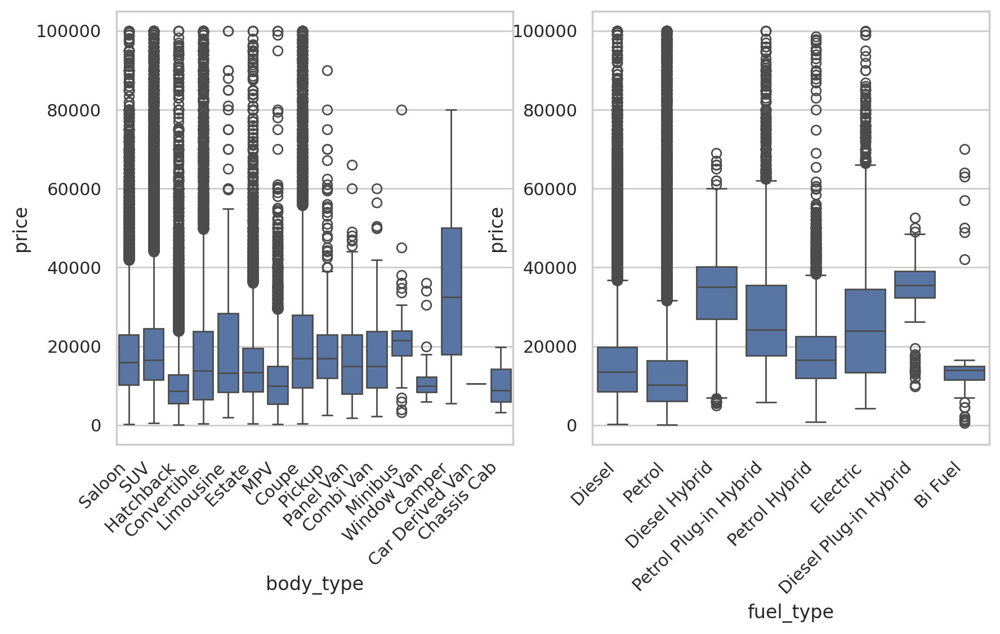

In [231]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.boxplot(x='body_type', y='price', data=df)
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 2, 2)
sns.boxplot(x='fuel_type', y='price', data=df)
plt.xticks(rotation=45, ha='right')

plt.show()


# feature engineering

In [232]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202007020778260,108230,61,Blue,Jaguar,XF,USED,2011,7000,Saloon,False,Diesel
1,202007020778474,7800,17,Grey,SKODA,Yeti,USED,2017,14000,SUV,False,Petrol
2,202007080986776,45000,16,Brown,Vauxhall,Mokka,USED,2016,7995,Hatchback,False,Diesel
3,202007161321269,64000,64,Grey,Land Rover,Range Rover Sport,USED,2015,26995,SUV,False,Diesel
4,202009304412074,16000,17,Blue,Audi,S5,USED,2017,29000,Convertible,False,Petrol


In [233]:
df['vehicle_condition'].value_counts()#all the new vehicles are removed while cleaning year column

,count
vehicle_condition,
USED,359660


In [ ]:
#creating new column which tells about age of a car by subtracting year_of_registration from current year.

In [234]:
#creating age_of_car column
from datetime import datetime
current_year = datetime.now().year
df['age_of_car'] = current_year - df['year_of_registration']


In [235]:
df['mileage_Per_Year'] = df['mileage'] / df['age_of_car']

In [236]:
df.sample()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,age_of_car,mileage_Per_Year
286579,202009284321371,7000,69,Yellow,Mercedes-Benz,A Class,USED,2019,37495,Hatchback,False,Petrol,6,1166.666667


In [237]:
df['price'].describe()

,price
count,359660.000000
mean,14824.774690
std,11980.515782
min,120.000000
25%,7299.000000
50%,11995.000000
75%,18500.000000
max,99999.000000


In [238]:
df.price.quantile(0.75)

np.float64(18500.0)

In [239]:
df.price.max()

99999

<Axes: xlabel='price'>

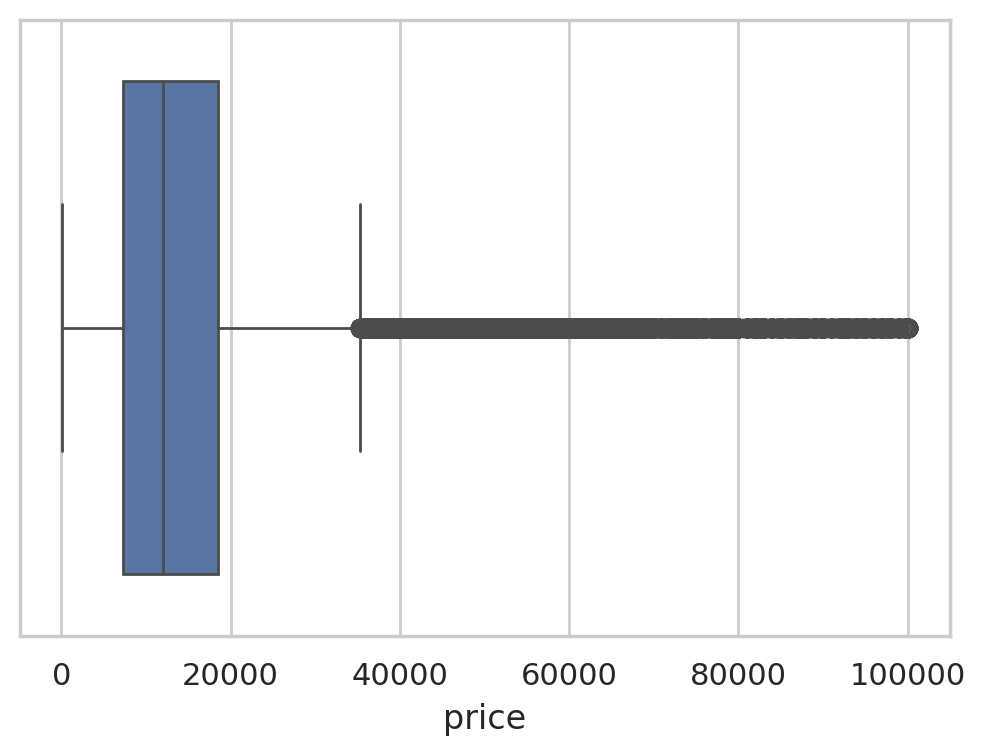

In [240]:
sns.boxplot(data = df , x = 'price')

In [ ]:
#inf in infinity values which is used  as boundary values

In [241]:
#creating price_category through binning
df['price_category'] = pd.cut(df["price"], bins=[120, 6999, 11495, 17495, np.inf], labels=["Low", "Medium", "High", "Very High"])

<Axes: xlabel='price_category', ylabel='price'>

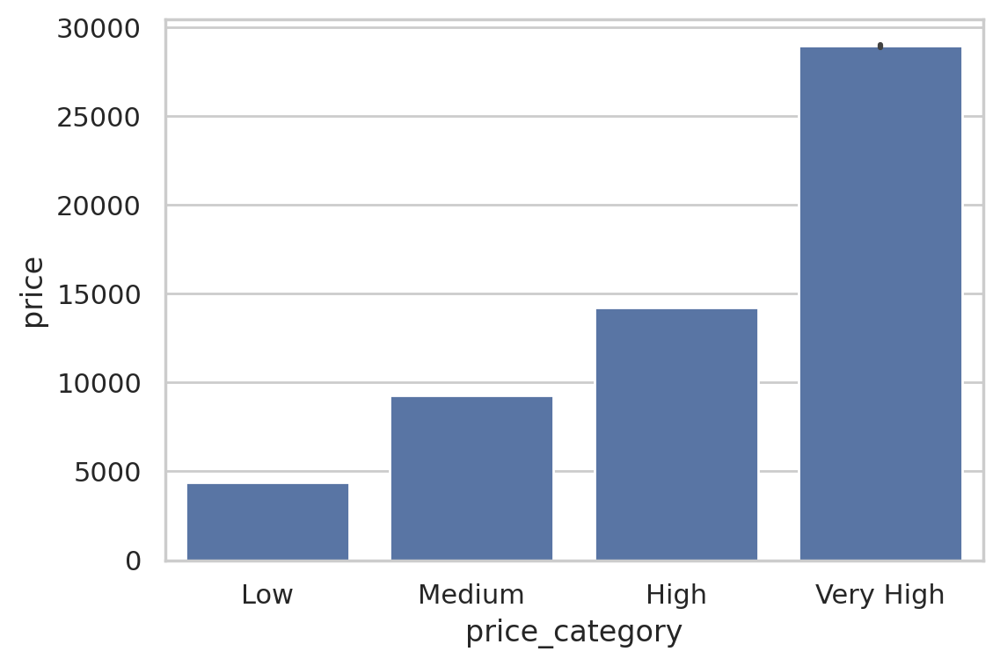

In [242]:
sns.barplot(data = df , x = 'price_category' , y = 'price')

In [243]:
df.sample(10)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,age_of_car,mileage_Per_Year,price_category
166827,202006180254328,11610,19,Blue,Audi,Q2,USED,2019,18720,SUV,False,Diesel,6,1935.000000,Very High
60925,202010305597894,24740,15,Silver,Mazda,CX-5,USED,2015,11500,SUV,False,Diesel,10,2474.000000,High
162521,202010245394502,60129,63,Red,Vauxhall,Astra,USED,2013,5500,Hatchback,False,Petrol,12,5010.750000,Low
304920,202010145001977,21576,67,Grey,Volkswagen,Golf,USED,2017,13575,Hatchback,False,Petrol,8,2697.000000,High
260124,202010144973832,24939,18,Black,Kia,Ceed,USED,2018,13850,Hatchback,False,Petrol,7,3562.714286,High
296301,202010155027253,57000,10,Black,MINI,Hatch,USED,2010,4395,Hatchback,False,Diesel,15,3800.000000,Low
93543,202010145010490,99000,13,White,Hyundai,ix35,USED,2013,5450,SUV,False,Diesel,12,8250.000000,Low
185843,202010165066237,7172,69,Black,MINI,Hatch,USED,2019,21000,Hatchback,False,Petrol,6,1195.333333,Very High
290235,202010134950710,49049,15,Silver,Mercedes-Benz,C Class,USED,2015,12990,Saloon,False,Diesel,10,4904.900000,High
70532,202010285523031,67,69,White,BMW,2 Series Gran Tourer,USED,2020,24995,MPV,False,Diesel,5,13.400000,Very High


In [244]:
luxury_brands = ['Mercedes-Benz', 'BMW', 'Audi', 'Rolls-Royce', 'Land Rover']
df['is_luxury'] = df['standard_make'].isin(luxury_brands).astype(int)

In [245]:
#I have added age_of_car, mileage_per_year, price_category and is_luxury column in a data frame

In [246]:
df['is_luxury'].value_counts()

,count
is_luxury,
0,251489
1,108171


In [ ]:
#df= df[['mileage' , 'colour' , 'maker' , 'year_of_registration' , 'body_type', 'fuel_type', 'age_of_car', 'price_category', 'price']]

In [ ]:
#df

In [247]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 16 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   public_reference       359660 non-null  int64   
 1   mileage                359660 non-null  int64   
 2   reg_code               359426 non-null  object  
 3   standard_colour        359660 non-null  object  
 4   standard_make          359660 non-null  object  
 5   standard_model         359660 non-null  object  
 6   vehicle_condition      359660 non-null  object  
 7   year_of_registration   359660 non-null  int64   
 8   price                  359660 non-null  int64   
 9   body_type              359660 non-null  object  
 10  crossover_car_and_van  359660 non-null  bool    
 11  fuel_type              359660 non-null  object  
 12  age_of_car             359660 non-null  int64   
 13  mileage_Per_Year       359660 non-null  float64 
 14  price_category      

In [248]:
df['mileage'] = df['mileage'].astype(int)
df['age_of_car'] = df['age_of_car'].astype(int)
df['year_of_registration'] = df['year_of_registration'].astype(int)


In [249]:
pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 2.9 MB/s eta 0:00:00


In [250]:
from category_encoders import TargetEncoder

cols = ['standard_colour', 'standard_make', 'body_type', 'fuel_type', 'price_category']
target = 'price'
te = TargetEncoder()
for col in cols:
    transformed_col = te.fit_transform(df[col].astype(str), df[target])
    df[col + '_encoded'] = transformed_col  # Creating new columns with encoded values

# Dropping original categorical columns
df.drop(columns=cols, inplace=True)

print(df.head())

   public_reference  mileage reg_code     standard_model vehicle_condition  \
0   202007020778260   108230       61                 XF              USED   
1   202007020778474     7800       17               Yeti              USED   
2   202007080986776    45000       16              Mokka              USED   
3   202007161321269    64000       64  Range Rover Sport              USED   
4   202009304412074    16000       17                 S5              USED   

   year_of_registration  price  crossover_car_and_van  age_of_car  \
0                  2011   7000                  False          14   
1                  2017  14000                  False           8   
2                  2016   7995                  False           9   
3                  2015  26995                  False          10   
4                  2017  29000                  False           8   

   mileage_Per_Year  is_luxury  standard_colour_encoded  \
0       7730.714286          0             14639.180409  

In [251]:
df.head()

,public_reference,mileage,reg_code,standard_model,vehicle_condition,year_of_registration,price,crossover_car_and_van,age_of_car,mileage_Per_Year,is_luxury,standard_colour_encoded,standard_make_encoded,body_type_encoded,fuel_type_encoded,price_category_encoded
0,202007020778260,108230,61,XF,USED,2011,7000,False,14,7730.714286,0,14639.180409,22703.781590,17805.474438,15706.832650,9262.611544
1,202007020778474,7800,17,Yeti,USED,2017,14000,False,8,975.000000,0,17008.843329,12519.724688,19855.550659,13301.285549,14233.407843
2,202007080986776,45000,16,Mokka,USED,2016,7995,False,9,5000.000000,0,12595.682799,7851.974067,9840.043912,15706.832650,9262.611544
3,202007161321269,64000,64,Range Rover Sport,USED,2015,26995,False,10,6400.000000,1,17008.843329,31402.883333,19855.550659,15706.832650,28944.004977
4,202009304412074,16000,17,S5,USED,2017,29000,False,8,2000.000000,1,14639.180409,18264.181047,18797.515553,13301.285549,28944.004977


In [252]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   public_reference         359660 non-null  int64  
 1   mileage                  359660 non-null  int64  
 2   reg_code                 359426 non-null  object 
 3   standard_model           359660 non-null  object 
 4   vehicle_condition        359660 non-null  object 
 5   year_of_registration     359660 non-null  int64  
 6   price                    359660 non-null  int64  
 7   crossover_car_and_van    359660 non-null  bool   
 8   age_of_car               359660 non-null  int64  
 9   mileage_Per_Year         359660 non-null  float64
 10  is_luxury                359660 non-null  int64  
 11  standard_colour_encoded  359660 non-null  float64
 12  standard_make_encoded    359660 non-null  float64
 13  body_type_encoded        359660 non-null  float64
 14  fuel

In [253]:
# Dictionary mapping original names to encoded names
name_mapping = {
    'standard_colour_encoded': 'standard_colour',
    'standard_make_encoded': 'standard_make',
    'body_type_encoded': 'body_type',
    'fuel_type_encoded': 'fuel_type',
    'price_category_encoded': 'price_category'
}

# Rename encoded columns to original names
df.rename(columns=name_mapping, inplace=True)

# Convert float columns to integers
encoded_cols = ['standard_colour', 'standard_make', 'body_type', 'fuel_type', 'price_category']
df[encoded_cols] = df[encoded_cols].astype(int)



In [254]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 16 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       359660 non-null  int64  
 1   mileage                359660 non-null  int64  
 2   reg_code               359426 non-null  object 
 3   standard_model         359660 non-null  object 
 4   vehicle_condition      359660 non-null  object 
 5   year_of_registration   359660 non-null  int64  
 6   price                  359660 non-null  int64  
 7   crossover_car_and_van  359660 non-null  bool   
 8   age_of_car             359660 non-null  int64  
 9   mileage_Per_Year       359660 non-null  float64
 10  is_luxury              359660 non-null  int64  
 11  standard_colour        359660 non-null  int64  
 12  standard_make          359660 non-null  int64  
 13  body_type              359660 non-null  int64  
 14  fuel_type              359660 non-nu

In [ ]:
#feature selection

In [256]:

df= df[['mileage','age_of_car','is_luxury','standard_make','body_type','fuel_type','price_category','price']]


In [257]:
df.head()

,mileage,age_of_car,is_luxury,standard_make,body_type,fuel_type,price_category,price
0,108230,14,0,22703,17805,15706,9262,7000
1,7800,8,0,12519,19855,13301,14233,14000
2,45000,9,0,7851,9840,15706,9262,7995
3,64000,10,1,31402,19855,15706,28944,26995
4,16000,8,1,18264,18797,13301,28944,29000


In [258]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359660 entries, 0 to 359659
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype
---  ------          --------------   -----
 0   mileage         359660 non-null  int64
 1   age_of_car      359660 non-null  int64
 2   is_luxury       359660 non-null  int64
 3   standard_make   359660 non-null  int64
 4   body_type       359660 non-null  int64
 5   fuel_type       359660 non-null  int64
 6   price_category  359660 non-null  int64
 7   price           359660 non-null  int64
dtypes: int64(8)
memory usage: 22.0 MB


In [259]:
df['price'].describe()

,price
count,359660.000000
mean,14824.774690
std,11980.515782
min,120.000000
25%,7299.000000
50%,11995.000000
75%,18500.000000
max,99999.000000


In [260]:

#The X/y Spilt
X = df.drop(columns = 'price')
y = df['price']


In [261]:

#The Train/Test Spilt
X_train, X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 2)


In [262]:
X_train.shape , X_test.shape

((287728, 7), (71932, 7))

In [263]:
X_train

,mileage,age_of_car,is_luxury,standard_make,body_type,fuel_type,price_category
14368,52000,10,0,13333,18797,15706,14233
330018,66078,14,0,10906,9840,13301,4385
32781,22025,7,1,18264,17805,13301,28944
312450,6912,6,0,13333,9840,13301,14233
171670,15000,9,0,10906,19855,15706,14233
...,...,...,...,...,...,...,...
84434,5,5,0,13333,9840,13301,14233
95816,11325,8,0,10875,9840,13301,9262
203245,30000,9,1,18760,17805,13301,28944
100879,30484,9,0,7851,9840,13301,9262


In [ ]:
#scaler = MinMaxScaler()

#X_train = scaler.fit_transform(X_train)
#X_test = scaler.transform(X_test)

In [264]:
X_train

,mileage,age_of_car,is_luxury,standard_make,body_type,fuel_type,price_category
14368,52000,10,0,13333,18797,15706,14233
330018,66078,14,0,10906,9840,13301,4385
32781,22025,7,1,18264,17805,13301,28944
312450,6912,6,0,13333,9840,13301,14233
171670,15000,9,0,10906,19855,15706,14233
...,...,...,...,...,...,...,...
84434,5,5,0,13333,9840,13301,14233
95816,11325,8,0,10875,9840,13301,9262
203245,30000,9,1,18760,17805,13301,28944
100879,30484,9,0,7851,9840,13301,9262


In [265]:
'''scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_new = scaler.transform(X_train)
X_test_new = scaler.transform(X_test)'''

'scaler = MinMaxScaler()\nscaler.fit(X_train)\nX_train_new = scaler.transform(X_train)\nX_test_new = scaler.transform(X_test)'

In [266]:
df.sample(10)

,mileage,age_of_car,is_luxury,standard_make,body_type,fuel_type,price_category,price
76825,8777,6,0,8997,19855,13301,14233,15299
228882,23903,8,0,7821,9840,13301,9262,8700
352986,4317,5,0,20659,15310,15706,28944,29995
177214,14737,6,0,13333,17805,13301,28944,19390
295841,8464,6,0,13333,9840,15706,14233,13495
347982,12423,8,0,10875,9840,13301,9262,7103
234298,24726,8,0,7851,9840,13301,9262,7129
279883,14427,6,0,7851,19855,13301,14233,14590
230980,26504,8,0,13333,13065,15706,28944,35995
13674,29081,9,0,10875,15310,15706,9262,10425


# Decision tree

In [267]:
# Defining numerical columns
numeric_cols = X.select_dtypes(include='number').columns


# Defining the column transformer for numerical columns only
numeric_transformer = Pipeline(steps= [
                         ("scaler",MinMaxScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols)
    ])

preprocessor.fit_transform(X_train)
preprocessor.fit_transform(X_test)

array([[0.46729527, 0.04615385, 0.        , ..., 0.215575  , 0.11408918,
        0.198583  ],
       [0.38729495, 0.07692308, 0.        , ..., 0.313904  , 0.11408918,
        0.40099353],
       [0.04316296, 0.01538462, 0.        , ..., 0.        , 0.        ,
        0.40099353],
       ...,
       [0.13142061, 0.04615385, 1.        , ..., 0.39469536, 0.11408918,
        1.        ],
       [0.35085344, 0.06153846, 0.        , ..., 0.39469536, 0.        ,
        0.198583  ],
       [0.38271898, 0.04615385, 1.        , ..., 0.313904  , 0.11408918,
        0.40099353]])

In [268]:

#decision tree regressor
dtr = DecisionTreeRegressor(max_depth=5,min_samples_split=6)
dtr.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, min_samples_split=6)

In [269]:
mean_absolute_error(y_test, dtr.predict(X_test))

2694.8444203504414

In [270]:
dtr.score(X_test, y_test)

0.8010302323619412

In [271]:
y_pred_dummy = y_train.mean()

In [272]:
y_pred_dummy

np.float64(14819.797364177279)

In [273]:


# Create a pipeline with for Decision Tree Regressor
pipeline = Pipeline(steps = [
    ('regressor', DecisionTreeRegressor())
])
# Define parameters for GridSearchCV
param_grid = {
    'regressor__max_depth': [None, 5, 10,15,20],
    'regressor__min_samples_split': [2, 5, 10,12]
}
# Perform GridSearchCV with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=KFold(n_splits=5), scoring='neg_mean_absolute_error')

# Fit the GridSearchCV to find the best model
grid_search.fit(X_train, y_train)

# Get the best model
best_model_dt = grid_search.best_estimator_

# Print the best parameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)

# Predict on the whole dataset using the best model

y_pred_train = best_model_dt.predict(X_train)

y_pred_test = best_model_dt.predict(X_test)


# Evaluate the model performance


train_mae = mean_absolute_error(y_train, y_pred_train)

test_mae = mean_absolute_error(y_test , y_pred_test)

print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")

# Cross-validated score
cv_scores = cross_val_score(best_model_dt, X_test, y_test, scoring='neg_mean_absolute_error')
cv_mean_mae = -1 * cv_scores.mean()
cv_std_mae = cv_scores.std()

print(f"Cross-Validated MAE: {cv_mean_mae} +/- {cv_std_mae}")


Best Parameters: {'regressor__max_depth': 15, 'regressor__min_samples_split': 12}
Train MAE: 1862.00622240536
Test MAE: 2128.0147739469776
Cross-Validated MAE: 2326.418632975227 +/- 21.25495890720987


Best Parameters: {'regressor__max_depth': 15, 'regressor__min_samples_split': 12}

Train MAE: 1862.00622240536

Test MAE: 2126.9807662713933
Cross-Validated MAE: 2116.9039330470655 +/- 16.35457955636596

In [274]:
grid_search.cv_results_

{'mean_fit_time': array([1.45903487, 1.45939651, 1.35427194, 1.26744571, 0.40699606,
        0.40548143, 0.46330166, 0.6045198 , 0.70487475, 0.68961496,
        0.74241872, 0.90423546, 1.0093822 , 1.07758489, 1.05901289,
        0.91084085, 1.41690183, 1.14808269, 1.43781004, 1.31516542]),
 'std_fit_time': array([0.10845906, 0.23544399, 0.24953962, 0.21448812, 0.01170984,
        0.01115672, 0.07893167, 0.00812218, 0.03106849, 0.00920188,
        0.09790682, 0.12744163, 0.1002407 , 0.16172708, 0.15057779,
        0.00478733, 0.23468575, 0.02276063, 0.284579  , 0.22421763]),
 'mean_score_time': array([0.05815353, 0.04728508, 0.03258357, 0.0287909 , 0.00789266,
        0.00764318, 0.00929971, 0.01011367, 0.01082439, 0.01108303,
        0.01122241, 0.01198068, 0.01860309, 0.01865182, 0.0178998 ,
        0.01639977, 0.03452005, 0.02906504, 0.03205552, 0.02654252]),
 'std_score_time': array([0.00278297, 0.00367064, 0.00337814, 0.00271343, 0.00040623,
        0.00037894, 0.00148805, 0.000632

In [275]:
df1= pd.DataFrame(grid_search.cv_results_)
df1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_regressor__max_depth,param_regressor__min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.459035,0.108459,0.058154,0.002783,None,2,"{'regressor__max_depth': None, 'regressor__min...",-2599.215360,-2589.231840,-2574.668520,-2581.832935,-2592.073659,-2587.404463,8.460309,16
1,1.459397,0.235444,0.047285,0.003671,None,5,"{'regressor__max_depth': None, 'regressor__min...",-2484.716720,-2474.742475,-2461.024936,-2464.723976,-2466.259866,-2470.293595,8.497279,15
2,1.354272,0.249540,0.032584,0.003378,None,10,"{'regressor__max_depth': None, 'regressor__min...",-2356.787046,-2351.608077,-2344.761095,-2331.679468,-2339.843932,-2344.935924,8.793853,14
3,1.267446,0.214488,0.028791,0.002713,None,12,"{'regressor__max_depth': None, 'regressor__min...",-2326.008454,-2322.746916,-2320.827556,-2297.862338,-2307.850865,-2315.059226,10.582563,12
4,0.406996,0.011710,0.007893,0.000406,5,2,"{'regressor__max_depth': 5, 'regressor__min_sa...",-2689.462741,-2697.480060,-2685.564975,-2697.443614,-2684.079538,-2690.806186,5.711724,17
5,0.405481,0.011157,0.007643,0.000379,5,5,"{'regressor__max_depth': 5, 'regressor__min_sa...",-2689.462741,-2697.480060,-2685.564975,-2697.443614,-2684.079538,-2690.806186,5.711724,17
6,0.463302,0.078932,0.009300,0.001488,5,10,"{'regressor__max_depth': 5, 'regressor__min_sa...",-2689.462741,-2697.480060,-2685.564975,-2697.443614,-2684.079538,-2690.806186,5.711724,17
7,0.604520,0.008122,0.010114,0.000633,5,12,"{'regressor__max_depth': 5, 'regressor__min_sa...",-2689.462741,-2697.480060,-2685.564975,-2697.443614,-2684.079538,-2690.806186,5.711724,17
8,0.704875,0.031068,0.010824,0.000437,10,2,"{'regressor__max_depth': 10, 'regressor__min_s...",-2249.070946,-2245.952899,-2238.171228,-2244.024060,-2245.867097,-2244.617246,3.607896,10
9,0.689615,0.009202,0.011083,0.000701,10,5,"{'regressor__max_depth': 10, 'regressor__min_s...",-2250.100386,-2245.228597,-2237.144709,-2244.930516,-2244.568244,-2244.394490,4.150417,9


In [276]:
df1[['param_regressor__max_depth','param_regressor__min_samples_split','mean_test_score','rank_test_score']]

,param_regressor__max_depth,param_regressor__min_samples_split,mean_test_score,rank_test_score
0,None,2,-2587.404463,16
1,None,5,-2470.293595,15
2,None,10,-2344.935924,14
3,None,12,-2315.059226,12
4,5,2,-2690.806186,17
5,5,5,-2690.806186,17
6,5,10,-2690.806186,17
7,5,12,-2690.806186,17
8,10,2,-2244.617246,10
9,10,5,-2244.394490,9


In [277]:
grid_search.best_score_

np.float64(-2133.173983555328)

[0.08610159 0.03174467 0.0026343  0.12186121 0.02794298 0.0294763
 0.70023896]


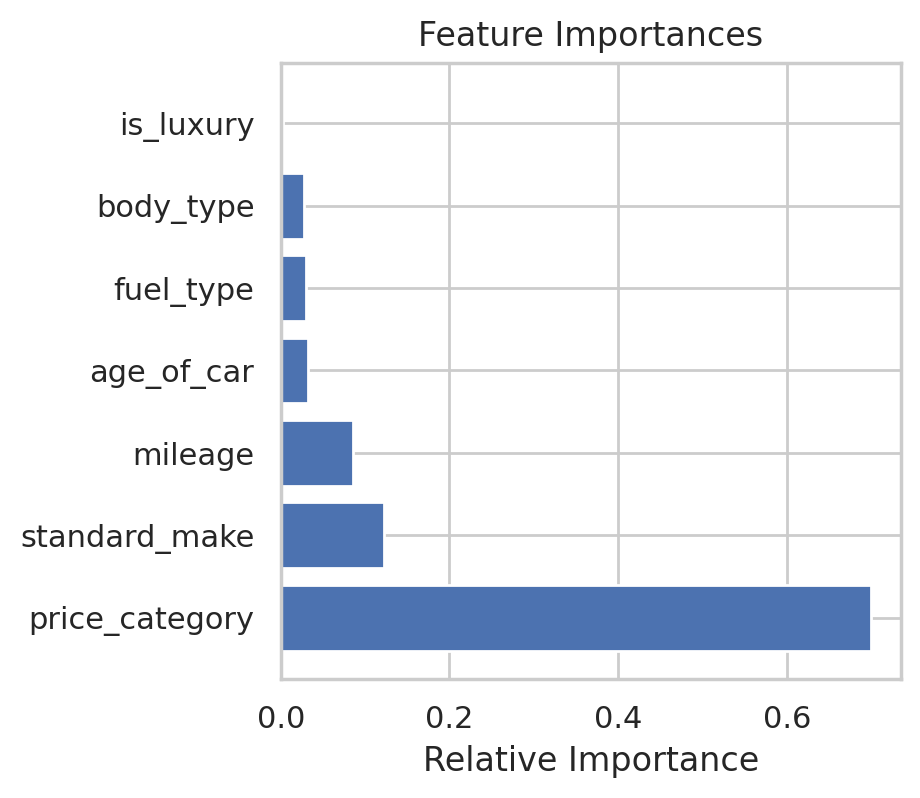

In [278]:
#Feature Importance
#Decision Trees offer feature importance directly.


# 'best_model_dt' is Decision Tree Regressor pipeline
importances_dt = best_model_dt.named_steps['regressor'].feature_importances_

# Visualize feature importances or discuss their significance
print(importances_dt)

# Sort indices by importance in descending order
indices = importances_dt.argsort()[::-1]

# Rearrange feature names based on importance ranking
feature_names = X.columns[indices]

# Plotting
plt.figure(figsize=(4, 4))
plt.title("Feature Importances")

plt.barh(range(X.shape[1]), importances_dt[indices], align='center')

plt.yticks(range(X.shape[1]), feature_names)
plt.xlabel('Relative Importance')
plt.show()

The higher the value, the more important that particular feature is in the model's decision-making process. In this case, it seems that standard_make has the highest importance (0.44985266), while is_luxury feature has the lowest importance (0.00429523).

In [279]:
#Instance-Level Errors Analysis
#You can identify instances with high errors or mispredictions.
# Assuming 'pipeline_dt' is your Decision Tree Regressor pipeline
#residuals_dt = y_test - best_model_dt
# Visualize residuals or analyze patterns in errors


In [280]:
best_model_dt.score(X_test, y_test)

0.8497476514705392

In [ ]:
#residuals:

In [281]:

actual_value = y_test.iloc[6]
actual_value

np.int64(5600)

In [282]:
predicted_value = best_model_dt.predict(X_test.iloc[[6]])
predicted_value

array([5553.06557377])

In [283]:
predicted_value - actual_value

array([-46.93442623])

In [284]:
df['price'].describe()

,price
count,359660.000000
mean,14824.774690
std,11980.515782
min,120.000000
25%,7299.000000
50%,11995.000000
75%,18500.000000
max,99999.000000


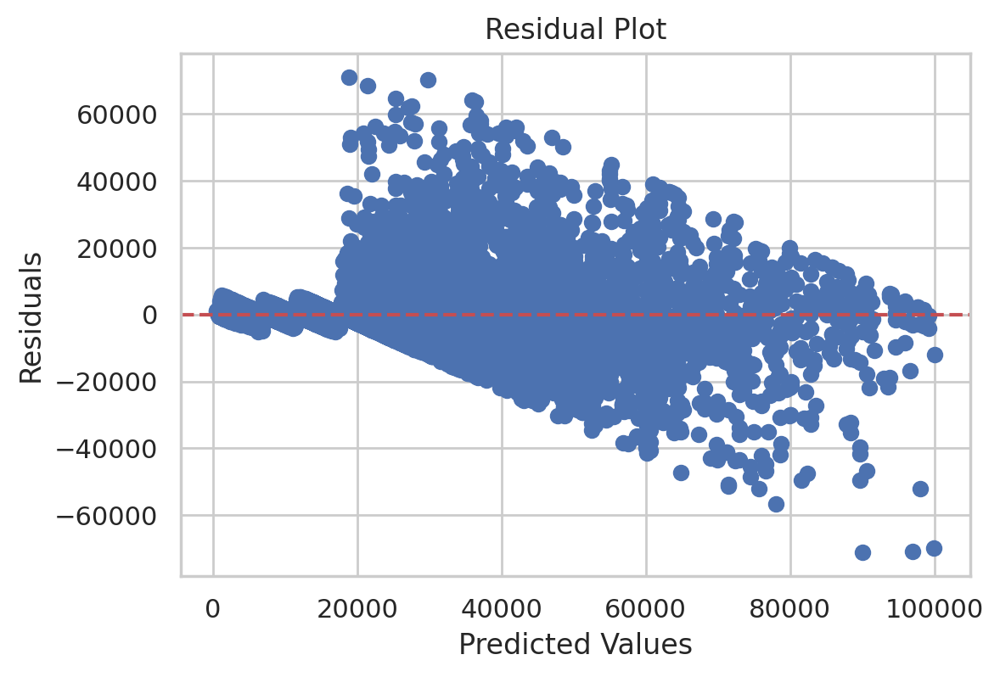

In [285]:
residuals = y_test - y_pred_test
plt.scatter(y_pred_test, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()


In [ ]:
#Actual vs Predicted

In [286]:
from sklearn.metrics import PredictionErrorDisplay

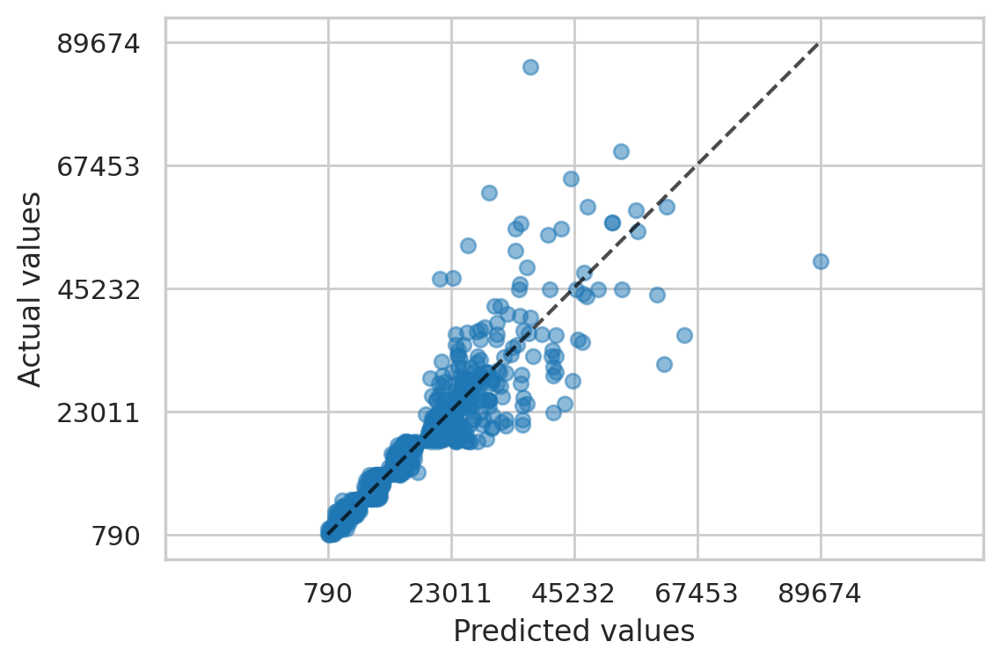

In [287]:
PredictionErrorDisplay.from_estimator(
    best_model_dt, X_test, y_test, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
);

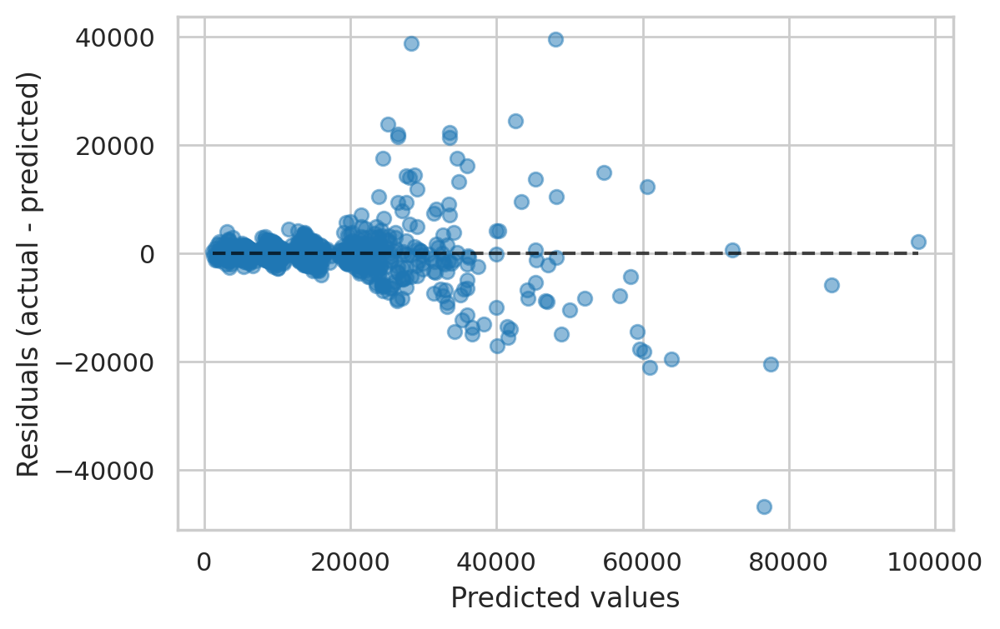

In [288]:
PredictionErrorDisplay.from_estimator(
    best_model_dt, X_test, y_test, kind="residual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
);

In [289]:
residuals = best_model_dt.predict(X_test) - y_test


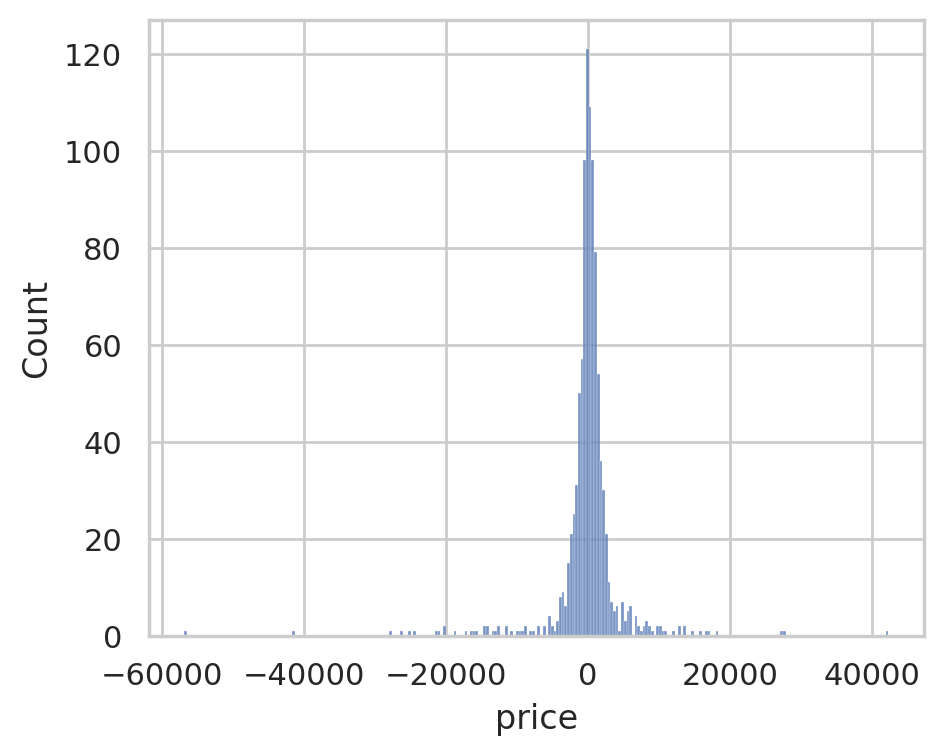

In [290]:
plt.figure(figsize= (5,4))

#residual plot for sample of 1000 points
sns.histplot(residuals.sample(1000));

In [291]:
dtr = DecisionTreeRegressor(max_depth=15,min_samples_split=12)

In [292]:
dtr.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=15, min_samples_split=12)

In [293]:
mean_absolute_error(y_test, dtr.predict(X_test))

2127.1997196556385

In [294]:
dtr.score(X_test, y_test)

0.8501084002815705

In [295]:
y_pred_dummy = y_train.mean()

In [296]:
y_pred_dummy

np.float64(14819.797364177279)

In [297]:
np.mean(np.abs((y_test - y_pred_dummy)))

np.float64(8167.729303513059)

# Knn regressor

In [298]:

#knn regressor
knnr = KNeighborsRegressor(n_neighbors = 4)
knnr.fit(preprocessor.fit_transform(X_train),y_train)

KNeighborsRegressor(n_neighbors=4)

In [299]:
mean_absolute_error(y_test, knnr.predict(preprocessor.fit_transform(X_test)))

2234.482970027248

In [300]:
knnr.score(preprocessor.fit_transform(X_test), y_test)

0.8419384843701924

In [301]:


# Create a pipeline for KNeighborsRegressor
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', KNeighborsRegressor())
])

# Define parameters for GridSearchCV
param_grid = {
    'regressor__n_neighbors': [ 5, 7, 9,11]
}

# Perform GridSearchCV with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=KFold(n_splits=5), scoring='neg_mean_absolute_error')

# Fit the GridSearchCV to find the best model
grid_search.fit(X_train, y_train)


# Get the best model
best_model_knn = grid_search.best_estimator_

# Print the best parameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)

# Make predictions on the whole dataset using the best model

y_pred_train = best_model_knn.predict(X_train)

y_pred_test = best_model_knn.predict(X_test)


# Evaluate the model performance

train_mae = mean_absolute_error(y_train, y_pred_train)

test_mae = mean_absolute_error(y_test , y_pred_test)

print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")


# Cross-validated score
cv_scores = cross_val_score(best_model_knn, X_test, y_test, scoring='neg_mean_absolute_error')
cv_mean_mae = -1 * cv_scores.mean()
cv_std_mae = cv_scores.std()

print(f"Cross-Validated MAE: {cv_mean_mae} +/- {cv_std_mae}")


Best Parameters: {'regressor__n_neighbors': 11}
Train MAE: 1949.4856079352726
Test MAE: 2149.1145223013655
Cross-Validated MAE: 2282.1331031366717 +/- 10.21331964046


In [302]:
#KNN Regressor Pipeline

In [303]:
'''Feature Importance
KNN doesn’t inherently provide feature importance. we can't get direct feature importance values like decision trees.

Instance-Level Errors Analysis
Similar to other regression models, we can analyze residuals or examine instances with high prediction errors.'''

"Feature Importance\nKNN doesn’t inherently provide feature importance. we can't get direct feature importance values like decision trees.\n\nInstance-Level Errors Analysis\nSimilar to other regression models, we can analyze residuals or examine instances with high prediction errors."

In [304]:
best_model_knn.score(X_test, y_test)

0.8571833570273248

In [305]:
#residuals:

actual = y_test.iloc[6]
actual

np.int64(5600)

In [306]:
predicted = best_model_knn.predict(X_test.iloc[[6]])
predicted

array([5404.72727273])

In [307]:
predicted - actual

array([-195.27272727])

In [ ]:
#Actual vs Predicted


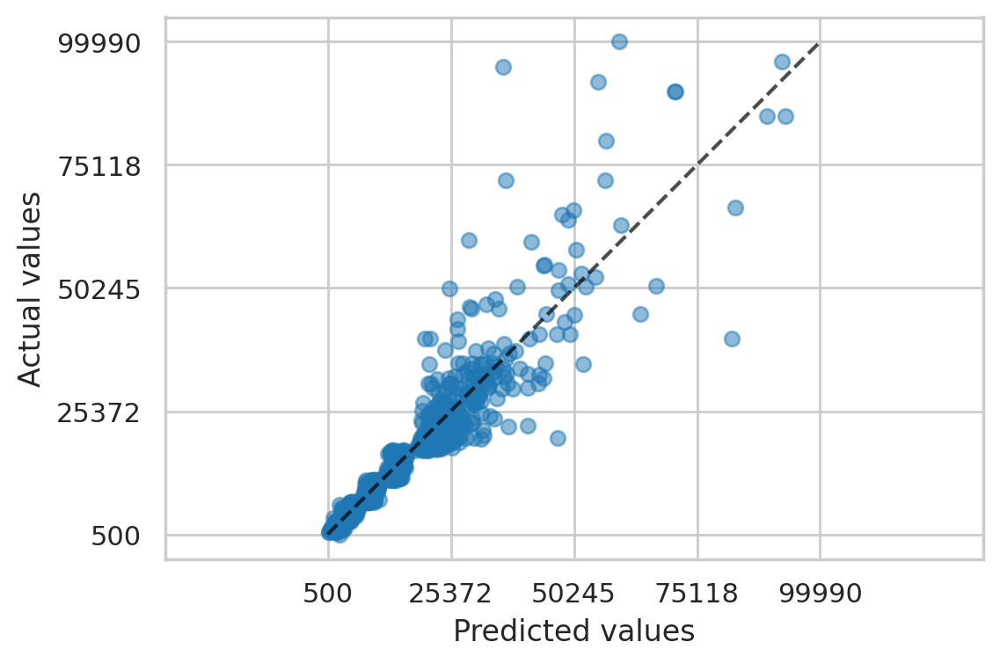

In [308]:
PredictionErrorDisplay.from_estimator(
    best_model_knn, X_test, y_test, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
);

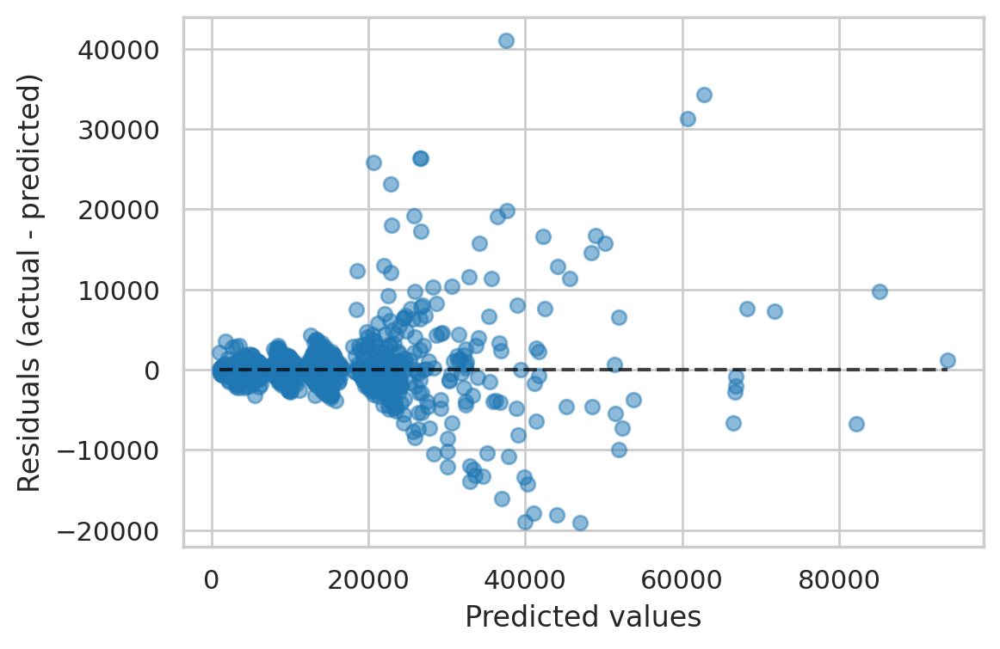

In [309]:
PredictionErrorDisplay.from_estimator(
    best_model_knn, X_test, y_test, kind="residual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
);

In [310]:
residuals = best_model_knn.predict(X_test) - y_test

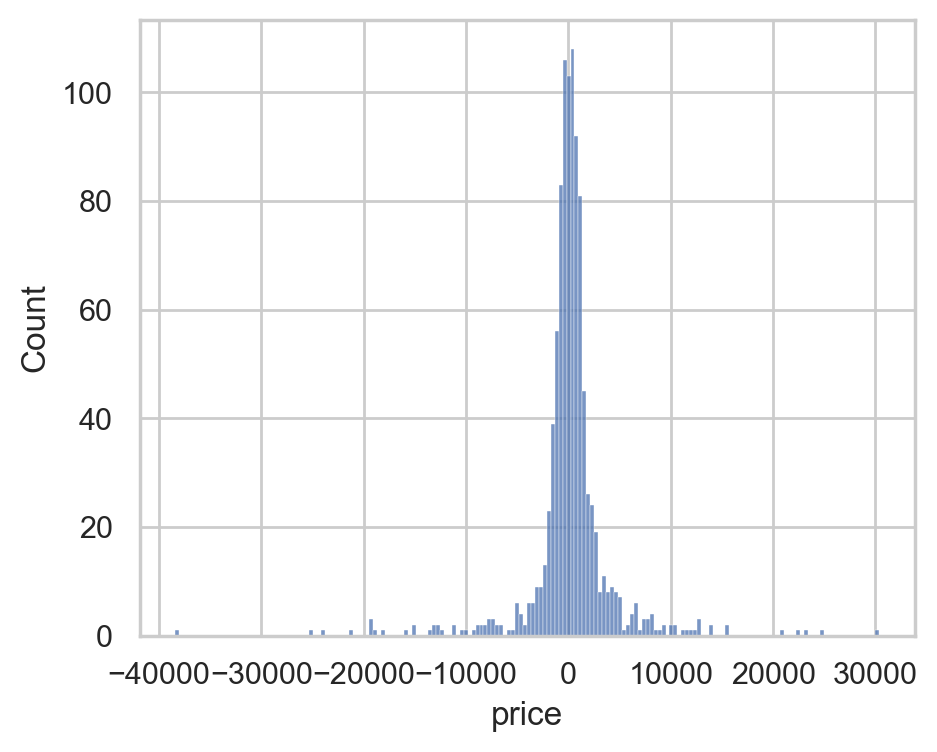

In [ ]:
plt.figure(figsize = (5,4))

#residual plot
sns.histplot(residuals.sample(1000));


In [311]:
## Model Fitting without scaled data

knnr = KNeighborsRegressor(n_neighbors=11)

knnr.fit(X_train, y_train)


KNeighborsRegressor(n_neighbors=11)

In [312]:
## Model Evaluation

### Aggregate Score/Loss

# score: the higher, the better; loss: the lower, the better

# interpretation of the score: amount of variance of the target explained by the model
knnr.score(X_train, y_train), knnr.score(X_test, y_test)

(0.861707540804716, 0.8379752661622569)

In [313]:

mean_absolute_error(y_train, knnr.predict(X_train))



2177.6029403401194

In [314]:
mean_absolute_error(y_test, knnr.predict(X_test))


2396.066792880144

# Linear regression

In [316]:

#linear Regression
lr = LinearRegression(fit_intercept=True)
lr.fit(X_train,y_train)

LinearRegression()

In [317]:
mean_absolute_error(y_test, lr.predict(X_test))

3372.650611116923

In [318]:
lr.score(X_test, y_test)

0.7337952210352817

In [319]:


# Create a pipeline for Linear Regression
pipeline_lr = Pipeline([
    ('regressor', LinearRegression())
])

# Define parameters for GridSearchCV
param_grid = {
    'regressor__fit_intercept': [True, False]
}
# Perform GridSearchCV with cross-validation
grid_search = GridSearchCV(pipeline_lr, param_grid, cv=KFold(n_splits=5), scoring='neg_mean_absolute_error')

# Fit the GridSearchCV to find the best model
grid_search.fit(X_train, y_train)

# Get the best model
best_linear_reg = grid_search.best_estimator_

# Print the best parameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)

# Predict on the dataset using the model

y_pred_train = best_linear_reg.predict(X_train)

y_pred_test = best_linear_reg.predict(X_test)


# Evaluate the model performance

train_mae = mean_absolute_error(y_train , y_pred_train)

test_mae = mean_absolute_error(y_test, y_pred_test)

print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")


#cross validated score
cv_scores = cross_val_score(pipeline_lr, X_test, y_test, scoring='neg_mean_absolute_error')
cv_mean_mae = -1 * cv_scores.mean()
cv_std_mae = cv_scores.std()

print(f"Cross-Validated MAE: {cv_mean_mae} +/- {cv_std_mae}")


Best Parameters: {'regressor__fit_intercept': True}
Train MAE: 3369.2371939084073
Test MAE: 3372.650611116923
Cross-Validated MAE: 3391.2071050943005 +/- 16.94980819915197


Best Parameters: {'regressor__fit_intercept': True}
Train MAE: 3369.237193908575
Test MAE: 3372.650611117086
Cross-Validated MAE: 3373.246280365141 +/- 22.48282719476559

In [320]:
#both with scaled and without scaled results are same

In [321]:
#Feature Importance
#Linear Regression doesn't inherently provide feature importance. It weighs coefficients against features. we can analyze coefficients directly.
#python


coefficients = best_linear_reg.named_steps['regressor'].coef_

print(coefficients)
# Visualize coefficients or discuss their significance


[-6.78079399e-02 -2.15229646e+02 -1.97001231e+03  6.61071695e-01
  1.76256095e-01  2.08166201e-01  5.81465442e-01]


For Linear Regression, the coefficients indicate the weightage of each feature in predicting the target variable. To interpret these coefficients:

Magnitude: The absolute value of the coefficients reflects their importance. Larger magnitudes signify a stronger impact on the target.

Sign: The sign (+ or -) indicates the direction of the relationship between the feature and the target. Positive coefficients mean an increase in the feature value leads to an increase in the target, while negative coefficients indicate the opposite.

For visualization, i can plot these coefficients to better understand their significance:

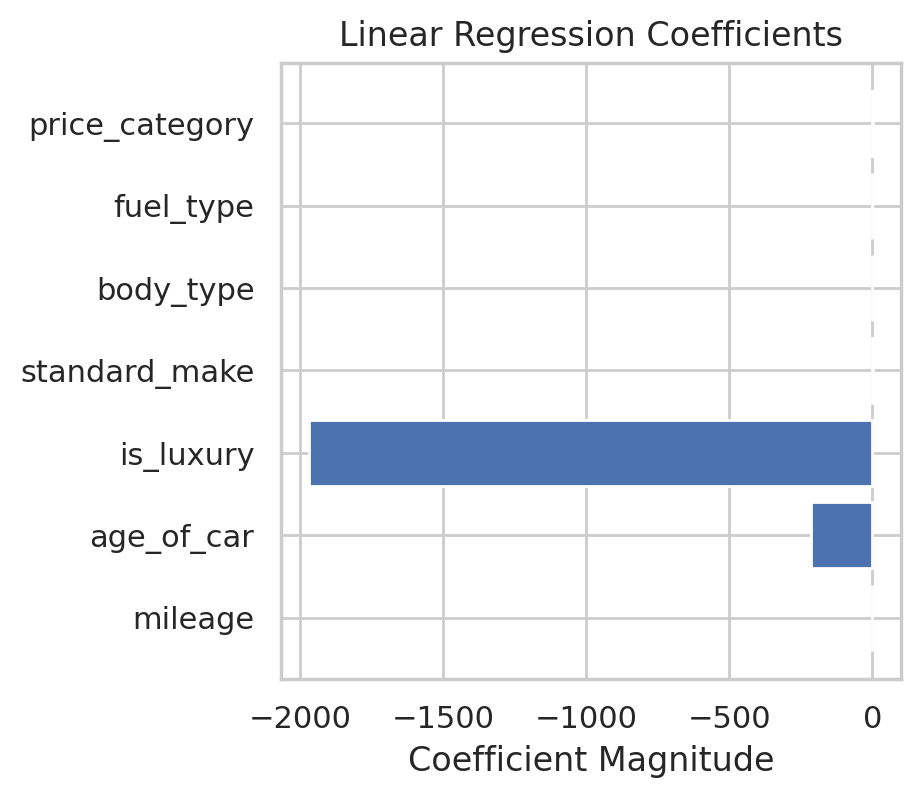

In [322]:

# Get feature names
feature_names = X.columns

# Plotting
plt.figure(figsize=(4, 4))

plt.barh(feature_names, coefficients)

plt.xlabel('Coefficient Magnitude')
plt.title('Linear Regression Coefficients')
plt.show()


In [323]:
best_linear_reg.score(X_test, y_test)

0.7337952210352817

In [324]:
#Instance-Level Errors Analysis
#residuals:

y_test.iloc[5]

np.int64(24000)

In [325]:
best_linear_reg.predict(X_test.iloc[[5]])

array([24635.14477137])

In [326]:
#Actual vs Predicted

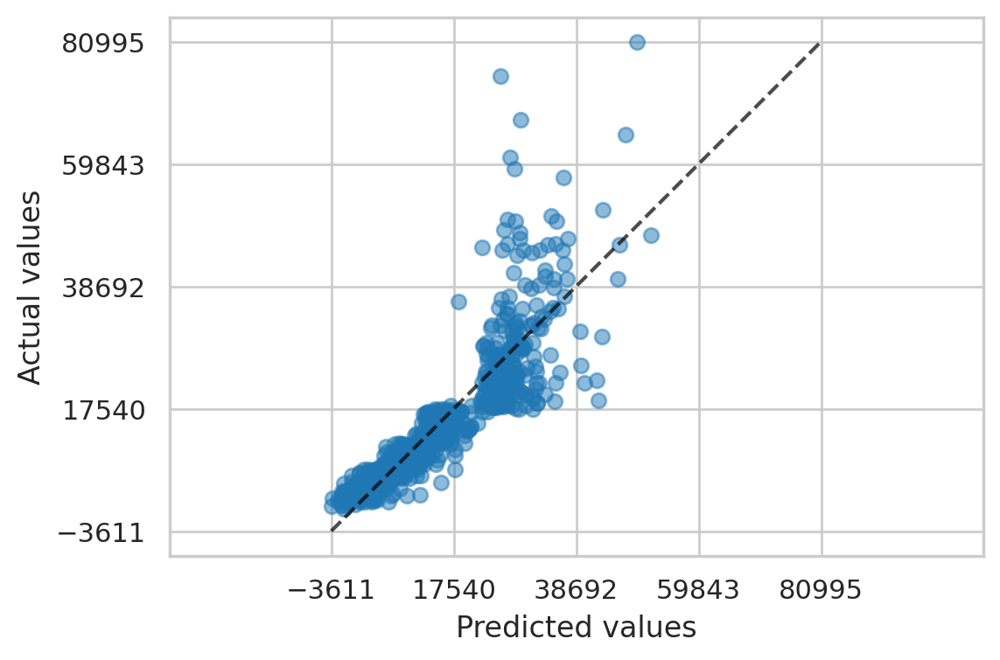

In [327]:
PredictionErrorDisplay.from_estimator(
    best_linear_reg, X_test, y_test, kind="actual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
);


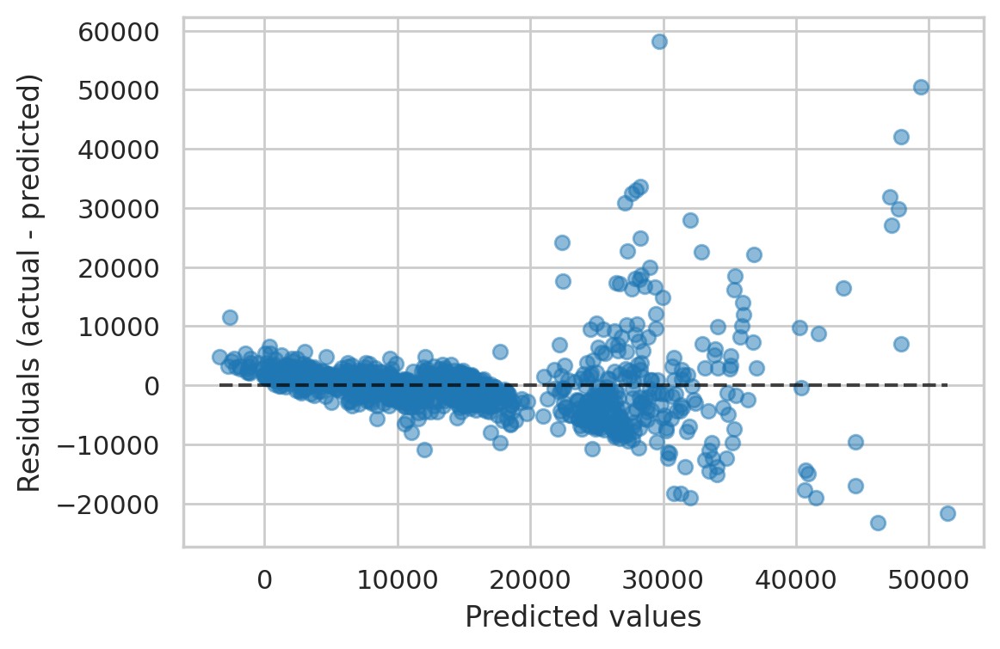

In [328]:
PredictionErrorDisplay.from_estimator(
    best_linear_reg, X_test, y_test, kind="residual_vs_predicted", scatter_kwargs=dict(alpha=0.5)
);

In [329]:
residuals = best_linear_reg.predict(X_test) - y_test

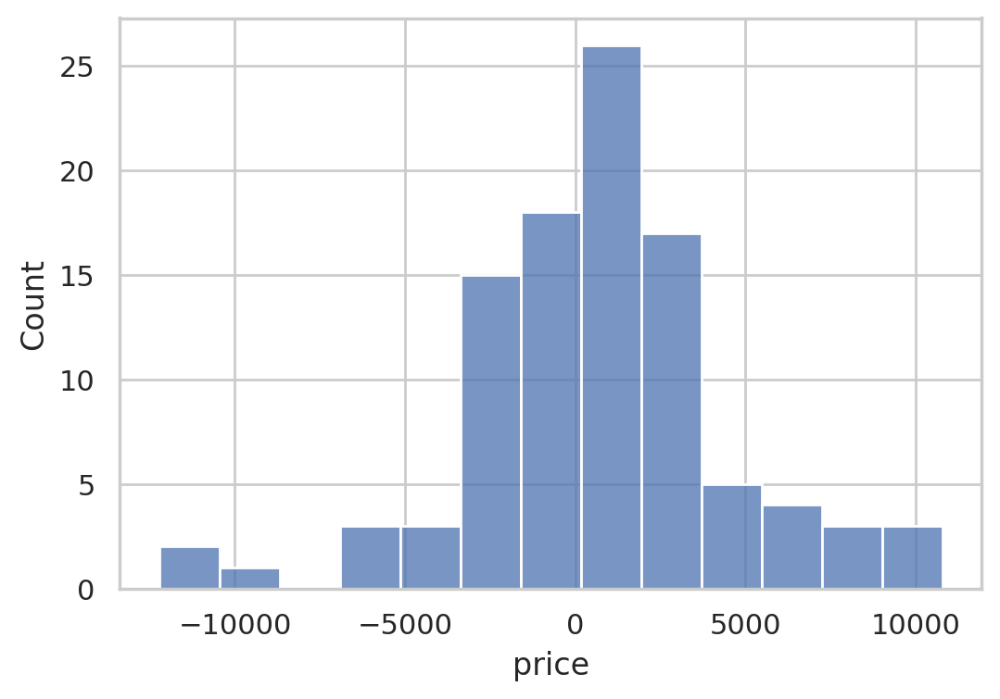

In [330]:
sns.histplot(residuals.sample(100));

All the three models

Certainly! Here's a breakdown of steps for model evaluation and analysis:

1. Evaluate Selected Model(s) with Cross-Validation:
Use cross-validation to evaluate the performance of the chosen model(s).
Calculate metrics like mean absolute error (MAE), mean squared error (MSE), or R-squared.
Utilize cross_val_score from Scikit-learn to perform cross-validation.
2. Analyse Actual vs. Predicted Plot:
Plot actual vs. predicted values to visualize how well the model predicts the target variable.
A scatter plot can demonstrate how closely the predicted values align with the actual ones.
3. Feature Importance Insights:
For decision tree-based models, like Decision Trees or Random Forests, assess feature importance.
Use the .feature_importances_ attribute to understand which features contribute most to the model's predictions.
4. Analyse Individual Predictions:
Review specific instances where the model performs well or poorly.
Identify outliers or instances with high prediction errors to gain insights into potential model weaknesses.
5. Distribution of Scores/Losses:
Plot the distribution of prediction errors or residuals.
This helps understand the spread and concentration of errors around the predictions.
6. Interpretable Model Structure:
For interpretable models like Linear Regression, briefly discuss the model structure.
Interpret coefficients and their significance, if relevant.
